# Project: Advanced Lane Finding

In this project, the goal is to write a software pipeline to identify the lane boundaries in a video from a front-facing camera on a car. 

In [ ]:
# Project stpes include:
# 1. Camera calibration
# 2. Distortion correction
# 3. Color/gradient threshold
# 4. Perspective transform
# 5. Detect lane lines
# 6. Determine the lane curvature

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
%matplotlib inline

## Read in Images and use cv2.findChessboardCorners to find corners

This is image is:  <class 'numpy.ndarray'> with dimensions:  (720, 1280, 3)
True


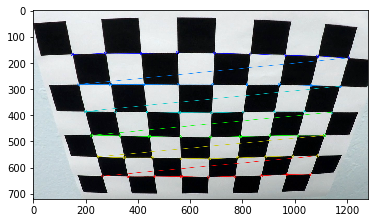

In [2]:
#image = mpimg.imread('test_images/test5.jpg')
fname = 'camera_cal/calibration2.jpg'
#fname = 'test_images/test1.jpg'
org_img = cv2.imread(fname)
print ('This is image is: ', type(org_img), 'with dimensions: ', org_img.shape)
plt.imshow(org_img)
img = np.copy(org_img)
gray = cv2.cvtColor(org_img, cv2.COLOR_BGR2GRAY)
#plt.imshow(gray)
nx = 9
ny = 6
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
print (ret)
if ret == True:
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)

## Camera calibration and correct distortion

use cv2.calibrateCamera and cv2.undistort to perform camera calibration, image distortion correction and returns the undistorted images and calibration matrix

In [3]:
def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1],img.shape[0]), None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return mtx, dist, undist

def plot3(img1, img1_name, img2=None, img2_name=None ,img3=None, img3_name=None):
    if (img2 is not None) and (img3 is not None):
        f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(24,9))
        f.tight_layout()
        ax1.imshow(img1)
        ax1.set_title(img1_name, fontsize=50)
        ax2.imshow(img2)
        ax2.set_title(img2_name, fontsize=50)
        ax3.imshow(img3)
        ax3.set_title(img3_name, fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    elif img2 is not None:
        f, (ax1, ax2) = plt.subplots(1,2, figsize=(24,9))
        f.tight_layout()
        ax1.imshow(img1)
        ax1.set_title(img1_name, fontsize=50)
        ax2.imshow(img2)
        ax2.set_title(img2_name, fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        
    else:
        f, (ax1) = plt.subplots(1,1, figsize=(5,4))
        f.tight_layout()
        ax1.imshow(img1)
        ax1.set_title((img1_name + " (can't calibrate)"), fontsize=20)   
   

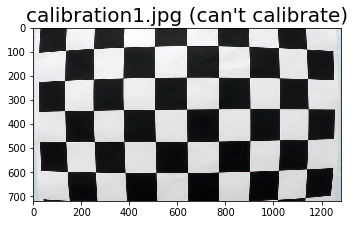

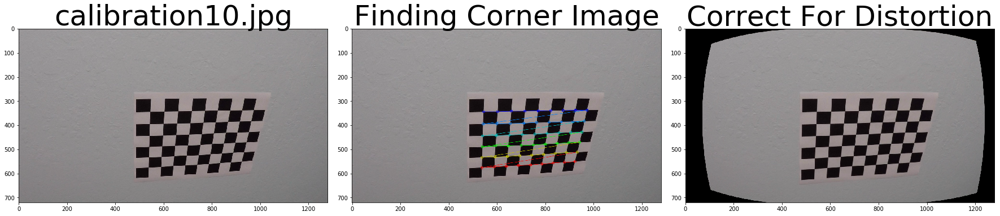

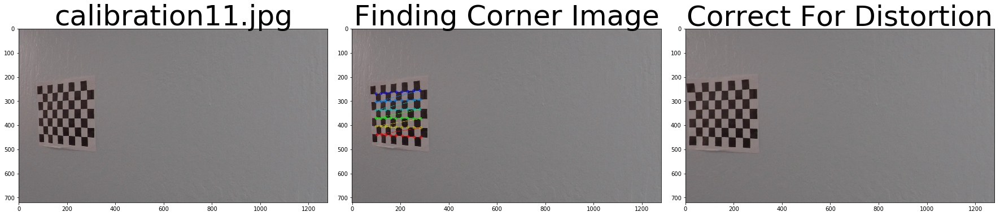

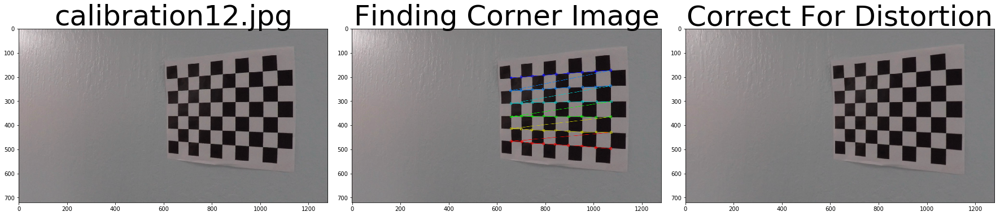

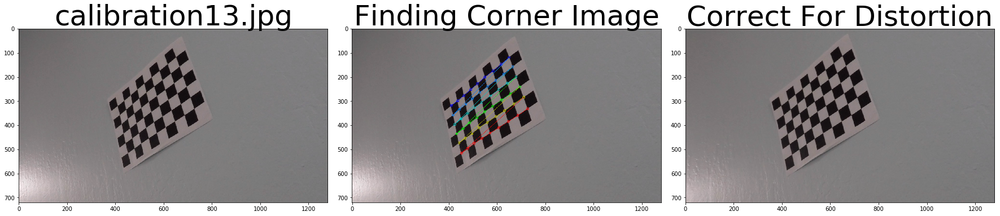

...

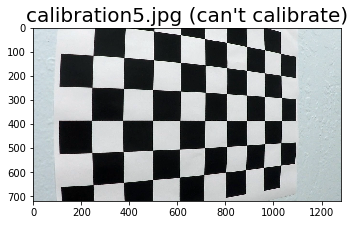

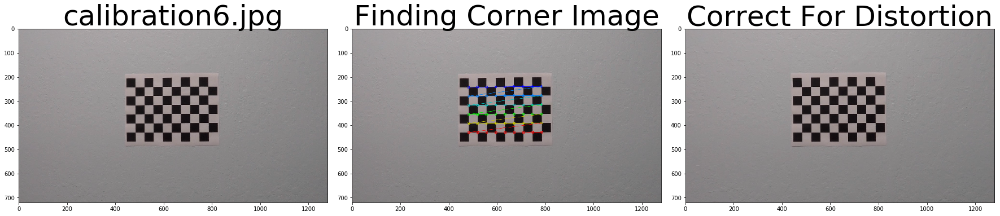

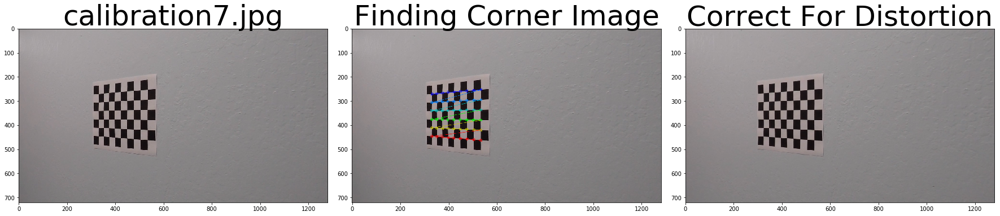

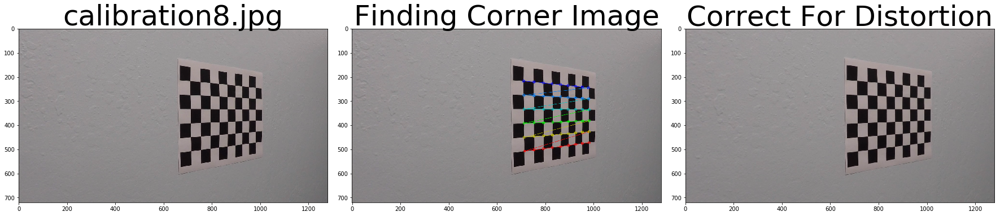

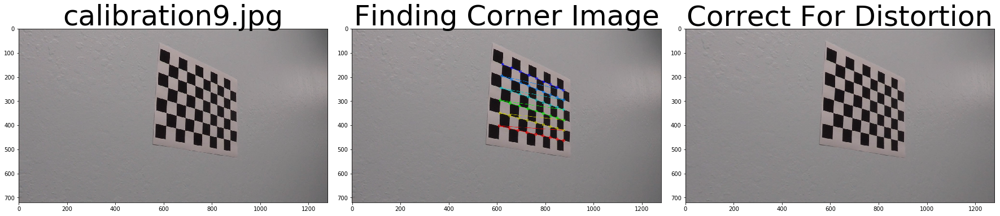

In [4]:
nx = 9
ny = 6

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
#images = ['camera_cal/calibration2.jpg']
#images = ['camera_cal/calibration1.jpg', 'camera_cal/calibration2.jpg']
#print (images.shape)

def camera_cal(images, nx, ny):
    #prepare object points, like (0,0,0), (1,0,0), (nx-1,ny-1,0)
    objp = np.zeros((ny*nx, 3),np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    #print (np.mgrid[0:nx, 0:ny].T)

    #Array to store object points and image points from all the images
    objpoints = [] #3D points in real world space
    imgpoints = [] #2D points in img plane
    #mtx = None
    #dist = None
    #undist = None

    #Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        image_name = fname.split('/')[1]
        #print (image_name)
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
        #find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        #print (ret)
    
        #If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            
            img_corner = np.copy(img)
            #Draw and display the corners
            cv2.drawChessboardCorners(img_corner, (nx, ny), corners, ret)
            
            #correct the distortion
            mtx, dist, undist = cal_undistort(img, objpoints, imgpoints)
            
            #plot org, finding corner and undist 
            plot3(img, image_name, img_corner, 'Finding Corner Image', undist, 'Correct For Distortion')
            
        else:
            plot3(img, image_name)
        
    return mtx, dist, undist
        
#cv2.destroyAllWindows()

mtx, dist, undist = camera_cal(images, nx, ny)

In [5]:
print (mtx)
print (dist)

[[  1.15396093e+03   0.00000000e+00   6.69705357e+02]
 [  0.00000000e+00   1.14802496e+03   3.85656234e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
[[ -2.41017956e-01  -5.30721173e-02  -1.15810355e-03  -1.28318856e-04
    2.67125290e-02]]


## use calibration matrix to undistort image get from camera

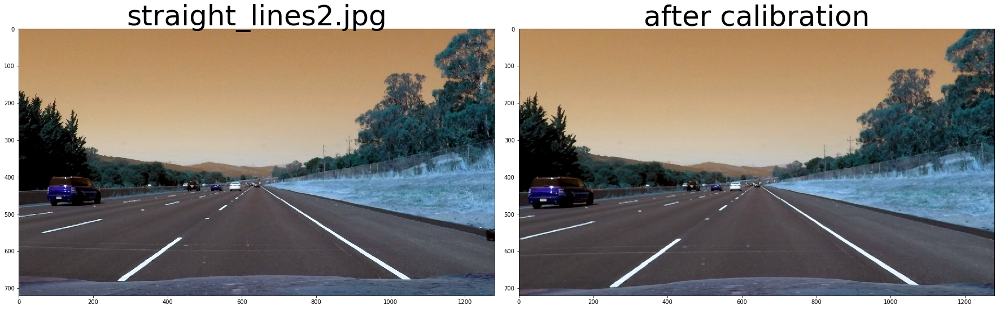

In [6]:
#test_undist_img_file = 'test_images/test4.jpg'
test_undist_img_file = 'test_images/straight_lines2.jpg'
#test_undist_img_file = 'test_images/ch_3.jpg'
test_undist_img = cv2.imread(test_undist_img_file)

result_undist = cv2.undistort(test_undist_img, mtx, dist, None, mtx)
plot3(test_undist_img, test_undist_img_file.split('/')[1], result_undist, 'after calibration')

## Color/gradient threshold

Use color and gradient transform to create a binary threshold image

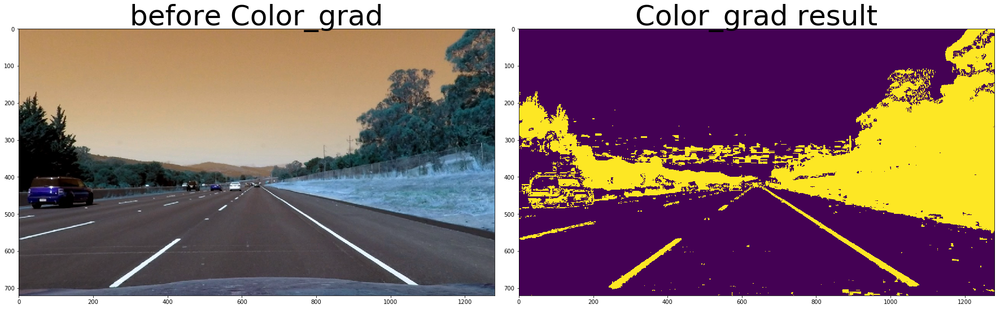

In [7]:
def color_grad(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    #Convert to HLS color space and seperate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    r = img[:,:,0]
    
    #plot3(h_channel, "h", r, "r", l_channel, "s")
    
    # Sobel x then take the absolute value
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # take the derivative in x
    #sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # take the derivative in y
    abs_sobelx = np.absolute(sobelx) # absolute x derivative to accentuate lines away
    
    #Scale to 8-bit (0-255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    #plot3(s_channel, "", scaled_sobel, "2")
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= s_thresh[1])] = 1
    
    #print (img.shape)
    vertices = np.array([[(400,500), (img.shape[1] - 400,500),
                   (img.shape[1], img.shape[0] * 0.95), (0, img.shape[0] * 0.95)]], np.int32)
    mask = np.zeros_like(scaled_sobel)
    #print (mask.shape, vertices.shape)
    cv2.fillPoly(mask, vertices, 255)
    masked = cv2.bitwise_and(sxbinary,mask)
    
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel >= 15) & (h_channel <= 100)] = 1
    
    r_binary = np.zeros_like(h_channel)
    r_binary[(r >= 200) & (r <= 255)] = 1
    
    #Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    #plot3(h_binary, "h_binary", sxbinary, "sxbinary", s_binary, "s_binary")
    
    #Stack each channel
    color_binary = np.dstack((np.zeros_like(sxbinary), masked, s_binary))
    
    #gray pic
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (h_binary == 1) | (sxbinary== 1)] = 1
    return combined_binary


result_colorgrad = color_grad(result_undist)
#print ("result_colorgrad", result_colorgrad.shape)

plot3(result_undist, 'before Color_grad', result_colorgrad, img2_name='Color_grad result')

# Perspective transform

use cv2.warpPerspective to perform Birds-eye view - image for the lane lines
return Birds-eye view image and inverse transform matrix

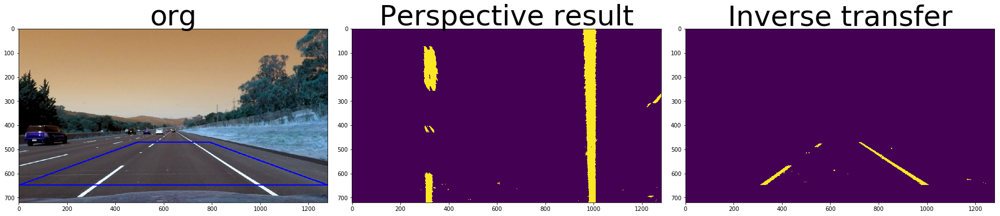

In [8]:
def perspective_transform(img):
    img_size = (img.shape[1], img.shape[0])
    #print ("alvin", img.shape[0], img.shape[1])
    #[0] height   [1] width
    offset = 100
    # Four source coordinate
    src = np.float32([[(490,470), (img.shape[1]-490,470),
                   (img.shape[1], img.shape[0]*0.9), (0, img.shape[0]*0.9)]])
        
    # Four desiredcoordinate
    dst = np.float32([[0, 0], [img.shape[1], 0],
                    [img.shape[1], img.shape[0]], [0, img.shape[0]]])
    
    # compute the perspective transform, M
    M = cv2.getPerspectiveTransform(src, dst)
    # could compute the inverse also by swapping the input parameter
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Create warped image - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, Minv

def region(img):
    img = np.copy(img)
    img_size = (img.shape[1], img.shape[0])
    
    src = np.array([[(490,470), (img.shape[1]-490,470),
                   (img.shape[1], img.shape[0]*0.9), (0, img.shape[0]*0.9)]], np.int32).reshape((-1,1,2))
    #print ("2: ", src2.shape)
    #print (src2)
    
    cv2.polylines(img, [src], True, (0,0,255), 3)
    return img

mask_perspective = region(result_undist)
result_perspective, Minv = perspective_transform(result_colorgrad)
#result_perspective, Minv = perspective_transform(mask_perspective)

test_Minv = cv2.warpPerspective(result_perspective, Minv, (mask_perspective.shape[1], mask_perspective.shape[0]), flags=cv2.INTER_LINEAR)
plot3(mask_perspective, 'org', result_perspective, 'Perspective result', test_Minv, "Inverse transfer")

## line detect

use sliding window to scan though bird-eye image to find the lanelines

In [9]:
def histogram(img):
    """
    input file should already been perspective transform
    """
    histogram = np.sum(img[int(img.shape[0]/2):, :], axis = 0)
    return histogram

def slidingWindow(binary_warped, plot=False):
    """
    Sliding the windows to find the lane lines
    """
    binary_warped = np.copy(binary_warped)
    # Assume you have created a warped binary image called binary_warped
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):, :], axis = 0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines, np.argmax retrun index
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #print (midpoint, leftx_base, rightx_base)
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero() # will seperate the row, col location into 2 []
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Create min number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    #print (nonzeroy)
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundary in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height # top y 
        win_y_high = binary_warped.shape[0] - (window) * window_height # bot y
        win_xleft_low = leftx_current - margin #left of left line
        win_xleft_high = leftx_current + margin #right of left line
        win_xright_low = rightx_current - margin #left of right line
        win_xright_high = rightx_current + margin #right of right line
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0,255,0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                        (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                        (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these ind to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    # Concatenate the arrays of ind
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
        
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]        
    #print (lefty)
        
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    #print (left_fit, right_fit)
        
        
    # Visualization
    if plot:
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0]) # start, end, N
        left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]  # Ay^2 + By + C
        right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
            
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.title('lane detect from sliding window')
    return left_fit, right_fit           

if already find the lane lines before, use the data as reference

In [10]:
def fit_frame(binary_warped, left_fit, right_fit, plot=False):
    # Assume you now have a new warped binary image
    # from the next frame of video(also called "binary warped")
    # It's now much more easier to find line pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy**2) + left_fit[1] * nonzeroy
                                  + left_fit[2] - margin)) & (nonzerox < (left_fit[0] * (nonzeroy**2) 
                                  + left_fit[1] * nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy**2) + right_fit[1] * nonzeroy
                                  + right_fit[2] - margin)) & (nonzerox < (right_fit[0] * (nonzeroy**2) 
                                  + right_fit[1] * nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel position
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    #print (lefty)
    
    if (len(rightx) == 0  or len(leftx) / len(rightx) >= 10):
        return np.polyfit(lefty, leftx, 2), np.polyfit(lefty, leftx, 2)
    if (len(leftx)== 0 or len(rightx) / len(leftx) >= 10):
        return np.polyfit(righty, rightx, 2), np.polyfit(righty, rightx, 2)
        
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    #print (left_fit, right_fit)
    
    if plot:
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0]) # start, end, N
        left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]  # Ay^2 + By + C
        right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
        
        # Create an img to draw on and an img to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        
        # Generate a polygon to illustrate the search window area
        # and recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))
        
        # Draw the lane onto the warped blank img
        cv2.fillPoly(window_img, np.int_(left_line_pts), (0,255,0))
        cv2.fillPoly(window_img, np.int_(right_line_pts), (0,255,0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    return left_fit, right_fit

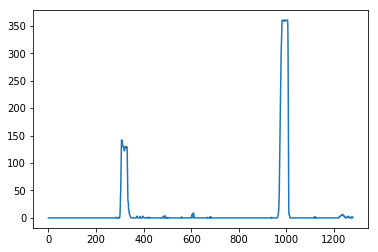

In [11]:
hist = histogram(result_perspective)
plt.plot(hist)
plt.show()

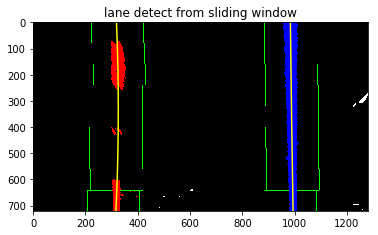

In [12]:
test_left_fit, test_right_fit = slidingWindow(result_perspective, plot=True)
#print (test_left_fit, test_right_fit)

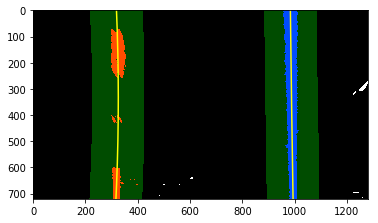

In [13]:
test_left_fit, test_right_fit = fit_frame(result_perspective, test_left_fit, test_right_fit, plot=True)

## Calculate the line curvature

Create some fake data and use them to calculate the line curvature

1554.52654914 1585.04739556
510.517739357 m 520.590345681 m


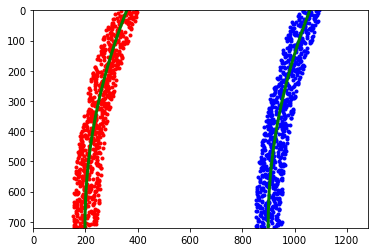

In [14]:
# Generate some fake data to represent lane-line pixels
ploty = np.linspace(0, 719, num=720) # to cover same y-range as img
quadractic_coeff = 3e-4 # arbitrary quardratic coefficient
# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([200 + (y**2) * quadractic_coeff + np.random.randint(-50, high=51)
                 for y in ploty])
rightx = np.array([900 + (y**2) * quadractic_coeff + np.random.randint(-50, high=51)
                 for y in ploty])
leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1] # Reverse to match top-to-bottom in y

# Fit a second order polynomial to pixel position in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

# Define y-value where we want radius of curvature
# choose the max y-value, corresponding to the bottom of the img
y_eval = np.max(ploty)
left_curverad = ((1 + (2 * left_fit[0] * y_eval + left_fit[1])**2)**1.5) / np.absolute(2 * left_fit[0])
right_curverad = ((1 + (2 * right_fit[0] * y_eval + right_fit[1])**2)**1.5) / np.absolute(2 * right_fit[0])
print (left_curverad, right_curverad)

##
ym_per_pix = 30/720  # meterrs per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
#ploty = np.linspace(0, 719, num=720) # to cover same y-range as img
    
# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty * ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty * ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radius of curvature
left_curverad2 = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2 * left_fit_cr[0])
right_curverad2 = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2 * right_fit_cr[0])
print (left_curverad2, 'm', right_curverad2, 'm')

transform the pixel unit to real world meter unit

In [15]:
def curvature(left_fit, right_fit):
    # Define conversions to x,y in world space
    ym_per_pix = 30/720  # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    #print (ym_per_pix, xm_per_pix)
    
    ploty = np.linspace(0, 719, num=720) # to cover same y-range as img
    y_eval = np.max(ploty)
    #print (y_eval)
    
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]    
    
    #print ('left', left_fitx[0])
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty * ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, right_fitx*xm_per_pix, 2)
    #print ('left_cr', left_fit_cr)
    # Calculate the new radius of curvature
    left_curverad2 = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2 * left_fit_cr[0])
    right_curverad2 = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2 * right_fit_cr[0])
    return left_curverad2, right_curverad2

#print (left_curverad, right_curverad)
left, right = curvature(left_fit, right_fit)
print ('fake data',left, 'm', right, 'm')

print (left_fit, test_left_fit)
proj_left, proj_right = curvature(test_left_fit, test_right_fit)
print (proj_left, 'm', proj_right, 'm')

fake data 510.517739357 m 520.590345681 m
[  3.21687362e-04  -4.52819597e-01   3.58069706e+02] [ -6.13319773e-05   4.12531943e-02   3.18909239e+02]
2677.81130809 m 51266.5564847 m


## Draw

visulaize the leftline and right line with cv2.polylines()

[ -6.13319773e-05   4.12531943e-02   3.18909239e+02] [  3.20341001e-06   1.18511719e-02   9.83747226e+02]


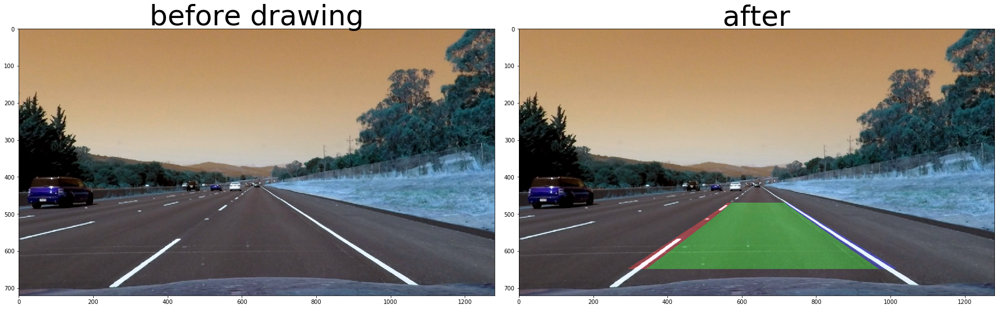

In [16]:
def draw_zone(img, binary_warped, left_fit, right_fit, Minv):
    #print (left_fit)
    # Generate x and  y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0]) # start, end, N
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]  # Ay^2 + By + C
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
        
    # Create an img to draw on and an img to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    
    # Calculate all the x and y point
    left_pt = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_pt = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    #print (right_pt)
    pt = np.hstack((left_pt, right_pt))

    # Draw left and right line and polyfill the zone
    cv2.fillPoly(window_img, np.int_(pt), (0,255,0))
    #plt.plot(left_fitx, ploty, color='red', linewidth=3)
    #plt.plot(right_fitx, ploty, color='blue', linewidth=3)
    cv2.polylines(window_img, np.int_(left_pt), False, (255,0,0), 50)
    cv2.polylines(window_img, np.int_(right_pt), False, (0,0,255), 50)
    tmp = cv2.addWeighted(window_img, 1, out_img, 0.3, 0)
    #plt.imshow(tmp)
    #plt.imshow(window_img)

    
    # use Minv to transfer curve line back to org location
    warped = cv2.warpPerspective(window_img, Minv, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)    
    # combine the result with org img
    result = cv2.addWeighted(img, 1, warped, 0.3, 0)
    #plt.imshow(warped)
    #plt.imshow(result)
    return result

#test_pipeline_image = 'test_images/straight_lines2.jpg'
#test_pipeline_image = 'test_images/test2.jpg'
#test_draw_img = cv2.imread('test_images/test4.jpg')
#plot3(test_img, "org")
print (test_left_fit, test_right_fit)
test_reverse = draw_zone(result_undist, result_perspective, test_left_fit, test_right_fit, Minv)
#plt.imshow(test_reverse)
plot3(result_undist, 'before drawing', test_reverse, 'after')

## Tracking

keep track of things like where the last several detections of the lane lines were and what the curvature was

In [17]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # n number of data saved
        self.n = 0
        # x values of the last n fits of the line
        self.recent_xfitted = []
        # average x values of the fitted line over the last n iterations
        self.bestx = None
        # polynomial coefficients averaged over the last n iteration
        self.best_fit = None
        
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        # radius of curvature of the line in some units
        self.radius_of_curvature = None
        # distance in meters of vehicle center from the line
        self.line_base_pos = None
        # distance in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        # x values for detected line pixels
        self.allx = None
        # y values for detected line pixels
        self.ally = None
        
    #function
    def reset(self):
        self.detected = False
        self.n = 0
        self.bestx = None
        self.best_fit = None
        self.radius_of_curvature = None
        self.line_base_pos = None
            
    def set_x(self, linefit, x, y):
        xloc = linefit[0] * y ** 2 + linefit[1] * y + linefit[2] # Ay^2 + By + C
        self.recent_xfitted.append(xloc)
        while (len(self.recent_xfitted) > 15):
            self.recent_xfitted.pop(0)
            self.n = len(self.recent_xfitted)
        self.bestx = np.average(self.recent_xfitted)
        self.line_base_pos = np.absolute(np.int(x/2) - self.bestx)
            
    def set_best_fit(self):
        if self.best_fit == None:
            self.best_fit = self.current_fit
        else:
            self.best_fit = (self.best_fit * (len(self.recent_xfitted) - 1) + self.current_fit) / len(self.recent_xfitted)
        
    def pass_sanity(self, linefit):
        #if len(self.recent_xfitted) >= 5:
        margin = 100
        if self.bestx != None and np.absolute((linefit[0] * 719 ** 2 + linefit[1] * 719 + 
                                               linefit[2]) - self.bestx) > margin:
            return
        
        self.detected = True
        self.set_x(linefit, 1279, 719)
        self.current_fit = linefit
        #print ("self", self.current_fit)
        self.set_best_fit()
        
    def not_pass_sanity_check(self):
        print ("len", len(self.recent_xfitted))
        if len(self.recent_xfitted) >= 1:
            self.current_fit = self.best_fit
            self.recent_xfitted.pop(0)
        else:
            self.reset()


## Sanity Check

Checking that whether left lines and right lines are good 

In [18]:
def isSilmiarCurvature(left_fit, right_fit, thresh=(0.02, 50)):
    left_radius, right_radius = curvature(left_fit, right_fit)
    #print ("aaa", left, right)
    #print (np.absolute(left - right))
    #print (np.absolute(left - right) / left)
    ratio = left_radius / right_radius
    print ('ratio', ratio)
    return (ratio > thresh[0]) and (ratio < thresh[1])

    
def isRightDist(left_fit, right_fit, thresh=(450, 900)):
    left_fitx = left_fit[0] * 719**2 + left_fit[1] * 719 + left_fit[2] # Ay^2 + By + C
    right_fitx = right_fit[0] * 719**2 + right_fit[1] * 719 + right_fit[2]
    neardis = right_fitx - left_fitx
    print ('neardis', neardis)
    return neardis >= thresh[0] and neardis <= thresh[1]
    
    
def isParallel(left_fit, right_fit, thresh=(400, 900)):
    #fardis = np.absolute(right_fit[2] - left_fit[2])
    #dl = 2 * left_fit[0] * 400 + left_fit[1]
    #dr = 2 * right_fit[0] * 400 + right_fit[1]
    farl = left_fit[0] * 350**2 + left_fit[1] * 350 + left_fit[2] # Ay^2 + By + C
    farr = right_fit[0] * 350**2 + right_fit[1] * 350 + right_fit[2]
    diff = np.absolute(farl - farr)
    #diff = np.absolute(dl/dr)
    print ('diff', diff)
    return diff >= thresh[0] and diff <= thresh[1]

In [19]:
# Initial global parameter
leftline = Line()
rightline = Line()

## Pipeline

In [ ]:
#1. use distortion image matrix to undist input image, 
#2. then generate binary threshold image and transform the lane lines into bird-eye view
#3. find and calculate the left nd right line function # Ay^2 + By + C
#4. use lines info to calculate curvature and offset

ratio 0.0519888094554
neardis 677.13170368
diff 662.45626702


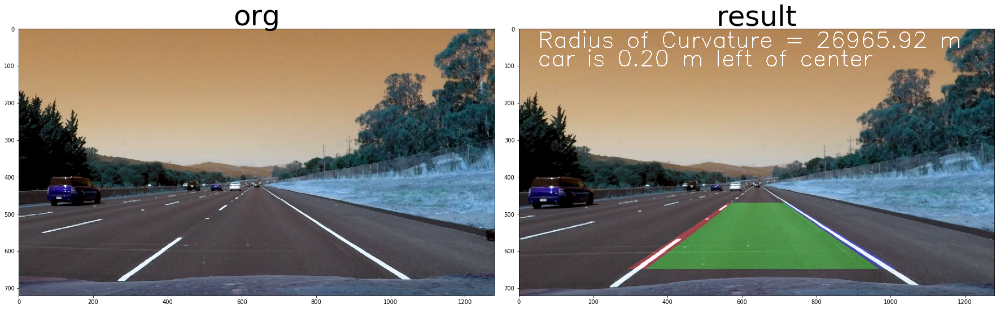

In [20]:
def pipeline(img):
    global leftline, rightline
    
    #print ("best", leftline.best_fit, rightline.best_fit)
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    colorgrad = color_grad(undist)
    #plot3(undist, 'org', colorgrad, img2_name='Color_grad result')

    warped_binary, Minv = perspective_transform(colorgrad)

    if leftline.detected and rightline.detected:
        #print ("found")
        left_fit, right_fit = fit_frame(warped_binary, leftline.best_fit, rightline.best_fit, plot=False)

            
        if np.array_equal(left_fit, right_fit):
            left_fit[2] = leftline.bestx
            right_fit[2] = rightline.bestx
            print ("same", left_fit, right_fit)
            
    else:
        #print ("new")
        left_fit, right_fit = slidingWindow(warped_binary, plot=False)

    # sanity check
    if (isSilmiarCurvature(left_fit, right_fit) and isRightDist(left_fit, right_fit) and isParallel(left_fit, right_fit,)):
        #print ("pass sanity check")        
        leftline.pass_sanity(left_fit)
        rightline.pass_sanity(right_fit)
        leftline.radius_of_curvature, rightline.radius_of_curvature = curvature(left_fit, right_fit)
    else:
        #print ("no pass sanity check")
        leftline.not_pass_sanity_check()
        rightline.not_pass_sanity_check()
        
        
    #add some info to the output image
    result = draw_zone(undist, warped_binary, leftline.best_fit, rightline.best_fit, Minv)
    linecenter = (leftline.line_base_pos + rightline.line_base_pos)

    xm_per_pix = 3.7/700
    offset = np.absolute((linecenter - undist.shape[1]/2) * xm_per_pix)
    
    if offset >0:
        direction = "left"
    else:
        direction = "right"
        
    radius = (leftline.radius_of_curvature + rightline.radius_of_curvature)/2
    #print ("cur", radius2, radius)
    
    # Add radius and direction info to img
    cv2.putText(result, "car is %.2f m %s of center" %(offset, direction), (50,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255,255), 2)
    cv2.putText(result, "Radius of Curvature = %.2f m" %(radius), (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255,255), 2)

    return result

img = cv2.imread('test_images/straight_lines2.jpg')
#img = cv2.imread('test_images/ch_3.jpg')
#img = cv2.imread('test_images/test4.jpg')

result = pipeline(img)
#print (leftline.best_fit)
plot3(img, 'org', result, 'result')
#plt.imshow(result)

In [21]:
# Initial global parameter
leftline = Line()
rightline = Line()

In [22]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
project_output = 'project_output.mp4'
clip2 = VideoFileClip('project_video.mp4')
project_clip = clip2.fl_image(pipeline)
print ("aa")
%time project_clip.write_videofile(project_output, audio=False)

ratio 0.645604726378
neardis 700.467620619
diff 666.636941875
aa
[MoviePy] >>>> Building video project_output.mp4
[MoviePy] Writing video project_output.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

ratio

  0%|          | 1/1261 [00:00<05:23,  3.89it/s]

 0.642301272537
neardis 700.394122764
diff 666.729255864


  0%|          | 2/1261 [00:00<05:48,  3.62it/s]

ratio 0.159316014217
neardis 702.661473645
diff 659.216779863


  0%|          | 3/1261 [00:00<05:48,  3.61it/s]

ratio 0.304477499687
neardis 697.953955947
diff 656.969234733


  0%|          | 4/1261 [00:01<05:48,  3.61it/s]

ratio 0.484682636831
neardis 692.009790432
diff 655.664226341


  0%|          | 5/1261 [00:01<05:50,  3.58it/s]

ratio 0.955007573536
neardis 689.709320543
diff 657.240516905


  0%|          | 6/1261 [00:01<06:14,  3.35it/s]

ratio 0.813955127926
neardis 687.780255743
diff 652.647998767


  1%|          | 7/1261 [00:02<06:11,  3.38it/s]

ratio 0.879388224956
neardis 686.86948157
diff 655.718188214


  1%|          | 8/1261 [00:02<06:00,  3.48it/s]

ratio 1.06235574135
neardis 682.326904761
diff 651.280602442


  1%|          | 9/1261 [00:02<05:57,  3.51it/s]

ratio 1.79326493882
neardis 675.958349067
diff 656.459497377


  1%|          | 10/1261 [00:02<05:56,  3.51it/s]

ratio 1.53415946158
neardis 680.434878613
diff 657.466411782


  1%|          | 11/1261 [00:03<05:42,  3.65it/s]

ratio 0.974505122338
neardis 686.590350503
diff 653.295914562


  1%|          | 12/1261 [00:03<05:38,  3.69it/s]

ratio 0.841282532394
neardis 691.832786002
diff 665.900094387


  1%|          | 13/1261 [00:03<05:34,  3.73it/s]

ratio 0.291343452396
neardis 699.686053316
diff 659.377218921


  1%|          | 14/1261 [00:03<05:30,  3.77it/s]

ratio 0.122312252679
neardis 701.992152248
diff 656.210509094


  1%|          | 15/1261 [00:04<05:36,  3.70it/s]

ratio 0.134774323245
neardis 694.298201845
diff 647.660485048


  1%|▏         | 16/1261 [00:04<05:33,  3.74it/s]

ratio 0.00460978270159
len 15
len 15


  1%|▏         | 17/1261 [00:04<05:22,  3.85it/s]

ratio 0.739905109774
neardis 677.368735041
diff 642.839768868


  1%|▏         | 18/1261 [00:04<05:15,  3.94it/s]

ratio 0.390819839909
neardis 675.639106875
diff 640.249985852


  2%|▏         | 19/1261 [00:05<05:19,  3.88it/s]

ratio 0.280132123156
neardis 676.189438548
diff 647.014643666


  2%|▏         | 20/1261 [00:05<05:19,  3.89it/s]

ratio 1.26156736352
neardis 670.389331332
diff 652.912304484


  2%|▏         | 21/1261 [00:05<05:23,  3.83it/s]

ratio 0.881305448577
neardis 676.584774314
diff 659.82561571


  2%|▏         | 22/1261 [00:05<05:14,  3.94it/s]

ratio 3.16519552439
neardis 672.05606944
diff 669.059615143


  2%|▏         | 23/1261 [00:06<05:09,  4.00it/s]

ratio 13.9299034863
neardis 670.799743417
diff 676.514218925


  2%|▏         | 24/1261 [00:06<05:06,  4.04it/s]

ratio 3.27212986088
neardis 679.408643
diff 672.404143682


  2%|▏         | 25/1261 [00:06<05:00,  4.12it/s]

ratio 3.63181999031
neardis 677.364361608
diff 670.454917667


  2%|▏         | 26/1261 [00:06<05:02,  4.08it/s]

ratio 3.96857421234
neardis 687.382360061
diff 678.835297195


  2%|▏         | 27/1261 [00:07<04:59,  4.12it/s]

ratio 1.1850766687
neardis 698.480091167
diff 676.961509248


  2%|▏         | 28/1261 [00:07<04:53,  4.19it/s]

ratio 0.547124468772
neardis 705.766247284
diff 683.726110138


  2%|▏         | 29/1261 [00:07<04:53,  4.20it/s]

ratio 0.538100854493
neardis 701.585032675
diff 679.577868288


  2%|▏         | 30/1261 [00:07<04:54,  4.18it/s]

ratio 0.403882585039
neardis 701.190492239
diff 672.496885515


  2%|▏         | 31/1261 [00:08<04:51,  4.22it/s]

ratio 0.55898367844
neardis 698.8600742
diff 664.716106549


  3%|▎         | 32/1261 [00:08<04:49,  4.25it/s]

ratio 0.574538048389
neardis 694.406306819
diff 656.105779442


  3%|▎         | 33/1261 [00:08<04:47,  4.28it/s]

ratio 0.556245336751
neardis 698.193636382
diff 662.511229001


  3%|▎         | 34/1261 [00:08<04:50,  4.23it/s]

ratio 1.60849096024
neardis 683.649777168
diff 660.5567024


  3%|▎         | 35/1261 [00:09<04:44,  4.31it/s]

ratio 1.83396310446
neardis 686.083671074
diff 659.569376878


  3%|▎         | 36/1261 [00:09<04:41,  4.35it/s]

ratio 1.26032017111
neardis 688.170501902
diff 653.26770141


  3%|▎         | 37/1261 [00:09<04:41,  4.34it/s]

ratio 0.874025005505
neardis 695.254436679
diff 647.406592557


  3%|▎         | 38/1261 [00:09<04:44,  4.30it/s]

ratio 0.363639854976
neardis 699.505679826
diff 641.068195547


  3%|▎         | 39/1261 [00:09<04:39,  4.37it/s]

ratio 0.210570242338
neardis 696.465186837
diff 633.634113859


  3%|▎         | 40/1261 [00:10<04:38,  4.38it/s]

ratio 0.309275029222
neardis 692.45271749
diff 637.713716078


  3%|▎         | 41/1261 [00:10<05:03,  4.03it/s]

ratio 0.0690196668761
neardis 690.349656708
diff 635.079007785


  3%|▎         | 42/1261 [00:10<05:05,  3.99it/s]

ratio 0.743659237452
neardis 683.123991162
diff 642.471483971


  3%|▎         | 43/1261 [00:11<05:30,  3.68it/s]

ratio 0.810651998145
neardis 683.797324321
diff 646.858660977


  3%|▎         | 44/1261 [00:11<05:32,  3.66it/s]

ratio 0.540871620266
neardis 687.268453256
diff 651.166271337


  4%|▎         | 45/1261 [00:11<06:48,  2.98it/s]

ratio 0.631527122649
neardis 682.487268527
diff 655.046638325


  4%|▎         | 46/1261 [00:12<06:16,  3.22it/s]

ratio 0.751922738653
neardis 681.001676236
diff 656.768228816


  4%|▎         | 47/1261 [00:12<05:55,  3.41it/s]

ratio 1.10779757714
neardis 679.043557215
diff 660.734246631


  4%|▍         | 48/1261 [00:12<05:54,  3.42it/s]

ratio 1.40176676166
neardis 678.352936216
diff 658.715935802


  4%|▍         | 49/1261 [00:12<05:42,  3.54it/s]

ratio 1.22066295728
neardis 685.291631558
diff 665.528916475


  4%|▍         | 50/1261 [00:13<05:28,  3.69it/s]

ratio 1.01569161461
neardis 685.440028223
diff 664.014284343


  4%|▍         | 51/1261 [00:13<05:21,  3.76it/s]

ratio 0.759325838054
neardis 689.58253809
diff 662.767686883


  4%|▍         | 52/1261 [00:13<05:18,  3.79it/s]

ratio 0.103593148261
neardis 695.462033577
diff 652.467317146


  4%|▍         | 53/1261 [00:13<05:10,  3.89it/s]

ratio 0.429025829717
neardis 687.517853984
diff 653.520246315


  4%|▍         | 54/1261 [00:14<05:10,  3.88it/s]

ratio 0.51829571008
neardis 681.688984646
diff 652.454963137


  4%|▍         | 55/1261 [00:14<05:06,  3.94it/s]

ratio 0.763555521354
neardis 681.822412902
diff 656.245246144


  4%|▍         | 56/1261 [00:14<05:16,  3.80it/s]

ratio 0.869259338192
neardis 683.163870227
diff 660.17015996


  5%|▍         | 57/1261 [00:14<05:13,  3.84it/s]

ratio 0.970276690628
neardis 682.24168025
diff 660.558094352


  5%|▍         | 58/1261 [00:15<05:10,  3.87it/s]

ratio 1.56634027315
neardis 678.830800171
diff 662.871421486


  5%|▍         | 59/1261 [00:15<05:06,  3.92it/s]

ratio 8.19567762871
neardis 663.260401685
diff 656.346271385


  5%|▍         | 60/1261 [00:15<05:08,  3.90it/s]

ratio 5.51007728408
neardis 671.079512637
diff 647.049450747


  5%|▍         | 61/1261 [00:15<05:03,  3.95it/s]

ratio 2.62653169313
neardis 672.902597482
diff 642.51302642


  5%|▍         | 62/1261 [00:16<05:04,  3.94it/s]

ratio 1.65670296765
neardis 679.024610769
diff 635.780334389


  5%|▍         | 63/1261 [00:16<05:04,  3.93it/s]

ratio 0.66446749178
neardis 686.564374728
diff 636.157164774


  5%|▌         | 64/1261 [00:16<05:07,  3.89it/s]

ratio 0.402044983717
neardis 687.03764539
diff 631.833646449


  5%|▌         | 65/1261 [00:16<05:01,  3.96it/s]

ratio 0.176402991933
neardis 689.338977382
diff 634.114950976


  5%|▌         | 66/1261 [00:17<05:00,  3.98it/s]

ratio 0.735768473528
neardis 683.772444895
diff 633.952890949


  5%|▌         | 67/1261 [00:17<05:11,  3.83it/s]

ratio 0.77745954181
neardis 681.057834883
diff 634.730177294


  5%|▌         | 68/1261 [00:17<05:10,  3.84it/s]

ratio 0.307203821291
neardis 683.493719106
diff 637.514910809


  5%|▌         | 69/1261 [00:17<05:08,  3.86it/s]

ratio 0.239964813825
neardis 682.930491474
diff 631.52112823


  6%|▌         | 70/1261 [00:18<05:07,  3.88it/s]

ratio 0.127872284195
neardis 693.84201911
diff 638.262665182


  6%|▌         | 71/1261 [00:18<05:04,  3.91it/s]

ratio 1.22281086024
neardis 667.878529639
diff 638.373500136


  6%|▌         | 72/1261 [00:18<05:04,  3.91it/s]

ratio 1.47756551655
neardis 667.645664424
diff 642.407750512


  6%|▌         | 73/1261 [00:19<05:09,  3.84it/s]

ratio 1.12331132075
neardis 674.839949867
diff 644.389936067


  6%|▌         | 74/1261 [00:19<05:15,  3.76it/s]

ratio 1.29965523319
neardis 673.478452163
diff 645.647731027


  6%|▌         | 75/1261 [00:19<05:15,  3.76it/s]

ratio 1.74559383976
neardis 668.025906082
diff 652.045751271


  6%|▌         | 76/1261 [00:19<05:27,  3.62it/s]

ratio 1.06883142148
neardis 675.453017897
diff 649.701492339


  6%|▌         | 77/1261 [00:20<05:21,  3.69it/s]

ratio 1.09751080828
neardis 680.764123432
diff 661.824910572


  6%|▌         | 78/1261 [00:20<05:16,  3.73it/s]

ratio 0.271793205669
neardis 686.384542366
diff 661.59621585


  6%|▋         | 79/1261 [00:20<05:09,  3.82it/s]

ratio 0.871373244507
neardis 687.126759925
diff 668.906549156


  6%|▋         | 80/1261 [00:20<05:08,  3.83it/s]

ratio 0.728261939856
neardis 685.193798898
diff 669.969603473


  6%|▋         | 81/1261 [00:21<05:03,  3.88it/s]

ratio 4.37224781615
neardis 682.29622774
diff 670.748676492


  7%|▋         | 82/1261 [00:21<04:59,  3.94it/s]

ratio 3.24601479328
neardis 685.053921563
diff 672.738699098


  7%|▋         | 83/1261 [00:21<05:00,  3.92it/s]

ratio 1.26861633569
neardis 695.508021684
diff 673.235078392


  7%|▋         | 84/1261 [00:21<04:57,  3.95it/s]

ratio 2.12901206384
neardis 697.257238935
diff 685.920821173


  7%|▋         | 85/1261 [00:22<04:55,  3.98it/s]

ratio 4.28444773023
neardis 694.547635564
diff 686.454094788


  7%|▋         | 86/1261 [00:22<04:56,  3.97it/s]

ratio 4.81255358522
neardis 689.949260257
diff 685.471850915


  7%|▋         | 87/1261 [00:22<05:05,  3.84it/s]

ratio 3.82634147837
neardis 688.444724545
diff 671.525023159


  7%|▋         | 88/1261 [00:22<05:04,  3.85it/s]

ratio 1.98529483331
neardis 695.22214261
diff 659.645771265


  7%|▋         | 89/1261 [00:23<05:09,  3.79it/s]

ratio 0.179288306557
neardis 703.623947519
diff 647.791472528


  7%|▋         | 90/1261 [00:23<05:16,  3.70it/s]

ratio 0.112070936593
neardis 697.495789858
diff 636.427719321


  7%|▋         | 91/1261 [00:23<05:13,  3.74it/s]

ratio 0.0887366363045
neardis 697.348756076
diff 640.624874156


  7%|▋         | 92/1261 [00:23<05:10,  3.77it/s]

ratio 0.65007279337
neardis 692.288955297
diff 644.220096411


  7%|▋         | 93/1261 [00:24<05:04,  3.84it/s]

ratio 0.559383483251
neardis 688.861077985
diff 638.65479587


  7%|▋         | 94/1261 [00:24<05:07,  3.80it/s]

ratio 0.541210562364
neardis 686.018474721
diff 637.290065458


  8%|▊         | 95/1261 [00:24<05:09,  3.76it/s]

ratio 0.51430852318
neardis 683.321340809
diff 640.178033622


  8%|▊         | 96/1261 [00:25<05:08,  3.78it/s]

ratio 1.06775516936
neardis 673.864209606
diff 642.203211748


  8%|▊         | 97/1261 [00:25<05:06,  3.80it/s]

ratio 1.69863160209
neardis 667.536175624
diff 641.862243704


  8%|▊         | 98/1261 [00:25<05:04,  3.81it/s]

ratio 1.67071324833
neardis 672.005830741
diff 647.499574189


  8%|▊         | 99/1261 [00:25<05:04,  3.82it/s]

ratio 1.19254431614
neardis 675.062420565
diff 641.788798623


  8%|▊         | 100/1261 [00:26<05:05,  3.80it/s]

ratio 1.47848030712
neardis 672.728698351
diff 646.587109284


  8%|▊         | 101/1261 [00:26<05:04,  3.82it/s]

ratio 0.880206133588
neardis 680.308394707
diff 642.530072864


  8%|▊         | 102/1261 [00:26<05:04,  3.81it/s]

ratio 0.690060125032
neardis 678.054988041
diff 639.086418965


  8%|▊         | 103/1261 [00:26<05:01,  3.83it/s]

ratio 0.633492731128
neardis 680.34289074
diff 639.002410054


  8%|▊         | 104/1261 [00:27<04:59,  3.86it/s]

ratio 0.815181769764
neardis 676.574006272
diff 642.373961529


  8%|▊         | 105/1261 [00:27<05:03,  3.81it/s]

ratio 0.19983055406
neardis 679.96619231
diff 649.068956967


  8%|▊         | 106/1261 [00:27<04:59,  3.85it/s]

ratio 1.60656064202
neardis 680.1284553
diff 658.386342497


  8%|▊         | 107/1261 [00:27<05:00,  3.84it/s]

ratio 1.25450946193
neardis 684.455249797
diff 663.302031243


  9%|▊         | 108/1261 [00:28<05:01,  3.82it/s]

ratio 0.414395117657
neardis 690.887806949
diff 656.227884897


  9%|▊         | 109/1261 [00:28<04:57,  3.87it/s]

ratio 2.39748510576
neardis 674.132302259
diff 657.189372966


  9%|▊         | 110/1261 [00:28<04:55,  3.90it/s]

ratio 2.83061556079
neardis 673.894377946
diff 658.074239959


  9%|▉         | 111/1261 [00:28<04:59,  3.84it/s]

ratio 1.61500124577
neardis 681.200099276
diff 655.382535568


  9%|▉         | 112/1261 [00:29<04:55,  3.89it/s]

ratio 1.31255294787
neardis 686.797280771
diff 665.065950407


  9%|▉         | 113/1261 [00:29<04:53,  3.91it/s]

ratio 1.18587837932
neardis 685.877898695
diff 658.023995271


  9%|▉         | 114/1261 [00:29<04:51,  3.94it/s]

ratio 0.533292348834
neardis 691.827576468
diff 653.754250993


  9%|▉         | 115/1261 [00:29<04:56,  3.86it/s]

ratio 0.213177727505
neardis 693.97130649
diff 645.686296624


  9%|▉         | 116/1261 [00:30<04:55,  3.87it/s]

ratio 0.375633727287
neardis 686.634137431
diff 643.762734671


  9%|▉         | 117/1261 [00:30<04:57,  3.85it/s]

ratio 0.428753721197
neardis 683.05844708
diff 645.812619362


  9%|▉         | 118/1261 [00:30<04:56,  3.85it/s]

ratio 1.35995788019
neardis 678.887010614
diff 649.944599604


  9%|▉         | 119/1261 [00:31<04:55,  3.86it/s]

ratio 1.10507123782
neardis 679.470137938
diff 648.963718254


 10%|▉         | 120/1261 [00:31<04:58,  3.82it/s]

ratio 0.792705812271
neardis 679.458439726
diff 642.129190511


 10%|▉         | 121/1261 [00:31<04:57,  3.83it/s]

ratio 0.864757936182
neardis 681.55492981
diff 646.418564815


 10%|▉         | 122/1261 [00:31<04:52,  3.90it/s]

ratio 1.89492053479
neardis 667.39700371
diff 645.756732034


 10%|▉         | 123/1261 [00:32<04:51,  3.91it/s]

ratio 1.51513043242
neardis 672.134351165
diff 639.64052737


 10%|▉         | 124/1261 [00:32<04:48,  3.94it/s]

ratio 1.20541845278
neardis 677.018603355
diff 637.311511223


 10%|▉         | 125/1261 [00:32<04:55,  3.84it/s]

ratio 1.15570566817
neardis 674.379542812
diff 634.809939666


 10%|▉         | 126/1261 [00:32<04:57,  3.81it/s]

ratio 0.744028544062
neardis 686.232806694
diff 641.7941746


 10%|█         | 127/1261 [00:33<05:05,  3.71it/s]

ratio 0.559664255277
neardis 687.266085002
diff 638.219504737


 10%|█         | 128/1261 [00:33<04:59,  3.78it/s]

ratio 0.505896016548
neardis 686.482766775
diff 641.611209103


 10%|█         | 129/1261 [00:33<04:59,  3.78it/s]

ratio 0.839017532066
neardis 677.961961961
diff 634.664365171


 10%|█         | 130/1261 [00:33<05:06,  3.69it/s]

ratio 1.17398124953
neardis 674.712609188
diff 638.486093785


 10%|█         | 131/1261 [00:34<05:05,  3.70it/s]

ratio 0.92662537325
neardis 674.465764316
diff 636.408750288


 10%|█         | 132/1261 [00:34<05:02,  3.74it/s]

ratio 0.901580146409
neardis 671.915634187
diff 632.682170354


 11%|█         | 133/1261 [00:34<04:55,  3.81it/s]

ratio 1.01810729668
neardis 669.466847967
diff 636.236545197


 11%|█         | 134/1261 [00:34<04:56,  3.80it/s]

ratio 2.70394414505
neardis 648.733685659
diff 636.297547943


 11%|█         | 135/1261 [00:35<04:57,  3.78it/s]

ratio 2.20998424037
neardis 653.189780746
diff 639.630783464


 11%|█         | 136/1261 [00:35<04:54,  3.82it/s]

ratio 1.65396836408
neardis 665.659304538
diff 642.27539252


 11%|█         | 137/1261 [00:35<04:53,  3.83it/s]

ratio 1.4021817735
neardis 674.800777634
diff 645.450255094


 11%|█         | 138/1261 [00:36<04:50,  3.86it/s]

ratio 1.39149328456
neardis 679.509860378
diff 651.592159955


 11%|█         | 139/1261 [00:36<04:52,  3.84it/s]

ratio 1.18647343202
neardis 682.439478738
diff 653.528466161


 11%|█         | 140/1261 [00:36<04:49,  3.88it/s]

ratio 0.72521936501
neardis 690.095178028
diff 659.208835043


 11%|█         | 141/1261 [00:36<04:45,  3.92it/s]

ratio 0.389723868253
neardis 691.588158002
diff 655.741664851


 11%|█▏        | 142/1261 [00:37<04:42,  3.97it/s]

ratio 0.610703967235
neardis 686.74295171
diff 656.913493927


 11%|█▏        | 143/1261 [00:37<04:43,  3.95it/s]

ratio 1.04342190401
neardis 684.425292312
diff 651.71076227


 11%|█▏        | 144/1261 [00:37<04:40,  3.99it/s]

ratio 0.497771575219
neardis 686.367000559
diff 647.636108392


 11%|█▏        | 145/1261 [00:37<04:39,  4.00it/s]

ratio 0.504433525802
neardis 684.976486678
diff 649.558570016


 12%|█▏        | 146/1261 [00:38<04:37,  4.02it/s]

ratio 0.0242843077889
neardis 692.852194504
diff 646.453842852


 12%|█▏        | 147/1261 [00:38<04:40,  3.97it/s]

ratio 1.53151808637
neardis 677.426289608
diff 650.794536564


 12%|█▏        | 148/1261 [00:38<04:43,  3.93it/s]

ratio 1.15114943939
neardis 678.194963089
diff 638.487363632


 12%|█▏        | 149/1261 [00:38<04:42,  3.93it/s]

ratio 1.06712000426
neardis 678.519850678
diff 638.462273469


 12%|█▏        | 150/1261 [00:39<04:42,  3.93it/s]

ratio 1.17020921833
neardis 679.682240225
diff 643.213559511


 12%|█▏        | 151/1261 [00:39<04:43,  3.92it/s]

ratio 0.303334608583
neardis 687.999562832
diff 645.217596644


 12%|█▏        | 152/1261 [00:39<04:37,  3.99it/s]

ratio 0.257219103008
neardis 687.899938254
diff 648.286178802


 12%|█▏        | 153/1261 [00:39<04:39,  3.97it/s]

ratio 0.310286862164
neardis 683.79059413
diff 642.994383553


 12%|█▏        | 154/1261 [00:40<04:36,  4.00it/s]

ratio 0.326175749567
neardis 682.913178028
diff 651.393461387


 12%|█▏        | 155/1261 [00:40<04:35,  4.01it/s]

ratio 3853.90996611
len 15
len 15


 12%|█▏        | 156/1261 [00:40<04:35,  4.00it/s]

ratio 25.8787710024
neardis 681.43508697
diff 660.115857441


 12%|█▏        | 157/1261 [00:40<04:43,  3.89it/s]

ratio 1.51517168649
neardis 685.259528757
diff 658.736258368


 13%|█▎        | 158/1261 [00:41<04:44,  3.88it/s]

ratio 1.64130687315
neardis 678.023712819
diff 650.26846419


 13%|█▎        | 159/1261 [00:41<04:42,  3.91it/s]

ratio 2.73279877681
neardis 672.953355314
diff 655.813699234


 13%|█▎        | 160/1261 [00:41<04:41,  3.91it/s]

ratio 2.01586992973
neardis 679.126580004
diff 651.441030947


 13%|█▎        | 161/1261 [00:41<04:45,  3.85it/s]

ratio 1.15318835264
neardis 695.725738922
diff 655.213498807


 13%|█▎        | 162/1261 [00:42<04:42,  3.89it/s]

ratio 0.774361399642
neardis 698.999588057
diff 655.567502734


 13%|█▎        | 163/1261 [00:42<04:45,  3.85it/s]

ratio 1.48101223204
neardis 742.127204277
diff 648.719861816


 13%|█▎        | 164/1261 [00:42<04:51,  3.77it/s]

ratio 0.951047913973
neardis 718.296875212
diff 647.34237988


 13%|█▎        | 165/1261 [00:42<04:45,  3.84it/s]

ratio 0.707416187058
neardis 704.697622266
diff 640.598429234


 13%|█▎        | 166/1261 [00:43<04:42,  3.87it/s]

ratio 0.48962572217
neardis 697.462924333
diff 644.509899419


 13%|█▎        | 167/1261 [00:43<04:43,  3.86it/s]

ratio 0.581138668163
neardis 688.33700712
diff 643.826915164


 13%|█▎        | 168/1261 [00:43<04:42,  3.86it/s]

ratio 0.468766378186
neardis 691.326593876
diff 653.294928703


 13%|█▎        | 169/1261 [00:43<04:42,  3.86it/s]

ratio 0.179547859418
neardis 692.465862678
diff 657.236167474


 13%|█▎        | 170/1261 [00:44<04:41,  3.87it/s]

ratio 0.355883462433
neardis 692.380432138
diff 665.581506438


 14%|█▎        | 171/1261 [00:44<04:49,  3.76it/s]

ratio 0.632164031731
neardis 684.281881856
diff 667.561413597


 14%|█▎        | 172/1261 [00:44<04:43,  3.83it/s]

ratio 3.29408162283
neardis 657.773105032
diff 669.489316793


 14%|█▎        | 173/1261 [00:44<04:41,  3.86it/s]

ratio 2.08478409226
neardis 676.331533266
diff 664.807096836


 14%|█▍        | 174/1261 [00:45<04:38,  3.91it/s]

ratio 1.64303485693
neardis 678.96435093
diff 656.860513083


 14%|█▍        | 175/1261 [00:45<04:39,  3.88it/s]

ratio 2.00004760183
neardis 675.867681273
diff 655.380650725


 14%|█▍        | 176/1261 [00:45<04:38,  3.89it/s]

ratio 1.72041412845
neardis 682.546352577
diff 654.62217593


 14%|█▍        | 177/1261 [00:45<04:41,  3.85it/s]

ratio 1.9463550798
neardis 685.895549295
diff 665.002549416


 14%|█▍        | 178/1261 [00:46<04:37,  3.90it/s]

ratio 1.77848029946
neardis 690.815507682
diff 668.276701995


 14%|█▍        | 179/1261 [00:46<04:33,  3.95it/s]

ratio 2.50039226223
neardis 690.618488969
diff 671.869635621


 14%|█▍        | 180/1261 [00:46<04:36,  3.91it/s]

ratio 6.07085742811
neardis 692.055928409
diff 683.115345407


 14%|█▍        | 181/1261 [00:47<04:35,  3.92it/s]

ratio 4.85899799793
neardis 693.998040622
diff 674.947228291


 14%|█▍        | 182/1261 [00:47<04:34,  3.94it/s]

ratio 4.24567960901
neardis 699.479210918
diff 680.305548385


 15%|█▍        | 183/1261 [00:47<04:36,  3.90it/s]

ratio 4.56221197732
neardis 691.380193595
diff 673.767223863


 15%|█▍        | 184/1261 [00:47<04:36,  3.89it/s]

ratio 3.14867784955
neardis 695.501992396
diff 664.924137335


 15%|█▍        | 185/1261 [00:48<04:34,  3.92it/s]

ratio 1.73911204487
neardis 704.386386053
diff 656.997475059


 15%|█▍        | 186/1261 [00:48<04:32,  3.95it/s]

ratio 1.04178499604
neardis 706.150454219
diff 637.58207164


 15%|█▍        | 187/1261 [00:48<04:30,  3.97it/s]

ratio 0.640364606168
neardis 711.641853227
diff 634.114391548


 15%|█▍        | 188/1261 [00:48<04:28,  3.99it/s]

ratio 0.495259784134
neardis 709.787793054
diff 626.647789885


 15%|█▍        | 189/1261 [00:49<04:30,  3.96it/s]

ratio 0.4420413503
neardis 706.761119989
diff 624.914794659


 15%|█▌        | 190/1261 [00:49<04:30,  3.96it/s]

ratio 0.887470177067
neardis 694.567630392
diff 627.305075464


 15%|█▌        | 191/1261 [00:49<04:32,  3.93it/s]

ratio 0.647517788955
neardis 690.715324147
diff 619.124913582


 15%|█▌        | 192/1261 [00:49<04:29,  3.97it/s]

ratio 0.626824435611
neardis 688.712012598
diff 624.196851227


 15%|█▌        | 193/1261 [00:50<04:29,  3.96it/s]

ratio 0.633189144623
neardis 683.859519684
diff 619.863047831


 15%|█▌        | 194/1261 [00:50<04:36,  3.85it/s]

ratio 1.12712719515
neardis 678.74539463
diff 622.745848312


 15%|█▌        | 195/1261 [00:50<04:36,  3.86it/s]

ratio 2.08455058871
neardis 656.503345824
diff 624.806405917


 16%|█▌        | 196/1261 [00:50<04:35,  3.87it/s]

ratio 2.06616780663
neardis 665.684235642
diff 643.385117361


 16%|█▌        | 197/1261 [00:51<04:34,  3.88it/s]

ratio 3.09417874969
neardis 665.822183133
diff 659.482318683


 16%|█▌        | 198/1261 [00:51<04:30,  3.93it/s]

ratio 2.87708709414
neardis 678.331611414
diff 676.014204015


 16%|█▌        | 199/1261 [00:51<04:33,  3.88it/s]

ratio 1.70066792746
neardis 693.119478471
diff 690.76456087


 16%|█▌        | 200/1261 [00:51<04:33,  3.88it/s]

ratio 1.2990676489
neardis 695.342836966
diff 688.695708147


 16%|█▌        | 201/1261 [00:52<04:40,  3.78it/s]

ratio 1.03480073999
neardis 705.147141575
diff 690.265757242


 16%|█▌        | 202/1261 [00:52<04:38,  3.80it/s]

ratio 0.251345337094
neardis 719.356796666
diff 671.53399709


 16%|█▌        | 203/1261 [00:52<04:40,  3.77it/s]

ratio 0.145870474459
neardis 708.292812359
diff 671.636446135


 16%|█▌        | 204/1261 [00:52<04:35,  3.84it/s]

ratio 0.545335966205
neardis 704.548374603
diff 675.152286506


 16%|█▋        | 205/1261 [00:53<04:34,  3.85it/s]

ratio 0.747152551608
neardis 699.496525729
diff 665.815110033


 16%|█▋        | 206/1261 [00:53<04:30,  3.89it/s]

ratio 1.73516903891
neardis 696.060511614
diff 668.143660084


 16%|█▋        | 207/1261 [00:53<04:29,  3.91it/s]

ratio 2.03179511403
neardis 681.662106655
diff 653.172062532


 16%|█▋        | 208/1261 [00:53<04:27,  3.94it/s]

ratio 3.00265602389
neardis 668.174905051
diff 648.280610695


 17%|█▋        | 209/1261 [00:54<04:26,  3.94it/s]

ratio 2.65528937742
neardis 677.300155542
diff 654.553264952


 17%|█▋        | 210/1261 [00:54<04:25,  3.96it/s]

ratio 2.22696382032
neardis 683.900012979
diff 659.260956243


 17%|█▋        | 211/1261 [00:54<04:25,  3.96it/s]

ratio 1.41973268968
neardis 701.744950794
diff 667.825738465


 17%|█▋        | 212/1261 [00:54<04:22,  3.99it/s]

ratio 0.688226518898
neardis 713.435843794
diff 657.531043089


 17%|█▋        | 213/1261 [00:55<04:25,  3.95it/s]

ratio 0.61480205674
neardis 708.918935983
diff 658.59133023


 17%|█▋        | 214/1261 [00:55<04:25,  3.95it/s]

ratio 0.325175841458
neardis 708.408358923
diff 654.669091152


 17%|█▋        | 215/1261 [00:55<04:27,  3.92it/s]

ratio 0.192783917402
neardis 705.606743886
diff 650.967683294


 17%|█▋        | 216/1261 [00:55<04:24,  3.95it/s]

ratio 0.391477428165
neardis 699.398681072
diff 652.790660565


 17%|█▋        | 217/1261 [00:56<04:23,  3.96it/s]

ratio 0.882506635648
neardis 694.843708756
diff 652.54266789


 17%|█▋        | 218/1261 [00:56<04:21,  3.99it/s]

ratio 0.651696759402
neardis 694.922360628
diff 657.569972041


 17%|█▋        | 219/1261 [00:56<04:23,  3.95it/s]

ratio 0.652127626812
neardis 689.887524753
diff 648.764945848


 17%|█▋        | 220/1261 [00:56<04:23,  3.95it/s]

ratio 1.33680566011
neardis 670.125255111
diff 655.289503113


 18%|█▊        | 221/1261 [00:57<04:28,  3.88it/s]

ratio 1.23101051491
neardis 675.320585603
diff 656.121379426


 18%|█▊        | 222/1261 [00:57<04:23,  3.94it/s]

ratio 1.43954513107
neardis 676.771959021
diff 657.167642652


 18%|█▊        | 223/1261 [00:57<04:23,  3.94it/s]

ratio 1.14557224085
neardis 683.701579123
diff 659.924858435


 18%|█▊        | 224/1261 [00:58<04:33,  3.79it/s]

ratio 0.70193211614
neardis 687.975647369
diff 648.352994182


 18%|█▊        | 225/1261 [00:58<04:31,  3.81it/s]

ratio 0.505480793407
neardis 690.973204973
diff 651.418963744


 18%|█▊        | 226/1261 [00:58<04:33,  3.79it/s]

ratio 0.0407555191593
neardis 694.085772103
diff 641.453521138


 18%|█▊        | 227/1261 [00:58<04:29,  3.84it/s]

ratio 0.801571065093
neardis 697.434726387
diff 637.925306259


 18%|█▊        | 228/1261 [00:59<04:25,  3.89it/s]

ratio 0.644405782777
neardis 690.370851901
diff 644.180596566


 18%|█▊        | 229/1261 [00:59<04:21,  3.95it/s]

ratio 0.477194844469
neardis 683.52806834
diff 652.25562715


 18%|█▊        | 230/1261 [00:59<04:18,  3.99it/s]

ratio 0.570565158339
neardis 683.990010473
diff 658.075328673


 18%|█▊        | 231/1261 [00:59<04:15,  4.04it/s]

ratio 0.545215901064
neardis 683.051251662
diff 657.504723753


 18%|█▊        | 232/1261 [01:00<04:19,  3.96it/s]

ratio 0.792431523635
neardis 680.514116156
diff 664.734957062


 18%|█▊        | 233/1261 [01:00<04:15,  4.03it/s]

ratio 0.545441937693
neardis 684.097816378
diff 664.249962177


 19%|█▊        | 234/1261 [01:00<04:12,  4.07it/s]

ratio 3.18223027128
neardis 665.50936021
diff 666.787179567


 19%|█▊        | 235/1261 [01:00<04:13,  4.05it/s]

ratio 3.27198651429
neardis 672.329684296
diff 667.643993155


 19%|█▊        | 236/1261 [01:01<04:46,  3.57it/s]

ratio 1.96682232321
neardis 681.38382377
diff 656.599346321


 19%|█▉        | 237/1261 [01:01<04:31,  3.77it/s]

ratio 1.49493725082
neardis 686.483965161
diff 657.074236274


 19%|█▉        | 238/1261 [01:01<04:24,  3.86it/s]

ratio 0.0330132252365
neardis 698.472381301
diff 647.456922397


 19%|█▉        | 239/1261 [01:01<04:16,  3.99it/s]

ratio 0.564275692993
neardis 690.840951318
diff 647.139961314


 19%|█▉        | 240/1261 [01:02<04:12,  4.04it/s]

ratio 0.727706928315
neardis 689.284564507
diff 649.956119953


 19%|█▉        | 241/1261 [01:02<04:21,  3.89it/s]

ratio 1.75302479426
neardis 684.259308074
diff 656.284457746


 19%|█▉        | 242/1261 [01:02<04:22,  3.88it/s]

ratio 1.13419633831
neardis 690.835996652
diff 663.062926675


 19%|█▉        | 243/1261 [01:02<04:17,  3.95it/s]

ratio 1.26182706507
neardis 688.744110039
diff 657.539003038


 19%|█▉        | 244/1261 [01:03<04:16,  3.96it/s]

ratio 0.902022784548
neardis 691.983330084
diff 658.925295763


 19%|█▉        | 245/1261 [01:03<04:15,  3.98it/s]

ratio 2.63633975957
neardis 675.39243706
diff 654.884156536


 20%|█▉        | 246/1261 [01:03<04:23,  3.86it/s]

ratio 2.55269598506
neardis 676.32437741
diff 651.646273293


 20%|█▉        | 247/1261 [01:03<04:19,  3.91it/s]

ratio 2.08178486842
neardis 683.450832524
diff 653.278468512


 20%|█▉        | 248/1261 [01:04<04:11,  4.02it/s]

ratio 1.34178746425
neardis 687.549885749
diff 643.012731988


 20%|█▉        | 249/1261 [01:04<04:18,  3.92it/s]

ratio 1.38240389393
neardis 687.836396243
diff 650.498743163


 20%|█▉        | 250/1261 [01:04<04:28,  3.77it/s]

ratio 0.988570156756
neardis 690.295859216
diff 645.161271679


 20%|█▉        | 251/1261 [01:04<04:29,  3.75it/s]

ratio 1.0375807129
neardis 690.686413477
diff 650.401236734


 20%|█▉        | 252/1261 [01:05<04:32,  3.70it/s]

ratio 1.18923919681
neardis 690.722679432
diff 653.802509028


 20%|██        | 253/1261 [01:05<04:30,  3.73it/s]

ratio 1.35436088488
neardis 689.851738975
diff 653.600247727


 20%|██        | 254/1261 [01:05<04:30,  3.73it/s]

ratio 0.786462545686
neardis 694.028436528
diff 656.335207337


 20%|██        | 255/1261 [01:06<04:25,  3.78it/s]

ratio 0.833996113788
neardis 690.75751636
diff 651.477252482


 20%|██        | 256/1261 [01:06<04:25,  3.78it/s]

ratio 1.63858106843
neardis 674.862143272
diff 653.049772658


 20%|██        | 257/1261 [01:06<04:23,  3.80it/s]

ratio 2.8745761851
neardis 662.077975102
diff 651.825369471


 20%|██        | 258/1261 [01:06<04:27,  3.75it/s]

ratio 2.21612983337
neardis 672.891264281
diff 648.881105878


 21%|██        | 259/1261 [01:07<04:24,  3.79it/s]

ratio 2.27922704932
neardis 672.523283708
diff 652.355381224


 21%|██        | 260/1261 [01:07<04:41,  3.56it/s]

ratio 1.8500802562
neardis 678.665173921
diff 648.016909573


 21%|██        | 261/1261 [01:07<04:51,  3.43it/s]

ratio 1.66220454104
neardis 681.722057176
diff 656.840703175


 21%|██        | 262/1261 [01:08<04:57,  3.36it/s]

ratio 0.768669052359
neardis 695.13402106
diff 653.234174589


 21%|██        | 263/1261 [01:08<04:44,  3.50it/s]

ratio 0.996198157076
neardis 692.426342867
diff 655.757114514


 21%|██        | 264/1261 [01:08<04:43,  3.51it/s]

ratio 1.15065756289
neardis 691.681018752
diff 658.840250319


 21%|██        | 265/1261 [01:08<04:36,  3.60it/s]

ratio 2.05837545291
neardis 689.831048039
diff 662.950341653


 21%|██        | 266/1261 [01:09<04:30,  3.68it/s]

ratio 1.84986589295
neardis 695.279000476
diff 671.021597189


 21%|██        | 267/1261 [01:09<04:22,  3.79it/s]

ratio 1.65347104273
neardis 695.126504294
diff 666.312192649


 21%|██▏       | 268/1261 [01:09<04:18,  3.85it/s]

ratio 1.25101399562
neardis 697.001967702
diff 667.889649191


 21%|██▏       | 269/1261 [01:09<04:17,  3.86it/s]

ratio 1.75452986238
neardis 693.053934062
diff 674.968070591


 21%|██▏       | 270/1261 [01:10<04:18,  3.84it/s]

ratio 3.08578777799
neardis 685.262316164
diff 674.282199287


 21%|██▏       | 271/1261 [01:10<04:18,  3.83it/s]

ratio 2.18700834135
neardis 691.296677444
diff 668.085522055


 22%|██▏       | 272/1261 [01:10<04:24,  3.73it/s]

ratio 1.32271686517
neardis 696.523296458
diff 656.384478975


 22%|██▏       | 273/1261 [01:10<04:24,  3.74it/s]

ratio 0.781192386694
neardis 702.623392779
diff 653.532578771


 22%|██▏       | 274/1261 [01:11<04:29,  3.66it/s]

ratio 0.186066135087
neardis 704.258656208
diff 642.651395146


 22%|██▏       | 275/1261 [01:11<04:26,  3.70it/s]

ratio 0.0705491434497
neardis 702.506287373
diff 645.876924006


 22%|██▏       | 276/1261 [01:11<04:22,  3.76it/s]

ratio 0.392048339897
neardis 698.872510203
diff 654.004165605


 22%|██▏       | 277/1261 [01:11<04:22,  3.74it/s]

ratio 1.12253053516
neardis 696.208673374
diff 657.273183291


 22%|██▏       | 278/1261 [01:12<04:22,  3.74it/s]

ratio 1.14217626251
neardis 696.310446528
diff 662.491824254


 22%|██▏       | 279/1261 [01:12<04:24,  3.72it/s]

ratio 0.811483480616
neardis 693.689697502
diff 655.089769334


 22%|██▏       | 280/1261 [01:12<04:31,  3.61it/s]

ratio 1.27766690839
neardis 686.300453642
diff 655.484142971


 22%|██▏       | 281/1261 [01:13<04:26,  3.68it/s]

ratio 1.70462822122
neardis 675.58217083
diff 656.430760896


 22%|██▏       | 282/1261 [01:13<04:22,  3.73it/s]

ratio 1.77367332733
neardis 679.156127412
diff 652.292576636


 22%|██▏       | 283/1261 [01:13<04:24,  3.70it/s]

ratio 1.95607266924
neardis 685.036803748
diff 657.875085005


 23%|██▎       | 284/1261 [01:13<04:25,  3.69it/s]

ratio 1.79020710014
neardis 685.982231006
diff 656.208826831


 23%|██▎       | 285/1261 [01:14<04:29,  3.63it/s]

ratio 1.12091304386
neardis 691.65298482
diff 658.574470663


 23%|██▎       | 286/1261 [01:14<04:36,  3.53it/s]

ratio 0.53210664727
neardis 701.662006989
diff 662.969856197


 23%|██▎       | 287/1261 [01:14<04:37,  3.51it/s]

ratio 0.200703729459
neardis 701.925875181
diff 662.379327765


 23%|██▎       | 288/1261 [01:15<04:46,  3.40it/s]

ratio 0.263970493363
neardis 699.847768395
diff 668.76767626


 23%|██▎       | 289/1261 [01:15<04:32,  3.57it/s]

ratio 1.02346756689
neardis 695.376540486
diff 660.858210029


 23%|██▎       | 290/1261 [01:15<04:28,  3.62it/s]

ratio 1.18005445934
neardis 697.668714683
diff 665.256424927


 23%|██▎       | 291/1261 [01:15<04:26,  3.64it/s]

ratio 0.482906567912
neardis 694.52768503
diff 655.622842886


 23%|██▎       | 292/1261 [01:16<04:25,  3.65it/s]

ratio 0.859958446038
neardis 686.004116076
diff 652.794535433


 23%|██▎       | 293/1261 [01:16<04:19,  3.73it/s]

ratio 3.69045893024
neardis 675.668382112
diff 657.760346317


 23%|██▎       | 294/1261 [01:16<04:16,  3.77it/s]

ratio 2.81668419505
neardis 679.307577463
diff 653.434898191


 23%|██▎       | 295/1261 [01:16<04:07,  3.91it/s]

ratio 2.26141680519
neardis 686.311004018
diff 656.381528905


 23%|██▎       | 296/1261 [01:17<04:02,  3.98it/s]

ratio 5.95024769729
neardis 683.970449165
diff 654.416687436


 24%|██▎       | 297/1261 [01:17<03:57,  4.06it/s]

ratio 1.11334201943
neardis 695.295786493
diff 654.387774673


 24%|██▎       | 298/1261 [01:17<03:53,  4.13it/s]

ratio 0.447004317223
neardis 698.521592959
diff 656.466454263


 24%|██▎       | 299/1261 [01:17<03:56,  4.07it/s]

ratio 0.333694614188
neardis 698.19189252
diff 656.822909069


 24%|██▍       | 300/1261 [01:18<03:57,  4.04it/s]

ratio 0.650793001519
neardis 697.063477513
diff 663.561577995


 24%|██▍       | 301/1261 [01:18<03:56,  4.05it/s]

ratio 0.436509857961
neardis 695.356421409
diff 660.539116607


 24%|██▍       | 302/1261 [01:18<03:54,  4.09it/s]

ratio 3.21283054558
neardis 695.719270537
diff 673.338371882


 24%|██▍       | 303/1261 [01:18<03:54,  4.09it/s]

ratio 1.49872917423
neardis 697.901595059
diff 669.729594921


 24%|██▍       | 304/1261 [01:19<04:05,  3.91it/s]

ratio 1.82130161091
neardis 697.899651266
diff 668.890581035


 24%|██▍       | 305/1261 [01:19<04:01,  3.96it/s]

ratio 1.73460586405
neardis 698.501350853
diff 673.677813259


 24%|██▍       | 306/1261 [01:19<03:56,  4.04it/s]

ratio 3.36795353251
neardis 692.35457097
diff 663.214322555


 24%|██▍       | 307/1261 [01:19<03:50,  4.14it/s]

ratio 3.35168077456
neardis 695.570610955
diff 670.698002951


 24%|██▍       | 308/1261 [01:20<03:51,  4.11it/s]

ratio 1.86378903489
neardis 697.258295538
diff 655.643299488


 25%|██▍       | 309/1261 [01:20<03:51,  4.10it/s]

ratio 1.28514182202
neardis 701.388456295
diff 656.570430911


 25%|██▍       | 310/1261 [01:20<03:53,  4.07it/s]

ratio 1.45476045055
neardis 707.871857705
diff 649.387804983


 25%|██▍       | 311/1261 [01:20<03:55,  4.03it/s]

ratio 0.853534819236
neardis 700.746010238
diff 640.663900932


 25%|██▍       | 312/1261 [01:21<03:59,  3.97it/s]

ratio 0.616074488201
neardis 694.875094992
diff 642.490229833


 25%|██▍       | 313/1261 [01:21<03:58,  3.97it/s]

ratio 1.98838374511
neardis 686.386562994
diff 631.530837922


 25%|██▍       | 314/1261 [01:21<04:01,  3.93it/s]

ratio 2.13768740228
neardis 685.715054016
diff 634.945309443


 25%|██▍       | 315/1261 [01:21<03:57,  3.99it/s]

ratio 3.28389906586
neardis 684.789018801
diff 636.887735449


 25%|██▌       | 316/1261 [01:22<03:53,  4.05it/s]

ratio 1.15313738352
neardis 681.345381139
diff 641.543151899


 25%|██▌       | 317/1261 [01:22<03:48,  4.13it/s]

ratio 3.42806501214
neardis 664.509016693
diff 646.271119625


 25%|██▌       | 318/1261 [01:22<03:45,  4.19it/s]

ratio 5.87413042915
neardis 662.254508749
diff 637.864445104


 25%|██▌       | 319/1261 [01:22<03:40,  4.27it/s]

ratio 5.83859513051
neardis 665.835809344
diff 643.148843857


 25%|██▌       | 320/1261 [01:23<03:49,  4.11it/s]

ratio 2.93426838939
neardis 674.685364668
diff 635.915354675


 25%|██▌       | 321/1261 [01:23<03:50,  4.08it/s]

ratio 18.2196389305
neardis 676.832006612
diff 640.767204831


 26%|██▌       | 322/1261 [01:23<03:59,  3.92it/s]

ratio 0.377325159671
neardis 678.401883085
diff 641.918015046


 26%|██▌       | 323/1261 [01:23<03:56,  3.97it/s]

ratio 1.7244152043
neardis 674.300935823
diff 642.286618535


 26%|██▌       | 324/1261 [01:24<03:56,  3.96it/s]

ratio 1.32407420412
neardis 681.67804413
diff 651.489098347


 26%|██▌       | 325/1261 [01:24<04:08,  3.77it/s]

ratio 1.68074709001
neardis 676.295751539
diff 651.701239462


 26%|██▌       | 326/1261 [01:24<04:18,  3.61it/s]

ratio 0.464574540672
neardis 678.752995768
diff 650.675952309


 26%|██▌       | 327/1261 [01:25<04:45,  3.27it/s]

ratio 0.309583687565
neardis 682.341574405
diff 657.302362748


 26%|██▌       | 328/1261 [01:25<04:55,  3.16it/s]

ratio 0.769043882093
neardis 683.862872237
diff 658.778879501


 26%|██▌       | 329/1261 [01:25<04:44,  3.28it/s]

ratio 0.592496950367
neardis 686.703371107
diff 671.680950512


 26%|██▌       | 330/1261 [01:25<04:36,  3.36it/s]

ratio 2.14692793623
neardis 675.349284222
diff 665.671470644


 26%|██▌       | 331/1261 [01:26<04:40,  3.31it/s]

ratio 10.4821513736
neardis 682.203160942
diff 659.9842558


 26%|██▋       | 332/1261 [01:26<04:29,  3.44it/s]

ratio 21.3330703221
neardis 683.771066144
diff 645.377382691


 26%|██▋       | 333/1261 [01:26<04:31,  3.42it/s]

ratio 6.78407657456
neardis 693.72921197
diff 637.507239969


 26%|██▋       | 334/1261 [01:27<04:25,  3.50it/s]

ratio 5.35447653985
neardis 686.398199692
diff 641.071790066


 27%|██▋       | 335/1261 [01:27<04:17,  3.60it/s]

ratio 0.351844832004
neardis 688.503557065
diff 640.004199838


 27%|██▋       | 336/1261 [01:27<04:22,  3.53it/s]

ratio 1.3950846326
neardis 693.209086191
diff 653.401837229


 27%|██▋       | 337/1261 [01:27<04:17,  3.59it/s]

ratio 1.09712607938
neardis 689.885764438
diff 656.241466114


 27%|██▋       | 338/1261 [01:28<04:17,  3.58it/s]

ratio 117.673955858
len 15
len 15


 27%|██▋       | 339/1261 [01:28<04:12,  3.65it/s]

ratio 14.0603517256
neardis 691.545943436
diff 653.914048356


 27%|██▋       | 340/1261 [01:28<04:10,  3.68it/s]

ratio 7.12797561862
neardis 690.429196866
diff 646.883528857


 27%|██▋       | 341/1261 [01:28<04:05,  3.74it/s]

ratio 3.39667154729
neardis 676.984626337
diff 647.749397862


 27%|██▋       | 342/1261 [01:29<04:03,  3.78it/s]

ratio 3.63297585171
neardis 677.715888204
diff 636.8294369


 27%|██▋       | 343/1261 [01:29<04:01,  3.80it/s]

ratio 3.72316511553
neardis 678.757901374
diff 642.689265366


 27%|██▋       | 344/1261 [01:29<04:16,  3.58it/s]

ratio 51.4852342469
len 15
len 15


 27%|██▋       | 345/1261 [01:30<04:26,  3.44it/s]

ratio 2.42570934276
neardis 686.065326883
diff 649.119280614


 27%|██▋       | 346/1261 [01:30<04:25,  3.44it/s]

ratio 0.862200877587
neardis 687.596868582
diff 655.990012336


 28%|██▊       | 347/1261 [01:30<04:18,  3.53it/s]

ratio 1.80653917617
neardis 687.413491387
diff 650.226679401


 28%|██▊       | 348/1261 [01:30<04:12,  3.62it/s]

ratio 2.00613258521
neardis 689.140283255
diff 656.431708471


 28%|██▊       | 349/1261 [01:31<04:09,  3.66it/s]

ratio 0.714282148646
neardis 682.867726741
diff 654.772751091


 28%|██▊       | 350/1261 [01:31<04:09,  3.65it/s]

ratio 0.299709770565
neardis 684.419072544
diff 662.563839775


 28%|██▊       | 351/1261 [01:31<04:00,  3.78it/s]

ratio 0.478719383862
neardis 685.913182547
diff 659.111631251


 28%|██▊       | 352/1261 [01:31<04:01,  3.77it/s]

ratio 0.364111027393
neardis 685.829477266
diff 659.284932562


 28%|██▊       | 353/1261 [01:32<03:59,  3.79it/s]

ratio 0.127523474547
neardis 686.805227952
diff 666.400393204


 28%|██▊       | 354/1261 [01:32<03:56,  3.83it/s]

ratio 7.28770685885
neardis 683.121134878
diff 663.332239198


 28%|██▊       | 355/1261 [01:32<03:54,  3.86it/s]

ratio 5.72600278319
neardis 687.775259629
diff 665.188922757


 28%|██▊       | 356/1261 [01:33<04:02,  3.73it/s]

ratio 1.14858374309
neardis 694.427305246
diff 662.18845395


 28%|██▊       | 357/1261 [01:33<03:58,  3.78it/s]

ratio 1.32351124739
neardis 686.437349942
diff 655.604044413


 28%|██▊       | 358/1261 [01:33<03:59,  3.78it/s]

ratio 0.430344325106
neardis 696.138142193
diff 654.677404894


 28%|██▊       | 359/1261 [01:33<03:55,  3.83it/s]

ratio 0.405021672038
neardis 693.334226249
diff 647.48010292


 29%|██▊       | 360/1261 [01:34<03:57,  3.80it/s]

ratio 0.533005133478
neardis 691.391708139
diff 651.423442275


 29%|██▊       | 361/1261 [01:34<03:57,  3.79it/s]

ratio 0.0412872934974
neardis 686.830125943
diff 653.611203179


 29%|██▊       | 362/1261 [01:34<04:02,  3.70it/s]

ratio 0.145061135074
neardis 682.655887453
diff 649.543301463


 29%|██▉       | 363/1261 [01:34<04:05,  3.66it/s]

ratio 0.347877470171
neardis 681.258174845
diff 653.63420376


 29%|██▉       | 364/1261 [01:35<04:11,  3.56it/s]

ratio 4.90476073142
neardis 673.981741473
diff 644.643611895


 29%|██▉       | 365/1261 [01:35<04:11,  3.56it/s]

ratio 3.35935400209
neardis 658.439367796
diff 650.758212393


 29%|██▉       | 366/1261 [01:35<04:15,  3.50it/s]

ratio 2.09942942257
neardis 666.081483524
diff 651.043127949


 29%|██▉       | 367/1261 [01:36<04:08,  3.60it/s]

ratio 0.888181418688
neardis 672.230571766
diff 655.120788724


 29%|██▉       | 368/1261 [01:36<04:05,  3.64it/s]

ratio 0.478766792561
neardis 673.347274352
diff 661.564232227


 29%|██▉       | 369/1261 [01:36<04:01,  3.69it/s]

ratio 0.38033595798
neardis 682.999318917
diff 651.732589063


 29%|██▉       | 370/1261 [01:36<04:03,  3.66it/s]

ratio 0.443984858178
neardis 685.062387791
diff 656.2991526


 29%|██▉       | 371/1261 [01:37<03:59,  3.72it/s]

ratio 0.452903930076
neardis 686.035003222
diff 654.876493983


 30%|██▉       | 372/1261 [01:37<04:06,  3.61it/s]

ratio 0.377819923895
neardis 687.367188603
diff 660.995199594


 30%|██▉       | 373/1261 [01:37<04:06,  3.61it/s]

ratio 0.0810032027101
neardis 686.652366294
diff 665.551232293


 30%|██▉       | 374/1261 [01:37<04:01,  3.68it/s]

ratio 0.222140818069
neardis 685.945902676
diff 658.796422394


 30%|██▉       | 375/1261 [01:38<03:55,  3.77it/s]

ratio 0.275587808774
neardis 688.404092804
diff 655.731874918


 30%|██▉       | 376/1261 [01:38<03:55,  3.76it/s]

ratio 0.623134862514
neardis 683.807570023
diff 643.54647413


 30%|██▉       | 377/1261 [01:38<03:56,  3.73it/s]

ratio 1.32281729714
neardis 683.120832184
diff 645.326607152


 30%|██▉       | 378/1261 [01:38<03:54,  3.77it/s]

ratio 1.17982750381
neardis 684.895448642
diff 641.691246199


 30%|███       | 379/1261 [01:39<03:55,  3.74it/s]

ratio 1.06555447948
neardis 685.03743626
diff 646.378676932


 30%|███       | 380/1261 [01:39<04:05,  3.59it/s]

ratio 0.668708829365
neardis 690.434711458
diff 649.773395556


 30%|███       | 381/1261 [01:39<04:03,  3.61it/s]

ratio 1.4868949156
neardis 692.717478244
diff 652.370900098


 30%|███       | 382/1261 [01:40<03:57,  3.70it/s]

ratio 0.96334785938
neardis 698.131826068
diff 651.182947672


 30%|███       | 383/1261 [01:40<03:54,  3.75it/s]

ratio 0.668950168133
neardis 695.367340062
diff 646.722283303


 30%|███       | 384/1261 [01:40<03:49,  3.83it/s]

ratio 1.10030358124
neardis 695.473676303
diff 644.176223767


 31%|███       | 385/1261 [01:40<03:48,  3.83it/s]

ratio 0.363145399237
neardis 691.610603388
diff 648.196788758


 31%|███       | 386/1261 [01:41<03:45,  3.87it/s]

ratio 0.534353704662
neardis 692.081607005
diff 650.978895683


 31%|███       | 387/1261 [01:41<03:47,  3.84it/s]

ratio 1.61582777062
neardis 693.549026801
diff 658.309617664


 31%|███       | 388/1261 [01:41<03:44,  3.89it/s]

ratio 1.74922476818
neardis 690.108031415
diff 655.42438047


 31%|███       | 389/1261 [01:41<03:50,  3.78it/s]

ratio 2.34191320858
neardis 680.330661969
diff 660.726999316


 31%|███       | 390/1261 [01:42<03:54,  3.71it/s]

ratio 37.2279926234
neardis 676.201664463
diff 665.071000267


 31%|███       | 391/1261 [01:42<03:55,  3.69it/s]

ratio 16.276116764
neardis 676.281714311
diff 666.593641123


 31%|███       | 392/1261 [01:42<03:53,  3.72it/s]

ratio 2.80865432907
neardis 681.465154464
diff 669.213779655


 31%|███       | 393/1261 [01:42<03:53,  3.71it/s]

ratio 5.50630533606
neardis 681.971042471
diff 660.859345681


 31%|███       | 394/1261 [01:43<03:53,  3.71it/s]

ratio 0.467820926204
neardis 690.464268572
diff 662.499663142


 31%|███▏      | 395/1261 [01:43<03:53,  3.71it/s]

ratio 35.1356474984
neardis 693.584589304
diff 658.809188821


 31%|███▏      | 396/1261 [01:43<03:51,  3.73it/s]

ratio 3.77357938704
neardis 691.124922924
diff 658.752785896


 31%|███▏      | 397/1261 [01:44<03:49,  3.76it/s]

ratio 40.1712057381
neardis 692.539040092
diff 662.555757939


 32%|███▏      | 398/1261 [01:44<03:47,  3.79it/s]

ratio 1.53118079512
neardis 690.777961104
diff 665.206867724


 32%|███▏      | 399/1261 [01:44<03:50,  3.74it/s]

ratio 0.971250911864
neardis 691.573307246
diff 669.405677103


 32%|███▏      | 400/1261 [01:44<03:50,  3.74it/s]

ratio 2.97055631744
neardis 693.966139319
diff 665.906997744


 32%|███▏      | 401/1261 [01:45<03:48,  3.77it/s]

ratio 1.12390147901
neardis 695.707248874
diff 668.741084531


 32%|███▏      | 402/1261 [01:45<03:44,  3.82it/s]

ratio 0.862348738312
neardis 695.396072183
diff 669.432613058


 32%|███▏      | 403/1261 [01:45<03:45,  3.80it/s]

ratio 1.21169842823
neardis 685.8963897
diff 665.556795038


 32%|███▏      | 404/1261 [01:45<03:41,  3.87it/s]

ratio 0.716326022126
neardis 690.476253366
diff 670.423358565


 32%|███▏      | 405/1261 [01:46<03:42,  3.85it/s]

ratio 0.759981351886
neardis 693.072315314
diff 664.583778374


 32%|███▏      | 406/1261 [01:46<03:39,  3.89it/s]

ratio 0.727247821971
neardis 692.547796979
diff 668.815515928


 32%|███▏      | 407/1261 [01:46<03:45,  3.78it/s]

ratio 2.13995438226
neardis 694.074686014
diff 670.690529391


 32%|███▏      | 408/1261 [01:46<03:42,  3.83it/s]

ratio 27.9302811399
neardis 694.541613175
diff 667.968776498


 32%|███▏      | 409/1261 [01:47<03:44,  3.79it/s]

ratio 21.5802891084
neardis 690.862262263
diff 668.765138142


 33%|███▎      | 410/1261 [01:47<03:43,  3.80it/s]

ratio 4.18083392879
neardis 688.054696105
diff 665.454123672


 33%|███▎      | 411/1261 [01:47<03:49,  3.70it/s]

ratio 0.0414615325366
neardis 685.79042065
diff 671.78775034


 33%|███▎      | 412/1261 [01:48<03:47,  3.74it/s]

ratio 0.328956489481
neardis 685.627469626
diff 669.588900135


 33%|███▎      | 413/1261 [01:48<03:46,  3.74it/s]

ratio 0.158495613013
neardis 682.653248893
diff 670.545563005


 33%|███▎      | 414/1261 [01:48<03:40,  3.84it/s]

ratio 8.44175804252
neardis 669.218305703
diff 672.052192926


 33%|███▎      | 415/1261 [01:48<03:43,  3.78it/s]

ratio 2.52898627942
neardis 676.747174245
diff 663.472679031


 33%|███▎      | 416/1261 [01:49<03:41,  3.81it/s]

ratio 37.2059711377
neardis 688.004523825
diff 669.958779102


 33%|███▎      | 417/1261 [01:49<03:44,  3.75it/s]

ratio 2.86256121976
neardis 691.073399205
diff 664.688446389


 33%|███▎      | 418/1261 [01:49<03:44,  3.75it/s]

ratio 0.448317059573
neardis 697.123224306
diff 665.132089979


 33%|███▎      | 419/1261 [01:49<03:43,  3.77it/s]

ratio 1.3305582518
neardis 696.138465594
diff 666.216908214


 33%|███▎      | 420/1261 [01:50<03:44,  3.75it/s]

ratio 3.21018183081
neardis 695.871185699
diff 658.145371791


 33%|███▎      | 421/1261 [01:50<03:45,  3.72it/s]

ratio 10.3759883235
neardis 694.582966555
diff 655.456739956


 33%|███▎      | 422/1261 [01:50<03:42,  3.76it/s]

ratio 3.25261783229
neardis 688.973044802
diff 651.885417158


 34%|███▎      | 423/1261 [01:50<03:42,  3.77it/s]

ratio 1.55027225867
neardis 689.074761646
diff 659.562553169


 34%|███▎      | 424/1261 [01:51<03:39,  3.82it/s]

ratio 1.32188674306
neardis 689.776186804
diff 660.463315747


 34%|███▎      | 425/1261 [01:51<03:43,  3.75it/s]

ratio 0.668849027053
neardis 685.192923947
diff 659.612581891


 34%|███▍      | 426/1261 [01:51<03:39,  3.80it/s]

ratio 0.820713636476
neardis 689.732277904
diff 669.36864774


 34%|███▍      | 427/1261 [01:51<03:36,  3.86it/s]

ratio 1.88132631251
neardis 681.069035846
diff 667.100261485


 34%|███▍      | 428/1261 [01:52<03:33,  3.91it/s]

ratio 1.96422389371
neardis 684.874530274
diff 667.615873051


 34%|███▍      | 429/1261 [01:52<03:35,  3.86it/s]

ratio 0.966710304266
neardis 683.931477076
diff 664.203120432


 34%|███▍      | 430/1261 [01:52<03:37,  3.82it/s]

ratio 0.196807610714
neardis 687.444051287
diff 661.860172515


 34%|███▍      | 431/1261 [01:53<03:37,  3.81it/s]

ratio 5.79233476711
neardis 691.042336235
diff 669.767540966


 34%|███▍      | 432/1261 [01:53<03:37,  3.82it/s]

ratio 4.27178073647
neardis 692.773751774
diff 667.356628189


 34%|███▍      | 433/1261 [01:53<03:42,  3.72it/s]

ratio 9.73490667712
neardis 693.429037788
diff 678.078846115


 34%|███▍      | 434/1261 [01:53<03:43,  3.71it/s]

ratio 3.24737154795
neardis 690.998738248
diff 676.381065146


 34%|███▍      | 435/1261 [01:54<03:40,  3.74it/s]

ratio 0.173557764141
neardis 689.774151127
diff 679.470735298


 35%|███▍      | 436/1261 [01:54<03:38,  3.78it/s]

ratio 2.52579006737
neardis 691.540321475
diff 675.621063853


 35%|███▍      | 437/1261 [01:54<03:32,  3.88it/s]

ratio 2.84344890766
neardis 684.712509143
diff 666.868747032


 35%|███▍      | 438/1261 [01:54<03:32,  3.87it/s]

ratio 2.15422126418
neardis 684.555183466
diff 673.747309259


 35%|███▍      | 439/1261 [01:55<03:34,  3.82it/s]

ratio 154.597571916
len 15
len 15


 35%|███▍      | 440/1261 [01:55<03:33,  3.84it/s]

ratio 13.3217814464
neardis 683.394857666
diff 656.306252923


 35%|███▍      | 441/1261 [01:55<03:33,  3.85it/s]

ratio 1.99833962478
neardis 682.602701403
diff 663.213292391


 35%|███▌      | 442/1261 [01:55<03:33,  3.84it/s]

ratio 0.0354377518372
neardis 688.289458495
diff 662.557092573


 35%|███▌      | 443/1261 [01:56<03:31,  3.87it/s]

ratio 1.03446444002
neardis 694.999865902
diff 677.401107399


 35%|███▌      | 444/1261 [01:56<03:33,  3.82it/s]

ratio 0.960811050585
neardis 694.220748028
diff 675.593710488


 35%|███▌      | 445/1261 [01:56<03:32,  3.85it/s]

ratio 0.49712840214
neardis 694.861375833
diff 681.654775079


 35%|███▌      | 446/1261 [01:56<03:39,  3.72it/s]

ratio 0.389637792106
neardis 694.38473013
diff 678.302026821


 35%|███▌      | 447/1261 [01:57<03:34,  3.80it/s]

ratio 0.0435218336353
neardis 690.835675593
diff 670.296726972


 36%|███▌      | 448/1261 [01:57<03:38,  3.72it/s]

ratio 0.512667540139
neardis 686.598052127
diff 672.778533333


 36%|███▌      | 449/1261 [01:57<03:32,  3.82it/s]

ratio 2.17521229841
neardis 676.824332665
diff 668.363784158


 36%|███▌      | 450/1261 [01:58<03:32,  3.81it/s]

ratio 3.67205541477
neardis 677.732251485
diff 670.974415996


 36%|███▌      | 451/1261 [01:58<03:34,  3.77it/s]

ratio 4.60412975214
neardis 686.773726928
diff 667.907289025


 36%|███▌      | 452/1261 [01:58<03:37,  3.72it/s]

ratio 4.18613501695
neardis 693.759003479
diff 668.672579205


 36%|███▌      | 453/1261 [01:58<03:34,  3.77it/s]

ratio 37.9952993343
neardis 699.768848355
diff 672.412477461


 36%|███▌      | 454/1261 [01:59<03:36,  3.72it/s]

ratio 11.575044835
neardis 704.86450145
diff 662.116851951


 36%|███▌      | 455/1261 [01:59<03:31,  3.80it/s]

ratio 16.3954404916
neardis 704.578026969
diff 660.978015023


 36%|███▌      | 456/1261 [01:59<03:30,  3.82it/s]

ratio 60.5520041354
len 15
len 15


 36%|███▌      | 457/1261 [01:59<03:29,  3.84it/s]

ratio 0.246445427367
neardis 696.059022458
diff 661.007955585


 36%|███▋      | 458/1261 [02:00<03:31,  3.80it/s]

ratio 1.07579141032
neardis 696.265075323
diff 662.680084587


 36%|███▋      | 459/1261 [02:00<03:32,  3.77it/s]

ratio 0.180535280369
neardis 690.890057941
diff 653.252892017


 36%|███▋      | 460/1261 [02:00<03:34,  3.73it/s]

ratio 1.95525579674
neardis 683.075138007
diff 656.787874389


 37%|███▋      | 461/1261 [02:00<03:34,  3.74it/s]

ratio 3.66461279187
neardis 680.913004967
diff 657.29133588


 37%|███▋      | 462/1261 [02:01<03:33,  3.75it/s]

ratio 3.79701664009
neardis 682.622701997
diff 663.801519825


 37%|███▋      | 463/1261 [02:01<03:31,  3.77it/s]

ratio 210.807756875
len 15
len 15


 37%|███▋      | 464/1261 [02:01<03:33,  3.73it/s]

ratio 2.34339731764
neardis 697.134757796
diff 658.22762458


 37%|███▋      | 465/1261 [02:01<03:29,  3.81it/s]

ratio 2.68766743039
neardis 709.76999499
diff 655.015163237


 37%|███▋      | 466/1261 [02:02<03:26,  3.85it/s]

ratio 4.97341668584
neardis 711.762708113
diff 644.985025927


 37%|███▋      | 467/1261 [02:02<03:26,  3.84it/s]

ratio 1.77683669736
neardis 701.203980833
diff 650.825300635


 37%|███▋      | 468/1261 [02:02<03:48,  3.46it/s]

ratio 1.84193844774
neardis 697.989850576
diff 648.943809675


 37%|███▋      | 469/1261 [02:03<03:50,  3.44it/s]

ratio 1.25312552207
neardis 693.559785407
diff 649.585603935


 37%|███▋      | 470/1261 [02:03<03:51,  3.42it/s]

ratio 0.84537891027
neardis 695.722411309
diff 659.704663267


 37%|███▋      | 471/1261 [02:03<03:41,  3.56it/s]

ratio 1.00336425204
neardis 693.472506136
diff 651.458296638


 37%|███▋      | 472/1261 [02:03<03:41,  3.55it/s]

ratio 1.06046894571
neardis 692.391938151
diff 654.367652501


 38%|███▊      | 473/1261 [02:04<03:37,  3.62it/s]

ratio 7.81055071141
neardis 687.898578407
diff 656.712973835


 38%|███▊      | 474/1261 [02:04<03:32,  3.70it/s]

ratio 1.55230926346
neardis 674.906596175
diff 653.60584854


 38%|███▊      | 475/1261 [02:04<03:36,  3.63it/s]

ratio 0.412588540155
neardis 683.594234559
diff 662.579155194


 38%|███▊      | 476/1261 [02:05<03:42,  3.53it/s]

ratio 0.116737990938
neardis 683.944371156
diff 661.807129774


 38%|███▊      | 477/1261 [02:05<03:41,  3.54it/s]

ratio 1.25757139598
neardis 687.7470837
diff 670.075525456


 38%|███▊      | 478/1261 [02:05<03:48,  3.43it/s]

ratio 2.81267891817
neardis 688.938360833
diff 674.139040187


 38%|███▊      | 479/1261 [02:05<03:47,  3.43it/s]

ratio 1.54401106363
neardis 687.650909416
diff 679.052947378


 38%|███▊      | 480/1261 [02:06<03:51,  3.37it/s]

ratio 3.80443994364
neardis 692.193655558
diff 684.413795074


 38%|███▊      | 481/1261 [02:06<03:46,  3.45it/s]

ratio 1.80376498331
neardis 689.498229033
diff 682.178236947


 38%|███▊      | 482/1261 [02:06<03:41,  3.51it/s]

ratio 1.47871990528
neardis 693.122835935
diff 690.495540725


 38%|███▊      | 483/1261 [02:07<03:35,  3.61it/s]

ratio 0.278162169642
neardis 693.880963302
diff 697.532294857


 38%|███▊      | 484/1261 [02:07<03:29,  3.71it/s]

ratio 0.320881376548
neardis 690.394038124
diff 690.930794317


 38%|███▊      | 485/1261 [02:07<03:31,  3.68it/s]

ratio 0.100731177628
neardis 695.626712715
diff 692.265532303


 39%|███▊      | 486/1261 [02:07<03:25,  3.76it/s]

ratio 4.91833316761
neardis 688.824413124
diff 683.915260401


 39%|███▊      | 487/1261 [02:08<03:28,  3.71it/s]

ratio 2.48931162133
neardis 691.97544332
diff 682.935229361


 39%|███▊      | 488/1261 [02:08<03:29,  3.69it/s]

ratio 2.34581834767
neardis 695.359223667
diff 673.823345634


 39%|███▉      | 489/1261 [02:08<03:37,  3.55it/s]

ratio 2.64090645369
neardis 699.258418842
diff 666.529687783


 39%|███▉      | 490/1261 [02:09<03:39,  3.51it/s]

ratio 3.37975944329
neardis 700.248196302
diff 666.893990036


 39%|███▉      | 491/1261 [02:09<03:42,  3.46it/s]

ratio 14.2447808098
neardis 699.302150048
diff 662.811191752


 39%|███▉      | 492/1261 [02:09<03:36,  3.55it/s]

ratio 4.88836231321
neardis 698.79379176
diff 669.077913271


 39%|███▉      | 493/1261 [02:09<03:31,  3.63it/s]

ratio 19.4701339847
neardis 696.577175003
diff 669.350040519


 39%|███▉      | 494/1261 [02:10<03:32,  3.61it/s]

ratio 5.86615374399
neardis 697.207404962
diff 678.40098091


 39%|███▉      | 495/1261 [02:10<03:31,  3.62it/s]

ratio 1.1824029481
neardis 697.391303283
diff 682.421954873


 39%|███▉      | 496/1261 [02:10<03:27,  3.68it/s]

ratio 1.34963008337
neardis 691.469620324
diff 680.426435555


 39%|███▉      | 497/1261 [02:10<03:23,  3.76it/s]

ratio 0.19497550422
neardis 691.16601184
diff 681.35226213


 39%|███▉      | 498/1261 [02:11<03:24,  3.74it/s]

ratio 38.9740577665
neardis 680.718843622
diff 676.460282979


 40%|███▉      | 499/1261 [02:11<03:19,  3.83it/s]

ratio 7.54500542291
neardis 687.02866091
diff 682.309948486


 40%|███▉      | 500/1261 [02:11<03:27,  3.66it/s]

ratio 3.73082997055
neardis 694.009437985
diff 691.824344185


 40%|███▉      | 501/1261 [02:11<03:24,  3.72it/s]

ratio 12.7568838397
neardis 699.32006762
diff 697.242335905


 40%|███▉      | 502/1261 [02:12<03:27,  3.67it/s]

ratio 14.5153742329
neardis 707.500437112
diff 706.118922807


 40%|███▉      | 503/1261 [02:12<03:26,  3.67it/s]

ratio 1.63410199916
neardis 710.331929984
diff 695.386434973


 40%|███▉      | 504/1261 [02:12<03:27,  3.65it/s]

ratio 3.66277036416
neardis 712.121671216
diff 693.555456179


 40%|████      | 505/1261 [02:13<03:36,  3.49it/s]

ratio 15.838694583
neardis 711.098949301
diff 693.371922639


 40%|████      | 506/1261 [02:13<03:40,  3.42it/s]

ratio 39.8538904133
neardis 710.500750067
diff 691.382243735


 40%|████      | 507/1261 [02:13<03:33,  3.54it/s]

ratio 2.07810791126
neardis 710.285684471
diff 698.41812349


 40%|████      | 508/1261 [02:13<03:27,  3.63it/s]

ratio 3.61784133036
neardis 709.997918264
diff 694.794390395


 40%|████      | 509/1261 [02:14<03:22,  3.72it/s]

ratio 15.0536622601
neardis 710.23542613
diff 698.120928337


 40%|████      | 510/1261 [02:14<03:22,  3.70it/s]

ratio 1.92031202812
neardis 707.880642295
diff 694.413814738


 41%|████      | 511/1261 [02:14<03:21,  3.72it/s]

ratio 27.4113198678
neardis 708.472624996
diff 693.199449353


 41%|████      | 512/1261 [02:15<03:24,  3.67it/s]

ratio 25.0548910509
neardis 701.081517288
diff 690.558954793


 41%|████      | 513/1261 [02:15<03:26,  3.61it/s]

ratio 2.04820343637
neardis 698.134167797
diff 679.965635295


 41%|████      | 514/1261 [02:15<03:35,  3.47it/s]

ratio 1.69450635069
neardis 698.649803129
diff 683.857368901


 41%|████      | 515/1261 [02:15<03:26,  3.62it/s]

ratio 0.813291268526
neardis 702.880120457
diff 679.161834493


 41%|████      | 516/1261 [02:16<03:22,  3.68it/s]

ratio 26.5165236405
neardis 702.525731551
diff 683.6195731


 41%|████      | 517/1261 [02:16<03:19,  3.72it/s]

ratio 1.58742959125
neardis 700.932985844
diff 691.331246331


 41%|████      | 518/1261 [02:16<03:23,  3.65it/s]

ratio 3.87721332052
neardis 699.199304658
diff 687.651083508


 41%|████      | 519/1261 [02:16<03:25,  3.61it/s]

ratio 0.307105702807
neardis 700.524453644
diff 695.62629256


 41%|████      | 520/1261 [02:17<03:32,  3.49it/s]

ratio 0.529793645073
neardis 699.422806839
diff 690.30899475


 41%|████▏     | 521/1261 [02:17<03:33,  3.46it/s]

ratio 4.31921414753
neardis 706.731453401
diff 689.827490952


 41%|████▏     | 522/1261 [02:17<03:40,  3.35it/s]

ratio 1.35579191171
neardis 703.786724633
diff 690.96905886


 41%|████▏     | 523/1261 [02:18<03:35,  3.42it/s]

ratio 0.498365317034
neardis 689.492021355
diff 689.81016323


 42%|████▏     | 524/1261 [02:18<03:28,  3.54it/s]

ratio 0.813880345285
neardis 691.466874606
diff 681.221868453


 42%|████▏     | 525/1261 [02:18<03:30,  3.50it/s]

ratio 10.7996210254
neardis 691.649551861
diff 675.038763257


 42%|████▏     | 526/1261 [02:19<03:31,  3.47it/s]

ratio 5.19782934013
neardis 705.606694537
diff 682.453139729


 42%|████▏     | 527/1261 [02:19<03:32,  3.45it/s]

ratio 7.74168248705
neardis 705.87022882
diff 691.338968263


 42%|████▏     | 528/1261 [02:19<03:29,  3.49it/s]

ratio 11.4059444383
neardis 709.383788735
diff 698.987916173


 42%|████▏     | 529/1261 [02:19<03:27,  3.53it/s]

ratio 0.418931975099
neardis 704.768878018
diff 692.502662601


 42%|████▏     | 530/1261 [02:20<03:31,  3.45it/s]

ratio 5.7940395856
neardis 701.619287146
diff 678.184157006


 42%|████▏     | 531/1261 [02:20<03:23,  3.58it/s]

ratio 1.55290006857
neardis 697.515505063
diff 672.570961297


 42%|████▏     | 532/1261 [02:20<03:26,  3.53it/s]

ratio 0.882570985574
neardis 692.597710031
diff 656.669064663


 42%|████▏     | 533/1261 [02:20<03:22,  3.60it/s]

ratio 54.8171045351
len 15
len 15


 42%|████▏     | 534/1261 [02:21<03:27,  3.51it/s]

ratio 7.39294639472
neardis 700.803190102
diff 656.611365202


 42%|████▏     | 535/1261 [02:21<03:27,  3.50it/s]

ratio 0.580308567279
neardis 715.515577617
diff 664.193134342


 43%|████▎     | 536/1261 [02:21<03:21,  3.59it/s]

ratio 4.28594366377
neardis 700.066745795
diff 675.76303469


 43%|████▎     | 537/1261 [02:22<03:18,  3.65it/s]

ratio 1.52189921213
neardis 707.819376724
diff 671.373510352


 43%|████▎     | 538/1261 [02:22<03:21,  3.59it/s]

ratio 0.97787557217
neardis 692.354742707
diff 685.823267019


 43%|████▎     | 539/1261 [02:22<03:21,  3.59it/s]

ratio 2.6213864662
neardis 679.719177873
diff 687.982297846


 43%|████▎     | 540/1261 [02:22<03:19,  3.62it/s]

ratio 13.3296073369
neardis 676.697335441
diff 694.536010229


 43%|████▎     | 541/1261 [02:23<03:16,  3.67it/s]

ratio 5.90870307561
neardis 679.574865102
diff 689.287743544


 43%|████▎     | 542/1261 [02:23<03:13,  3.72it/s]

ratio 3.18837510183
neardis 674.574449454
diff 686.676414893


 43%|████▎     | 543/1261 [02:23<03:14,  3.69it/s]

ratio 0.572627315063
neardis 676.8101418
diff 679.387706991


 43%|████▎     | 544/1261 [02:24<03:16,  3.64it/s]

ratio 0.132399687229
neardis 684.735403587
diff 673.653610048


 43%|████▎     | 545/1261 [02:24<03:16,  3.64it/s]

ratio 0.594949136918
neardis 704.025842157
diff 669.549152078


 43%|████▎     | 546/1261 [02:24<03:12,  3.71it/s]

ratio 9.62987851866
neardis 715.904978104
diff 668.386096854


 43%|████▎     | 547/1261 [02:24<03:15,  3.66it/s]

ratio 2.77346635959
neardis 713.844847951
diff 665.199287661


 43%|████▎     | 548/1261 [02:25<03:24,  3.49it/s]

ratio 0.771659667227
neardis 725.808132269
diff 662.154214181


 44%|████▎     | 549/1261 [02:25<03:25,  3.46it/s]

ratio 2.41161137002
neardis 715.081909057
diff 663.787787069


 44%|████▎     | 550/1261 [02:25<03:18,  3.57it/s]

ratio 24.7332522032
neardis 730.073861844
diff 667.593620036


 44%|████▎     | 551/1261 [02:25<03:15,  3.64it/s]

ratio 4.7337921338
neardis 729.167575072
diff 661.893398535


 44%|████▍     | 552/1261 [02:26<03:10,  3.73it/s]

ratio 12.2796318254
neardis 710.528188175
diff 682.730040143


 44%|████▍     | 553/1261 [02:26<03:07,  3.77it/s]

ratio 41.9620285846
neardis 695.52413963
diff 690.192103899


 44%|████▍     | 554/1261 [02:26<03:08,  3.75it/s]

ratio 2.49753630976
neardis 675.728864884
diff 695.146595802


 44%|████▍     | 555/1261 [02:27<03:09,  3.73it/s]

ratio 2.10936262322
neardis 664.323317739
diff 697.03292711


 44%|████▍     | 556/1261 [02:27<03:08,  3.74it/s]

ratio 13.0735384458
neardis 659.96753764
diff 695.266128062


 44%|████▍     | 557/1261 [02:27<03:09,  3.72it/s]

ratio 3.58180195282
neardis 634.929185169
diff 701.303715258


 44%|████▍     | 558/1261 [02:27<03:09,  3.72it/s]

ratio 3.15990384765
neardis 646.470695101
diff 711.005906939


 44%|████▍     | 559/1261 [02:28<03:09,  3.71it/s]

ratio 6.2145635664
neardis 679.992966085
diff 738.78498038


 44%|████▍     | 560/1261 [02:28<03:08,  3.71it/s]

ratio 9.2572154306
neardis 703.725759987
diff 789.143034275


 44%|████▍     | 561/1261 [02:28<03:04,  3.79it/s]

ratio 3.2049777042
neardis 724.825869261
diff 794.142636895


 45%|████▍     | 562/1261 [02:28<03:04,  3.79it/s]

ratio 1.95426154255
neardis 736.638019963
diff 807.83250869


 45%|████▍     | 563/1261 [02:29<03:03,  3.80it/s]

ratio 3.09860117344
neardis 730.74774763
diff 765.185256919


 45%|████▍     | 564/1261 [02:29<03:03,  3.80it/s]

ratio 0.21549707981
neardis 724.360392326
diff 731.033459443


 45%|████▍     | 565/1261 [02:29<03:04,  3.77it/s]

ratio 0.357244144331
neardis 723.681911955
diff 710.689764758


 45%|████▍     | 566/1261 [02:29<03:04,  3.77it/s]

ratio 17.7428214334
neardis 713.331687788
diff 692.169773279


 45%|████▍     | 567/1261 [02:30<03:04,  3.77it/s]

ratio 1.57989779272
neardis 693.369248122
diff 682.928860243


 45%|████▌     | 568/1261 [02:30<03:02,  3.79it/s]

ratio 0.260896497383
neardis 693.580740279
diff 679.252403112


 45%|████▌     | 569/1261 [02:30<03:02,  3.79it/s]

ratio 1.50382413481
neardis 703.035404924
diff 696.361549476


 45%|████▌     | 570/1261 [02:30<02:59,  3.85it/s]

ratio 9.95324252275
neardis 687.070947154
diff 713.336189521


 45%|████▌     | 571/1261 [02:31<03:02,  3.79it/s]

ratio 35.4393505294
neardis 711.677345954
diff 721.837765377


 45%|████▌     | 572/1261 [02:31<03:03,  3.76it/s]

ratio 5.44869005166
neardis 714.112740361
diff 718.044771918


 45%|████▌     | 573/1261 [02:31<03:05,  3.70it/s]

ratio 1.52121558787
neardis 719.789022618
diff 725.197151752


 46%|████▌     | 574/1261 [02:32<03:02,  3.76it/s]

ratio 2.32486500439
neardis 720.730946226
diff 720.606675274


 46%|████▌     | 575/1261 [02:32<03:04,  3.72it/s]

ratio 16.0128788708
neardis 719.166999124
diff 720.194524901


 46%|████▌     | 576/1261 [02:32<03:01,  3.78it/s]

ratio 8.1677665647
neardis 721.66982472
diff 718.852520434


 46%|████▌     | 577/1261 [02:32<03:03,  3.74it/s]

ratio 3.5143140499
neardis 706.506662194
diff 710.255752203


 46%|████▌     | 578/1261 [02:33<02:59,  3.79it/s]

ratio 76.0852214334
len 15
len 15


 46%|████▌     | 579/1261 [02:33<02:57,  3.85it/s]

ratio 2.35581265891
neardis 712.098425863
diff 696.481275125


 46%|████▌     | 580/1261 [02:33<02:52,  3.94it/s]

ratio 1.72416902813
neardis 723.502311409
diff 695.269829309


 46%|████▌     | 581/1261 [02:33<02:51,  3.96it/s]

ratio 3.71109847447
neardis 719.766973958
diff 699.579880247


 46%|████▌     | 582/1261 [02:34<02:47,  4.04it/s]

ratio 0.779720149016
neardis 728.82064186
diff 696.135322953


 46%|████▌     | 583/1261 [02:34<02:48,  4.02it/s]

ratio 0.52639652974
neardis 715.629681673
diff 691.257642345


 46%|████▋     | 584/1261 [02:34<02:47,  4.03it/s]

ratio 5.65433154735
neardis 715.794175314
diff 682.616335626


 46%|████▋     | 585/1261 [02:34<02:46,  4.06it/s]

ratio 3.37874435541
neardis 717.833395691
diff 692.497899635


 46%|████▋     | 586/1261 [02:35<02:46,  4.05it/s]

ratio 3.22545997285
neardis 720.139728853
diff 683.595451425


 47%|████▋     | 587/1261 [02:35<02:47,  4.03it/s]

ratio 0.725242574323
neardis 729.51487927
diff 685.75759257


 47%|████▋     | 588/1261 [02:35<02:45,  4.06it/s]

ratio 47.7654977675
neardis 773.438751709
diff 675.221271206


 47%|████▋     | 589/1261 [02:35<02:43,  4.10it/s]

ratio 9.05126195386
neardis 755.665087681
diff 678.954375764


 47%|████▋     | 590/1261 [02:36<02:43,  4.11it/s]

ratio 12.4761407443
neardis 740.097416962
diff 692.497276842


 47%|████▋     | 591/1261 [02:36<02:41,  4.14it/s]

ratio 1.44108260391
neardis 729.451907537
diff 700.498303444


 47%|████▋     | 592/1261 [02:36<02:43,  4.10it/s]

ratio 3.25933564536
neardis 737.618871582
diff 696.832539838


 47%|████▋     | 593/1261 [02:36<02:43,  4.09it/s]

ratio 0.948783993171
neardis 727.362328805
diff 700.350388823


 47%|████▋     | 594/1261 [02:37<02:45,  4.04it/s]

ratio 2.36023836539
neardis 728.147741618
diff 702.192202665


 47%|████▋     | 595/1261 [02:37<02:45,  4.03it/s]

ratio 2.49564458364
neardis 723.228637745
diff 698.476298805


 47%|████▋     | 596/1261 [02:37<02:46,  3.98it/s]

ratio 3.76209082517
neardis 719.359197088
diff 713.798925867


 47%|████▋     | 597/1261 [02:37<02:49,  3.92it/s]

ratio 15.7328035765
neardis 724.063089921
diff 715.485186963


 47%|████▋     | 598/1261 [02:38<02:47,  3.95it/s]

ratio 14.5008121811
neardis 725.323248484
diff 721.176632517


 48%|████▊     | 599/1261 [02:38<02:45,  4.00it/s]

ratio 16.5882305155
neardis 735.070925294
diff 719.323473533


 48%|████▊     | 600/1261 [02:38<02:49,  3.91it/s]

ratio 6.51483618638
neardis 736.667807212
diff 724.328294434


 48%|████▊     | 601/1261 [02:38<02:49,  3.89it/s]

ratio 3.0257538793
neardis 733.258433843
diff 743.197618333


 48%|████▊     | 602/1261 [02:39<02:48,  3.91it/s]

ratio 1.94524182115
neardis 740.755051032
diff 751.957247997


 48%|████▊     | 603/1261 [02:39<02:43,  4.02it/s]

ratio 10.128322005
neardis 748.819373598
diff 748.95795222


 48%|████▊     | 604/1261 [02:39<02:45,  3.98it/s]

ratio 6.97115237855
neardis 742.780927466
diff 747.460177502


 48%|████▊     | 605/1261 [02:39<02:46,  3.93it/s]

ratio 4.47692274853
neardis 728.913746797
diff 736.192083601


 48%|████▊     | 606/1261 [02:40<02:49,  3.87it/s]

ratio 17.2284261018
neardis 723.311695941
diff 724.873871387


 48%|████▊     | 607/1261 [02:40<02:57,  3.68it/s]

ratio 0.67597684098
neardis 727.8905084
diff 713.609291795


 48%|████▊     | 608/1261 [02:40<02:55,  3.72it/s]

ratio 0.180537273923
neardis 733.885041921
diff 720.769961774


 48%|████▊     | 609/1261 [02:40<02:52,  3.79it/s]

ratio 0.847571262558
neardis 739.139831293
diff 720.781563737


 48%|████▊     | 610/1261 [02:41<02:51,  3.80it/s]

ratio 1.09839122106
neardis 741.362013981
diff 722.326173414


 48%|████▊     | 611/1261 [02:41<02:53,  3.75it/s]

ratio 0.946486771337
neardis 740.293402788
diff 722.809388596


 49%|████▊     | 612/1261 [02:41<02:54,  3.72it/s]

ratio 2.28851304025
neardis 777.134625901
diff 707.9927716


 49%|████▊     | 613/1261 [02:42<02:52,  3.75it/s]

ratio 1.74923097388
neardis 754.364095731
diff 706.487190454


 49%|████▊     | 614/1261 [02:42<02:48,  3.83it/s]

ratio 1.89326891275
neardis 768.812572125
diff 705.338301037


 49%|████▉     | 615/1261 [02:42<02:51,  3.77it/s]

ratio 2.01158273296
neardis 757.757150043
diff 705.884691486


 49%|████▉     | 616/1261 [02:42<02:49,  3.80it/s]

ratio 1.44849404331
neardis 703.273323008
diff 695.111558062


 49%|████▉     | 617/1261 [02:43<02:49,  3.81it/s]

ratio 0.506011215462
neardis 701.198559373
diff 693.714657087


 49%|████▉     | 618/1261 [02:43<02:46,  3.86it/s]

ratio 0.130391746857
neardis 695.469422232
diff 693.682314747


 49%|████▉     | 619/1261 [02:43<02:49,  3.78it/s]

ratio 0.30314280606
neardis 694.192093537
diff 679.89319739


 49%|████▉     | 620/1261 [02:43<02:49,  3.79it/s]

ratio 0.620017248855
neardis 708.54786877
diff 681.840512593


 49%|████▉     | 621/1261 [02:44<02:47,  3.82it/s]

ratio 0.877027616042
neardis 708.516366705
diff 675.583078649


 49%|████▉     | 622/1261 [02:44<02:44,  3.88it/s]

ratio 0.735282088115
neardis 709.106512863
diff 685.607835177


 49%|████▉     | 623/1261 [02:44<02:45,  3.86it/s]

ratio 0.659256178295
neardis 705.412190174
diff 686.934137166


 49%|████▉     | 624/1261 [02:44<02:43,  3.89it/s]

ratio 0.57757817451
neardis 702.347032728
diff 686.49041475


 50%|████▉     | 625/1261 [02:45<02:45,  3.85it/s]

ratio 0.477301925771
neardis 693.059309604
diff 658.996414945


 50%|████▉     | 626/1261 [02:45<02:44,  3.87it/s]

ratio 0.416072881314
neardis 689.254218899
diff 658.249371128


 50%|████▉     | 627/1261 [02:45<02:44,  3.85it/s]

ratio 0.396751404019
neardis 692.705258841
diff 659.027760269


 50%|████▉     | 628/1261 [02:45<02:43,  3.88it/s]

ratio 0.469430456321
neardis 691.140912214
diff 642.284713389


 50%|████▉     | 629/1261 [02:46<02:44,  3.85it/s]

ratio 0.674929543097
neardis 702.277171318
diff 650.819858427


 50%|████▉     | 630/1261 [02:46<02:43,  3.85it/s]

ratio 0.084522752662
neardis 703.08322305
diff 681.896817882


 50%|█████     | 631/1261 [02:46<02:45,  3.81it/s]

ratio 0.185381357477
neardis 714.637959692
diff 704.50010943


 50%|█████     | 632/1261 [02:46<02:43,  3.84it/s]

ratio 0.0995281387532
neardis 719.530677379
diff 717.942967422


 50%|█████     | 633/1261 [02:47<02:43,  3.83it/s]

ratio 0.284413543313
neardis 714.77738156
diff 718.848252624


 50%|█████     | 634/1261 [02:47<02:41,  3.89it/s]

ratio 0.785566787639
neardis 726.116254285
diff 700.628218353


 50%|█████     | 635/1261 [02:47<02:42,  3.84it/s]

ratio 1.56944102941
neardis 718.877054928
diff 671.354692216


 50%|█████     | 636/1261 [02:47<02:40,  3.89it/s]

ratio 1.28271898468
neardis 705.785527455
diff 646.736102438


 51%|█████     | 637/1261 [02:48<02:39,  3.90it/s]

ratio 1.69874629532
neardis 695.186568306
diff 619.341640712


 51%|█████     | 638/1261 [02:48<02:38,  3.93it/s]

ratio 1.82648537754
neardis 692.617001079
diff 617.177658723


 51%|█████     | 639/1261 [02:48<02:39,  3.90it/s]

ratio 1.33114955407
neardis 695.286793637
diff 629.563648905


 51%|█████     | 640/1261 [02:48<02:38,  3.92it/s]

ratio 1.42399541829
neardis 699.439987723
diff 652.343554318


 51%|█████     | 641/1261 [02:49<02:39,  3.89it/s]

ratio 1.04782899289
neardis 703.05329673
diff 678.036320716


 51%|█████     | 642/1261 [02:49<02:38,  3.91it/s]

ratio 1.63399371945
neardis 716.897815255
diff 683.716261105


 51%|█████     | 643/1261 [02:49<02:38,  3.90it/s]

ratio 0.726013169094
neardis 700.91705721
diff 677.878581663


 51%|█████     | 644/1261 [02:50<02:36,  3.95it/s]

ratio 0.865579735112
neardis 701.217041819
diff 666.588520334


 51%|█████     | 645/1261 [02:50<02:37,  3.92it/s]

ratio 1.18827608891
neardis 697.808206104
diff 659.851554162


 51%|█████     | 646/1261 [02:50<02:36,  3.93it/s]

ratio 2.03288157097
neardis 700.04095687
diff 646.135083438


 51%|█████▏    | 647/1261 [02:50<02:37,  3.90it/s]

ratio 1.80820387345
neardis 694.999489817
diff 648.347947024


 51%|█████▏    | 648/1261 [02:51<02:37,  3.90it/s]

ratio 1.8274146707
neardis 692.432201055
diff 648.773783192


 51%|█████▏    | 649/1261 [02:51<02:38,  3.87it/s]

ratio 2.06002003378
neardis 689.303931097
diff 646.411745323


 52%|█████▏    | 650/1261 [02:51<02:35,  3.92it/s]

ratio 2.57827207739
neardis 692.915762725
diff 652.565497536


 52%|█████▏    | 651/1261 [02:51<02:35,  3.92it/s]

ratio 4.60716889938
neardis 692.876378353
diff 649.528203593


 52%|█████▏    | 652/1261 [02:52<02:33,  3.96it/s]

ratio 3.46818037786
neardis 689.512990405
diff 650.621497059


 52%|█████▏    | 653/1261 [02:52<02:35,  3.92it/s]

ratio 3.18260179787
neardis 688.622002677
diff 647.599638519


 52%|█████▏    | 654/1261 [02:52<02:34,  3.94it/s]

ratio 1.5084276645
neardis 682.450298398
diff 649.665414973


 52%|█████▏    | 655/1261 [02:52<02:34,  3.92it/s]

ratio 0.776475056418
neardis 675.910016113
diff 647.994394745


 52%|█████▏    | 656/1261 [02:53<02:33,  3.95it/s]

ratio 0.664939311231
neardis 674.224733455
diff 650.927516791


 52%|█████▏    | 657/1261 [02:53<02:34,  3.91it/s]

ratio 0.883268394162
neardis 674.957538338
diff 650.221894313


 52%|█████▏    | 658/1261 [02:53<02:34,  3.91it/s]

ratio 0.749907770396
neardis 670.149336257
diff 646.476662767


 52%|█████▏    | 659/1261 [02:53<02:33,  3.92it/s]

ratio 0.799617324598
neardis 675.860363612
diff 651.557207095


 52%|█████▏    | 660/1261 [02:54<02:32,  3.95it/s]

ratio 0.801214448534
neardis 673.784511797
diff 648.611734939


 52%|█████▏    | 661/1261 [02:54<02:31,  3.96it/s]

ratio 0.754131070412
neardis 673.273281645
diff 655.276727195


 52%|█████▏    | 662/1261 [02:54<02:32,  3.92it/s]

ratio 0.674189201616
neardis 676.593890566
diff 660.362819413


 53%|█████▎    | 663/1261 [02:54<02:32,  3.92it/s]

ratio 0.39659454751
neardis 677.404076649
diff 662.970332144


 53%|█████▎    | 664/1261 [02:55<02:32,  3.92it/s]

ratio 0.558006998127
neardis 680.53598247
diff 662.557918939


 53%|█████▎    | 665/1261 [02:55<02:40,  3.71it/s]

ratio 0.722448560898
neardis 680.320583354
diff 658.595194649


 53%|█████▎    | 666/1261 [02:55<02:45,  3.60it/s]

ratio 0.841485256719
neardis 681.972343142
diff 653.082997124


 53%|█████▎    | 667/1261 [02:56<02:51,  3.46it/s]

ratio 0.387692800538
neardis 676.978194119
diff 651.924562853


 53%|█████▎    | 668/1261 [02:56<02:50,  3.48it/s]

ratio 0.302083082939
neardis 677.810715875
diff 658.228849134


 53%|█████▎    | 669/1261 [02:56<02:44,  3.61it/s]

ratio 0.756454549822
neardis 690.395652001
diff 659.36664527


 53%|█████▎    | 670/1261 [02:56<02:49,  3.49it/s]

ratio 0.667173348458
neardis 688.58814507
diff 660.570172172


 53%|█████▎    | 671/1261 [02:57<02:50,  3.46it/s]

ratio 0.501824235016
neardis 689.484255251
diff 661.923332975


 53%|█████▎    | 672/1261 [02:57<02:43,  3.61it/s]

ratio 1.090854257
neardis 693.222755441
diff 652.02049456


 53%|█████▎    | 673/1261 [02:57<02:43,  3.60it/s]

ratio 1.274149965
neardis 692.325998875
diff 654.298190749


 53%|█████▎    | 674/1261 [02:57<02:40,  3.65it/s]

ratio 1.2442634107
neardis 691.784192787
diff 652.965512152


 54%|█████▎    | 675/1261 [02:58<02:40,  3.65it/s]

ratio 0.664854062435
neardis 688.491139847
diff 653.122103355


 54%|█████▎    | 676/1261 [02:58<02:39,  3.68it/s]

ratio 1.81416821925
neardis 690.369305077
diff 646.282907751


 54%|█████▎    | 677/1261 [02:58<02:40,  3.64it/s]

ratio 1.50877958631
neardis 686.884484272
diff 645.781730746


 54%|█████▍    | 678/1261 [02:59<02:37,  3.71it/s]

ratio 9.26019094309
neardis 693.422423282
diff 647.266620505


 54%|█████▍    | 679/1261 [02:59<02:38,  3.67it/s]

ratio 1.65530427477
neardis 684.579046348
diff 645.457953757


 54%|█████▍    | 680/1261 [02:59<02:34,  3.77it/s]

ratio 0.581639360824
neardis 677.374142651
diff 647.223378541


 54%|█████▍    | 681/1261 [02:59<02:34,  3.75it/s]

ratio 0.854782747295
neardis 680.67488164
diff 645.511497284


 54%|█████▍    | 682/1261 [03:00<02:38,  3.65it/s]

ratio 0.808884854061
neardis 680.16215184
diff 646.112486125


 54%|█████▍    | 683/1261 [03:00<02:42,  3.56it/s]

ratio 1.23417382192
neardis 685.566623177
diff 645.485971332


 54%|█████▍    | 684/1261 [03:00<02:39,  3.62it/s]

ratio 1.90488152729
neardis 691.738919952
diff 647.125548762


 54%|█████▍    | 685/1261 [03:00<02:41,  3.56it/s]

ratio 2.02843823454
neardis 688.620839003
diff 645.950096551


 54%|█████▍    | 686/1261 [03:01<02:44,  3.50it/s]

ratio 1.9012285898
neardis 683.797883811
diff 641.523174423


 54%|█████▍    | 687/1261 [03:01<02:43,  3.51it/s]

ratio 1.81585525211
neardis 681.46075148
diff 642.341570553


 55%|█████▍    | 688/1261 [03:01<02:40,  3.57it/s]

ratio 1.93389104421
neardis 683.06062328
diff 646.327132495


 55%|█████▍    | 689/1261 [03:02<02:39,  3.58it/s]

ratio 2.38703578197
neardis 685.562485705
diff 653.904837015


 55%|█████▍    | 690/1261 [03:02<02:44,  3.47it/s]

ratio 3.46160902336
neardis 683.93863117
diff 649.20796898


 55%|█████▍    | 691/1261 [03:02<02:40,  3.55it/s]

ratio 2.98293465866
neardis 683.83520071
diff 649.064975582


 55%|█████▍    | 692/1261 [03:02<02:41,  3.52it/s]

ratio 0.0887637577156
neardis 661.048048312
diff 648.416546976


 55%|█████▍    | 693/1261 [03:03<02:39,  3.55it/s]

ratio 0.215977556828
neardis 662.80385595
diff 649.981753659


 55%|█████▌    | 694/1261 [03:03<02:46,  3.41it/s]

ratio 0.254602048852
neardis 665.472917737
diff 652.424294335


 55%|█████▌    | 695/1261 [03:03<02:40,  3.53it/s]

ratio 0.0599497760235
neardis 662.924633721
diff 654.009470581


 55%|█████▌    | 696/1261 [03:04<02:39,  3.55it/s]

ratio 0.363311307902
neardis 670.258500205
diff 654.222560106


 55%|█████▌    | 697/1261 [03:04<02:35,  3.63it/s]

ratio 0.584756090753
neardis 672.923112338
diff 650.104656158


 55%|█████▌    | 698/1261 [03:04<02:33,  3.68it/s]

ratio 0.479166284701
neardis 671.762419162
diff 647.991227338


 55%|█████▌    | 699/1261 [03:04<02:29,  3.75it/s]

ratio 0.636753477287
neardis 674.198886045
diff 644.612871485


 56%|█████▌    | 700/1261 [03:05<02:30,  3.72it/s]

ratio 0.59245581444
neardis 673.270607681
diff 640.107787999


 56%|█████▌    | 701/1261 [03:05<02:26,  3.81it/s]

ratio 0.651200868115
neardis 674.131267887
diff 637.243901792


 56%|█████▌    | 702/1261 [03:05<02:29,  3.74it/s]

ratio 0.758601975183
neardis 676.332514199
diff 640.971946656


 56%|█████▌    | 703/1261 [03:05<02:29,  3.73it/s]

ratio 0.596788083772
neardis 676.349271604
diff 640.393637817


 56%|█████▌    | 704/1261 [03:06<02:32,  3.66it/s]

ratio 0.300173659498
neardis 670.216053178
diff 640.889696396


 56%|█████▌    | 705/1261 [03:06<02:31,  3.66it/s]

ratio 0.705820224452
neardis 677.329130894
diff 637.911922095


 56%|█████▌    | 706/1261 [03:06<02:27,  3.77it/s]

ratio 0.904639035627
neardis 681.736559227
diff 639.247751815


 56%|█████▌    | 707/1261 [03:07<02:26,  3.78it/s]

ratio 0.841777668956
neardis 681.399564566
diff 640.703085267


 56%|█████▌    | 708/1261 [03:07<02:26,  3.77it/s]

ratio 1.37298116159
neardis 686.990477111
diff 638.852513571


 56%|█████▌    | 709/1261 [03:07<02:26,  3.76it/s]

ratio 1.55771623735
neardis 685.373907264
diff 633.515794847


 56%|█████▋    | 710/1261 [03:07<02:28,  3.71it/s]

ratio 1.41913468004
neardis 683.044684021
diff 633.099616706


 56%|█████▋    | 711/1261 [03:08<02:27,  3.73it/s]

ratio 1.04162045553
neardis 678.585759203
diff 635.525110572


 56%|█████▋    | 712/1261 [03:08<02:31,  3.62it/s]

ratio 1.14274982254
neardis 680.368435327
diff 638.444016923


 57%|█████▋    | 713/1261 [03:08<02:32,  3.59it/s]

ratio 1.23365602647
neardis 679.359930903
diff 640.438388583


 57%|█████▋    | 714/1261 [03:08<02:35,  3.52it/s]

ratio 1.3664583661
neardis 674.655565328
diff 634.9828323


 57%|█████▋    | 715/1261 [03:09<02:33,  3.56it/s]

ratio 0.744980823945
neardis 668.359815424
diff 631.514921439


 57%|█████▋    | 716/1261 [03:09<02:33,  3.55it/s]

ratio 0.594494783807
neardis 664.527510473
diff 633.185372037


 57%|█████▋    | 717/1261 [03:09<02:35,  3.49it/s]

ratio 0.715917205177
neardis 669.350599966
diff 638.206221539


 57%|█████▋    | 718/1261 [03:10<02:38,  3.43it/s]

ratio 0.900426008878
neardis 676.758492521
diff 643.915873139


 57%|█████▋    | 719/1261 [03:10<02:35,  3.48it/s]

ratio 0.873865785103
neardis 676.31673592
diff 642.906718009


 57%|█████▋    | 720/1261 [03:10<02:39,  3.39it/s]

ratio 0.988352697541
neardis 678.343695639
diff 645.269943844


 57%|█████▋    | 721/1261 [03:11<02:38,  3.41it/s]

ratio 1.73946569232
neardis 682.808450756
diff 644.746573699


 57%|█████▋    | 722/1261 [03:11<02:39,  3.37it/s]

ratio 2.3415805025
neardis 685.049450754
diff 645.851242482


 57%|█████▋    | 723/1261 [03:11<02:39,  3.37it/s]

ratio 2.57614564773
neardis 686.019921519
diff 645.377389359


 57%|█████▋    | 724/1261 [03:11<02:36,  3.42it/s]

ratio 2.74814479706
neardis 686.062390657
diff 647.873509659


 57%|█████▋    | 725/1261 [03:12<02:32,  3.52it/s]

ratio 1.93506441084
neardis 685.746204711
diff 657.030533031


 58%|█████▊    | 726/1261 [03:12<02:38,  3.38it/s]

ratio 1.56145274262
neardis 682.69445658
diff 655.905347075


 58%|█████▊    | 727/1261 [03:12<02:37,  3.39it/s]

ratio 1.41012692272
neardis 683.809759442
diff 654.986967887


 58%|█████▊    | 728/1261 [03:13<02:34,  3.44it/s]

ratio 1.25339574998
neardis 679.081478308
diff 654.930990242


 58%|█████▊    | 729/1261 [03:13<02:27,  3.61it/s]

ratio 0.243459814363
neardis 667.818918577
diff 655.919932704


 58%|█████▊    | 730/1261 [03:13<02:24,  3.68it/s]

ratio 0.499803699643
neardis 674.425958983
diff 656.531532305


 58%|█████▊    | 731/1261 [03:13<02:20,  3.77it/s]

ratio 0.647317083047
neardis 676.15246583
diff 653.147186795


 58%|█████▊    | 732/1261 [03:14<02:17,  3.84it/s]

ratio 0.706835377882
neardis 675.716602013
diff 646.656914006


 58%|█████▊    | 733/1261 [03:14<02:18,  3.80it/s]

ratio 0.752823015259
neardis 673.545374168
diff 639.899640826


 58%|█████▊    | 734/1261 [03:14<02:27,  3.58it/s]

ratio 1.17079613821
neardis 676.451133627
diff 638.078021084


 58%|█████▊    | 735/1261 [03:14<02:27,  3.57it/s]

ratio 0.995475729669
neardis 674.686042645
diff 640.424411057


 58%|█████▊    | 736/1261 [03:15<02:36,  3.35it/s]

ratio 0.75790596344
neardis 673.885554516
diff 640.390282323


 58%|█████▊    | 737/1261 [03:15<02:30,  3.48it/s]

ratio 0.924736568897
neardis 674.299712661
diff 640.681667429


 59%|█████▊    | 738/1261 [03:15<02:23,  3.64it/s]

ratio 1.03875970636
neardis 673.508187592
diff 637.283384154


 59%|█████▊    | 739/1261 [03:16<02:23,  3.64it/s]

ratio 1.53497862235
neardis 682.992362154
diff 641.135189828


 59%|█████▊    | 740/1261 [03:16<02:20,  3.72it/s]

ratio 0.498501463725
neardis 668.346832069
diff 636.827442126


 59%|█████▉    | 741/1261 [03:16<02:15,  3.83it/s]

ratio 0.679806769529
neardis 669.696975511
diff 635.309660129


 59%|█████▉    | 742/1261 [03:16<02:20,  3.69it/s]

ratio 0.779877559838
neardis 670.184510528
diff 631.670317609


 59%|█████▉    | 743/1261 [03:17<02:15,  3.83it/s]

ratio 0.84598320611
neardis 669.301173301
diff 629.772648316


 59%|█████▉    | 744/1261 [03:17<02:13,  3.87it/s]

ratio 1.2229460452
neardis 676.170706244
diff 625.503256466


 59%|█████▉    | 745/1261 [03:17<02:10,  3.95it/s]

ratio 1.61038252217
neardis 678.36674762
diff 625.746229509


 59%|█████▉    | 746/1261 [03:17<02:11,  3.92it/s]

ratio 1.48590999149
neardis 675.461752391
diff 629.048829794


 59%|█████▉    | 747/1261 [03:18<02:13,  3.86it/s]

ratio 1.62156497017
neardis 674.157959059
diff 630.596962834


 59%|█████▉    | 748/1261 [03:18<02:10,  3.94it/s]

ratio 2.4876191187
neardis 677.05625399
diff 634.16085571


 59%|█████▉    | 749/1261 [03:18<02:08,  3.99it/s]

ratio 1.87122638116
neardis 675.484964558
diff 639.536856665


 59%|█████▉    | 750/1261 [03:18<02:05,  4.08it/s]

ratio 2.02092536875
neardis 674.927917913
diff 638.259873835


 60%|█████▉    | 751/1261 [03:19<02:04,  4.08it/s]

ratio 1.51625677429
neardis 673.703233491
diff 640.304931866


 60%|█████▉    | 752/1261 [03:19<02:03,  4.12it/s]

ratio 1.44829076397
neardis 673.147048728
diff 643.444775293


 60%|█████▉    | 753/1261 [03:19<02:03,  4.12it/s]

ratio 0.474022065266
neardis 660.382893922
diff 642.748686082


 60%|█████▉    | 754/1261 [03:19<02:02,  4.14it/s]

ratio 0.852814542748
neardis 664.340926272
diff 635.487899432


 60%|█████▉    | 755/1261 [03:20<01:59,  4.23it/s]

ratio 0.970618587123
neardis 668.284320744
diff 634.948663916


 60%|█████▉    | 756/1261 [03:20<01:57,  4.28it/s]

ratio 1.2213566816
neardis 671.376753477
diff 640.564909877


 60%|██████    | 757/1261 [03:20<01:55,  4.35it/s]

ratio 1.47160372007
neardis 673.573684546
diff 641.570681582


 60%|██████    | 758/1261 [03:20<01:55,  4.37it/s]

ratio 1.69417768124
neardis 673.423215675
diff 644.39306505


 60%|██████    | 759/1261 [03:20<01:55,  4.33it/s]

ratio 1.84859118049
neardis 672.645568483
diff 645.549995179


 60%|██████    | 760/1261 [03:21<01:55,  4.35it/s]

ratio 1.73378085587
neardis 672.818029084
diff 646.59814039


 60%|██████    | 761/1261 [03:21<01:58,  4.24it/s]

ratio 1.5229409284
neardis 672.084134551
diff 647.845816251


 60%|██████    | 762/1261 [03:21<01:55,  4.32it/s]

ratio 2.14755823495
neardis 674.584596678
diff 652.515610479


 61%|██████    | 763/1261 [03:21<01:53,  4.39it/s]

ratio 2.12638249949
neardis 675.9271
diff 653.307206817


 61%|██████    | 764/1261 [03:22<01:52,  4.41it/s]

ratio 1.74755111187
neardis 672.845077084
diff 657.438068387


 61%|██████    | 765/1261 [03:22<01:51,  4.46it/s]

ratio 0.802039042514
neardis 669.345609426
diff 660.757677231


 61%|██████    | 766/1261 [03:22<01:51,  4.43it/s]

ratio 0.153997965247
neardis 664.588204637
diff 657.688518481


 61%|██████    | 767/1261 [03:22<01:50,  4.45it/s]

ratio 0.627784701993
neardis 672.148097572
diff 656.636513688


 61%|██████    | 768/1261 [03:22<01:51,  4.43it/s]

ratio 0.40017763365
neardis 665.899773109
diff 658.818491143


 61%|██████    | 769/1261 [03:23<01:50,  4.47it/s]

ratio 1.36296470059
neardis 678.738319269
diff 648.488950841


 61%|██████    | 770/1261 [03:23<01:50,  4.46it/s]

ratio 1.08775717371
neardis 675.040839385
diff 647.864389686


 61%|██████    | 771/1261 [03:23<01:49,  4.49it/s]

ratio 1.32762474661
neardis 678.751288653
diff 648.049422726


 61%|██████    | 772/1261 [03:23<01:50,  4.41it/s]

ratio 0.698717098929
neardis 675.330894892
diff 660.952073021


 61%|██████▏   | 773/1261 [03:24<01:53,  4.31it/s]

ratio 0.613051891732
neardis 680.069223024
diff 663.894859732


 61%|██████▏   | 774/1261 [03:24<01:52,  4.33it/s]

ratio 0.646916179414
neardis 680.690199013
diff 663.948194528


 61%|██████▏   | 775/1261 [03:24<01:51,  4.37it/s]

ratio 0.790584723019
neardis 684.223961797
diff 663.798556983


 62%|██████▏   | 776/1261 [03:24<01:54,  4.23it/s]

ratio 0.503042664008
neardis 680.653540821
diff 659.060514811


 62%|██████▏   | 777/1261 [03:25<02:03,  3.92it/s]

ratio 0.0311269223756
neardis 673.05141025
diff 657.013514733


 62%|██████▏   | 778/1261 [03:25<02:04,  3.88it/s]

ratio 0.539104544121
neardis 681.587791841
diff 649.23546394


 62%|██████▏   | 779/1261 [03:25<02:05,  3.84it/s]

ratio 0.628573954226
neardis 683.217675864
diff 647.947487486


 62%|██████▏   | 780/1261 [03:25<02:03,  3.89it/s]

ratio 1.15268632837
neardis 691.337360355
diff 646.823672229


 62%|██████▏   | 781/1261 [03:26<02:03,  3.89it/s]

ratio 1.25911735024
neardis 693.296244528
diff 648.724688386


 62%|██████▏   | 782/1261 [03:26<02:02,  3.90it/s]

ratio 1.32205607937
neardis 692.535546754
diff 655.913553331


 62%|██████▏   | 783/1261 [03:26<02:05,  3.81it/s]

ratio 1.08293780953
neardis 688.722664998
diff 653.852980119


 62%|██████▏   | 784/1261 [03:26<02:05,  3.79it/s]

ratio 0.886044699184
neardis 687.705240455
diff 655.967145459


 62%|██████▏   | 785/1261 [03:27<02:05,  3.80it/s]

ratio 0.872468064269
neardis 689.314542647
diff 659.956673438


 62%|██████▏   | 786/1261 [03:27<02:06,  3.75it/s]

ratio 1.89899079022
neardis 690.842122379
diff 653.099715098


 62%|██████▏   | 787/1261 [03:27<02:06,  3.76it/s]

ratio 1.68028473949
neardis 690.358787187
diff 655.323047329


 62%|██████▏   | 788/1261 [03:28<02:07,  3.70it/s]

ratio 1.31854696861
neardis 684.381314884
diff 652.158333716


 63%|██████▎   | 789/1261 [03:28<02:03,  3.83it/s]

ratio 0.30435162513
neardis 672.634620681
diff 648.79179981


 63%|██████▎   | 790/1261 [03:28<01:57,  4.01it/s]

ratio 0.944315240045
neardis 679.995394538
diff 643.903068922


 63%|██████▎   | 791/1261 [03:28<01:54,  4.09it/s]

ratio 0.774810252278
neardis 678.669545805
diff 645.997970578


 63%|██████▎   | 792/1261 [03:28<01:51,  4.21it/s]

ratio 0.82915693816
neardis 680.035914897
diff 648.739920262


 63%|██████▎   | 793/1261 [03:29<01:53,  4.14it/s]

ratio 1.19928643828
neardis 680.724185417
diff 642.190154457


 63%|██████▎   | 794/1261 [03:29<01:50,  4.21it/s]

ratio 1.45899419903
neardis 680.010801471
diff 639.626959871


 63%|██████▎   | 795/1261 [03:29<01:48,  4.31it/s]

ratio 1.94816463687
neardis 676.947981024
diff 632.785050128


 63%|██████▎   | 796/1261 [03:29<01:46,  4.37it/s]

ratio 1.44952297676
neardis 672.662362424
diff 631.216268498


 63%|██████▎   | 797/1261 [03:30<01:44,  4.42it/s]

ratio 1.84114199117
neardis 673.435133274
diff 633.563734934


 63%|██████▎   | 798/1261 [03:30<01:44,  4.42it/s]

ratio 2.18594865519
neardis 673.655728646
diff 633.73318191


 63%|██████▎   | 799/1261 [03:30<01:43,  4.44it/s]

ratio 1.77848638815
neardis 671.726262339
diff 641.340944143


 63%|██████▎   | 800/1261 [03:30<01:44,  4.42it/s]

ratio 0.626237468651
neardis 667.353285057
diff 646.332732671


 64%|██████▎   | 801/1261 [03:30<01:42,  4.48it/s]

ratio 0.0651680635916
neardis 669.534075516
diff 650.422504932


 64%|██████▎   | 802/1261 [03:31<01:42,  4.48it/s]

ratio 0.293436782769
neardis 673.375140003
diff 653.74301308


 64%|██████▎   | 803/1261 [03:31<01:42,  4.49it/s]

ratio 1.04326017959
neardis 677.496770385
diff 652.87481923


 64%|██████▍   | 804/1261 [03:31<01:41,  4.50it/s]

ratio 1.14227439293
neardis 673.414462635
diff 644.153623551


 64%|██████▍   | 805/1261 [03:31<01:41,  4.49it/s]

ratio 3.07449249239
neardis 678.529272925
diff 630.892804483


 64%|██████▍   | 806/1261 [03:32<01:40,  4.51it/s]

ratio 2.38003581007
neardis 672.156455946
diff 632.956504046


 64%|██████▍   | 807/1261 [03:32<01:40,  4.50it/s]

ratio 0.66485328255
neardis 668.403179818
diff 638.667399835


 64%|██████▍   | 808/1261 [03:32<01:40,  4.52it/s]

ratio 0.653342344933
neardis 667.202516762
diff 636.480368014


 64%|██████▍   | 809/1261 [03:32<01:40,  4.51it/s]

ratio 0.596109241615
neardis 669.78036368
diff 644.430898867


 64%|██████▍   | 810/1261 [03:32<01:39,  4.52it/s]

ratio 0.729748038962
neardis 670.766136386
diff 650.574739297


 64%|██████▍   | 811/1261 [03:33<01:39,  4.53it/s]

ratio 0.288654339159
neardis 669.956333858
diff 654.290449801


 64%|██████▍   | 812/1261 [03:33<01:39,  4.50it/s]

ratio 0.263811150555
neardis 676.364361351
diff 664.895097824


 64%|██████▍   | 813/1261 [03:33<01:39,  4.51it/s]

ratio 0.408245038417
neardis 675.415144601
diff 669.448880114


 65%|██████▍   | 814/1261 [03:33<01:41,  4.41it/s]

ratio 0.0359989201001
neardis 683.730161054
diff 670.759833437


 65%|██████▍   | 815/1261 [03:34<01:42,  4.37it/s]

ratio 0.487760258893
neardis 690.092090327
diff 667.994261472


 65%|██████▍   | 816/1261 [03:34<01:42,  4.36it/s]

ratio 0.896975007073
neardis 691.136618381
diff 654.236484123


 65%|██████▍   | 817/1261 [03:34<01:40,  4.42it/s]

ratio 1.33225666193
neardis 688.57827121
diff 640.67473617


 65%|██████▍   | 818/1261 [03:34<01:39,  4.45it/s]

ratio 1.0061793714
neardis 683.305930919
diff 640.445855291


 65%|██████▍   | 819/1261 [03:35<01:39,  4.43it/s]

ratio 0.733728759077
neardis 681.18006249
diff 646.614258547


 65%|██████▌   | 820/1261 [03:35<01:38,  4.47it/s]

ratio 0.872501647652
neardis 683.614960349
diff 647.322917726


 65%|██████▌   | 821/1261 [03:35<01:38,  4.46it/s]

ratio 1.00522798412
neardis 685.750083948
diff 650.657565344


 65%|██████▌   | 822/1261 [03:35<01:37,  4.49it/s]

ratio 1.16479820838
neardis 687.390637153
diff 658.568978903


 65%|██████▌   | 823/1261 [03:35<01:38,  4.46it/s]

ratio 1.20577428409
neardis 686.521033607
diff 659.445769127


 65%|██████▌   | 824/1261 [03:36<01:37,  4.48it/s]

ratio 1.99974394591
neardis 690.624329073
diff 656.72057487


 65%|██████▌   | 825/1261 [03:36<01:38,  4.44it/s]

ratio 0.931486942031
neardis 681.488284599
diff 654.084045495


 66%|██████▌   | 826/1261 [03:36<01:38,  4.43it/s]

ratio 1.52281103148
neardis 683.055458912
diff 648.892927741


 66%|██████▌   | 827/1261 [03:36<01:38,  4.40it/s]

ratio 1.95561796415
neardis 681.707927527
diff 646.835289731


 66%|██████▌   | 828/1261 [03:37<01:37,  4.42it/s]

ratio 2.62950411168
neardis 683.979290039
diff 645.336615962


 66%|██████▌   | 829/1261 [03:37<01:37,  4.43it/s]

ratio 3.80751379387
neardis 683.113241941
diff 641.162606156


 66%|██████▌   | 830/1261 [03:37<01:37,  4.42it/s]

ratio 3.45882089321
neardis 679.881579084
diff 644.234103629


 66%|██████▌   | 831/1261 [03:37<01:36,  4.45it/s]

ratio 3.01720577856
neardis 677.898790242
diff 646.024252009


 66%|██████▌   | 832/1261 [03:37<01:35,  4.47it/s]

ratio 1.457811986
neardis 674.341995724
diff 651.963853106


 66%|██████▌   | 833/1261 [03:38<01:35,  4.47it/s]

ratio 1.7323403891
neardis 673.257796497
diff 652.004746205


 66%|██████▌   | 834/1261 [03:38<01:36,  4.43it/s]

ratio 1.42607162004
neardis 674.109195935
diff 660.477182659


 66%|██████▌   | 835/1261 [03:38<01:36,  4.44it/s]

ratio 1.68640041696
neardis 678.623959882
diff 663.461128736


 66%|██████▋   | 836/1261 [03:38<01:35,  4.47it/s]

ratio 1.55254968616
neardis 679.975151949
diff 670.793022707


 66%|██████▋   | 837/1261 [03:39<01:34,  4.48it/s]

ratio 1.0040539927
neardis 679.842823567
diff 677.388406287


 66%|██████▋   | 838/1261 [03:39<01:33,  4.51it/s]

ratio 0.955665931436
neardis 679.69111934
diff 675.995612849


 67%|██████▋   | 839/1261 [03:39<01:33,  4.50it/s]

ratio 1.0227368978
neardis 679.939815306
diff 673.34740413


 67%|██████▋   | 840/1261 [03:39<01:33,  4.50it/s]

ratio 1.04893560326
neardis 681.486404555
diff 671.120806858


 67%|██████▋   | 841/1261 [03:39<01:34,  4.43it/s]

ratio 1.2680265747
neardis 685.965131636
diff 673.240140098


 67%|██████▋   | 842/1261 [03:40<01:33,  4.46it/s]

ratio 1.46427541655
neardis 689.063183253
diff 682.23956992


 67%|██████▋   | 843/1261 [03:40<01:34,  4.44it/s]

ratio 1.16591581234
neardis 687.372113357
diff 685.246908484


 67%|██████▋   | 844/1261 [03:40<01:32,  4.49it/s]

ratio 1.04866099075
neardis 689.605918012
diff 691.189394875


 67%|██████▋   | 845/1261 [03:40<01:33,  4.46it/s]

ratio 0.661838443564
neardis 690.019526889
diff 694.994120497


 67%|██████▋   | 846/1261 [03:41<01:32,  4.48it/s]

ratio 0.795671223141
neardis 687.798671016
diff 687.841570859


 67%|██████▋   | 847/1261 [03:41<01:32,  4.47it/s]

ratio 0.809876001739
neardis 690.606559183
diff 690.607523691


 67%|██████▋   | 848/1261 [03:41<01:31,  4.49it/s]

ratio 0.902135530989
neardis 694.383216889
diff 698.386089694


 67%|██████▋   | 849/1261 [03:41<01:32,  4.46it/s]

ratio 0.564126343225
neardis 694.251740287
diff 701.043553818


 67%|██████▋   | 850/1261 [03:41<01:32,  4.42it/s]

ratio 0.312504306284
neardis 693.730177577
diff 700.191869504


 67%|██████▋   | 851/1261 [03:42<01:34,  4.36it/s]

ratio 0.479284870101
neardis 696.755165214
diff 697.994896807


 68%|██████▊   | 852/1261 [03:42<01:32,  4.42it/s]

ratio 0.518294186784
neardis 701.963788297
diff 701.646300778


 68%|██████▊   | 853/1261 [03:42<01:34,  4.33it/s]

ratio 0.634142550357
neardis 702.214904936
diff 696.478963982


 68%|██████▊   | 854/1261 [03:42<01:32,  4.39it/s]

ratio 0.848715266165
neardis 707.248801274
diff 699.617678126


 68%|██████▊   | 855/1261 [03:43<01:32,  4.41it/s]

ratio 0.889645831542
neardis 708.435118207
diff 702.138214114


 68%|██████▊   | 856/1261 [03:43<01:30,  4.45it/s]

ratio 1.29093649585
neardis 710.164884616
diff 698.310837414


 68%|██████▊   | 857/1261 [03:43<01:32,  4.39it/s]

ratio 0.615085781664
neardis 709.047455398
diff 700.234458116


 68%|██████▊   | 858/1261 [03:43<01:31,  4.41it/s]

ratio 1.88827917318
neardis 710.201606662
diff 693.952033617


 68%|██████▊   | 859/1261 [03:44<01:30,  4.43it/s]

ratio 2.0613594401
neardis 707.348734534
diff 689.343491411


 68%|██████▊   | 860/1261 [03:44<01:30,  4.44it/s]

ratio 2.69867120078
neardis 708.485878106
diff 689.942786677


 68%|██████▊   | 861/1261 [03:44<01:30,  4.44it/s]

ratio 0.749816798462
neardis 699.661697539
diff 687.556157177


 68%|██████▊   | 862/1261 [03:44<01:30,  4.40it/s]

ratio 1.17463923078
neardis 702.482762471
diff 690.015983862


 68%|██████▊   | 863/1261 [03:44<01:30,  4.41it/s]

ratio 0.933103035198
neardis 700.226805201
diff 692.046721058


 69%|██████▊   | 864/1261 [03:45<01:28,  4.47it/s]

ratio 1.1633023833
neardis 704.837650714
diff 696.365675272


 69%|██████▊   | 865/1261 [03:45<01:28,  4.46it/s]

ratio 1.16159915859
neardis 707.025892971
diff 703.34765269


 69%|██████▊   | 866/1261 [03:45<01:28,  4.46it/s]

ratio 1.65770886079
neardis 705.818196855
diff 696.2894862


 69%|██████▉   | 867/1261 [03:45<01:28,  4.44it/s]

ratio 1.70063577924
neardis 708.32195181
diff 703.649230417


 69%|██████▉   | 868/1261 [03:46<01:27,  4.49it/s]

ratio 2.01297621487
neardis 708.357190962
diff 701.646344243


 69%|██████▉   | 869/1261 [03:46<01:28,  4.44it/s]

ratio 1.66632583687
neardis 704.40658558
diff 698.843041984


 69%|██████▉   | 870/1261 [03:46<01:27,  4.48it/s]

ratio 1.67410866208
neardis 702.2237798
diff 701.382496078


 69%|██████▉   | 871/1261 [03:46<01:27,  4.47it/s]

ratio 2.15213498326
neardis 702.200485528
diff 697.90568909


 69%|██████▉   | 872/1261 [03:46<01:26,  4.48it/s]

ratio 2.6963756861
neardis 706.993548531
diff 707.253993528


 69%|██████▉   | 873/1261 [03:47<01:26,  4.47it/s]

ratio 1.6029463732
neardis 704.627110818
diff 709.701879193


 69%|██████▉   | 874/1261 [03:47<01:25,  4.50it/s]

ratio 0.348675172253
neardis 699.873211734
diff 716.746218775


 69%|██████▉   | 875/1261 [03:47<01:27,  4.43it/s]

ratio 0.969084451076
neardis 704.199539903
diff 714.49461348


 69%|██████▉   | 876/1261 [03:47<01:25,  4.49it/s]

ratio 1.19375032233
neardis 704.810014496
diff 708.914728008


 70%|██████▉   | 877/1261 [03:48<01:25,  4.47it/s]

ratio 1.19474023103
neardis 707.394661716
diff 713.171534668


 70%|██████▉   | 878/1261 [03:48<01:25,  4.48it/s]

ratio 0.966679738715
neardis 706.069981936
diff 716.428603999


 70%|██████▉   | 879/1261 [03:48<01:25,  4.49it/s]

ratio 1.17674103792
neardis 707.918787041
diff 712.616677886


 70%|██████▉   | 880/1261 [03:48<01:24,  4.53it/s]

ratio 1.08528443722
neardis 709.112443408
diff 713.732961171


 70%|██████▉   | 881/1261 [03:48<01:24,  4.49it/s]

ratio 0.837733882906
neardis 707.037694129
diff 713.114033872


 70%|██████▉   | 882/1261 [03:49<01:24,  4.50it/s]

ratio 0.766869222033
neardis 709.096952163
diff 721.456165193


 70%|███████   | 883/1261 [03:49<01:25,  4.44it/s]

ratio 0.947877036516
neardis 709.789686954
diff 717.98603102


 70%|███████   | 884/1261 [03:49<01:24,  4.47it/s]

ratio 0.867473328246
neardis 709.212926792
diff 713.611431464


 70%|███████   | 885/1261 [03:49<01:24,  4.46it/s]

ratio 0.0210514250439
neardis 698.777188449
diff 714.859939319


 70%|███████   | 886/1261 [03:50<01:23,  4.48it/s]

ratio 0.092506097276
neardis 694.093124815
diff 702.065605541


 70%|███████   | 887/1261 [03:50<01:24,  4.43it/s]

ratio 0.219760811094
neardis 703.475267381
diff 700.552076815


 70%|███████   | 888/1261 [03:50<01:23,  4.46it/s]

ratio 0.780591999782
neardis 709.127070421
diff 689.429131735


 70%|███████   | 889/1261 [03:50<01:23,  4.47it/s]

ratio 1.37073740546
neardis 711.325724556
diff 683.806212604


 71%|███████   | 890/1261 [03:50<01:22,  4.50it/s]

ratio 1.46780542322
neardis 712.240138586
diff 690.866953089


 71%|███████   | 891/1261 [03:51<01:22,  4.50it/s]

ratio 1.79660127331
neardis 714.683061613
diff 692.439242284


 71%|███████   | 892/1261 [03:51<01:21,  4.51it/s]

ratio 4.91966409058
neardis 716.282741979
diff 694.589637818


 71%|███████   | 893/1261 [03:51<01:23,  4.42it/s]

ratio 1.55973252558
neardis 710.922987884
diff 694.891988006


 71%|███████   | 894/1261 [03:51<01:22,  4.42it/s]

ratio 2.37709440548
neardis 712.694934102
diff 692.550094284


 71%|███████   | 895/1261 [03:52<01:22,  4.46it/s]

ratio 2.11312966213
neardis 705.481107134
diff 687.469074653


 71%|███████   | 896/1261 [03:52<01:22,  4.45it/s]

ratio 1.45019867043
neardis 701.355234013
diff 685.042957569


 71%|███████   | 897/1261 [03:52<01:21,  4.49it/s]

ratio 0.411866707323
neardis 698.683244175
diff 690.008500732


 71%|███████   | 898/1261 [03:52<01:21,  4.48it/s]

ratio 0.69820065328
neardis 685.623665098
diff 693.274513825


 71%|███████▏  | 899/1261 [03:52<01:21,  4.42it/s]

ratio 0.0217522208801
neardis 694.624302664
diff 693.003418763


 71%|███████▏  | 900/1261 [03:53<01:21,  4.45it/s]

ratio 0.72658232989
neardis 695.460564021
diff 686.410386515


 71%|███████▏  | 901/1261 [03:53<01:20,  4.49it/s]

ratio 1.45498734011
neardis 694.799438611
diff 677.481712274


 72%|███████▏  | 902/1261 [03:53<01:20,  4.49it/s]

ratio 2.10622386029
neardis 698.726336188
diff 682.388681014


 72%|███████▏  | 903/1261 [03:53<01:19,  4.51it/s]

ratio 2.66553848998
neardis 699.59911963
diff 682.906168937


 72%|███████▏  | 904/1261 [03:54<01:19,  4.50it/s]

ratio 0.72671534661
neardis 697.867275613
diff 691.614317658


 72%|███████▏  | 905/1261 [03:54<01:19,  4.50it/s]

ratio 1.15700829987
neardis 700.476249798
diff 694.418293694


 72%|███████▏  | 906/1261 [03:54<01:20,  4.43it/s]

ratio 2.06595170414
neardis 702.196855044
diff 691.834767579


 72%|███████▏  | 907/1261 [03:54<01:19,  4.47it/s]

ratio 1.44118089517
neardis 700.371486267
diff 695.589908435


 72%|███████▏  | 908/1261 [03:54<01:19,  4.45it/s]

ratio 1.01080371616
neardis 695.927102972
diff 689.878935231


 72%|███████▏  | 909/1261 [03:55<01:19,  4.45it/s]

ratio 1.34599632901
neardis 694.015792243
diff 688.147474063


 72%|███████▏  | 910/1261 [03:55<01:18,  4.47it/s]

ratio 2.61912362324
neardis 700.417818034
diff 681.659494682


 72%|███████▏  | 911/1261 [03:55<01:17,  4.50it/s]

ratio 1.71773240242
neardis 695.434688175
diff 682.700561671


 72%|███████▏  | 912/1261 [03:55<01:17,  4.49it/s]

ratio 1.42050684118
neardis 697.460213665
diff 688.066936696


 72%|███████▏  | 913/1261 [03:56<01:17,  4.49it/s]

ratio 1.83718346728
neardis 694.661038651
diff 680.88500263


 72%|███████▏  | 914/1261 [03:56<01:18,  4.45it/s]

ratio 2.26238328571
neardis 696.298601836
diff 678.718157585


 73%|███████▎  | 915/1261 [03:56<01:17,  4.49it/s]

ratio 2.06647791838
neardis 695.815412072
diff 683.91978183


 73%|███████▎  | 916/1261 [03:56<01:17,  4.48it/s]

ratio 1.04243546357
neardis 690.406723893
diff 687.678160634


 73%|███████▎  | 917/1261 [03:56<01:17,  4.46it/s]

ratio 0.853078093978
neardis 687.403151618
diff 694.316965015


 73%|███████▎  | 918/1261 [03:57<01:17,  4.44it/s]

ratio 0.90482076894
neardis 686.346330645
diff 692.934225642


 73%|███████▎  | 919/1261 [03:57<01:16,  4.45it/s]

ratio 1.01229446486
neardis 690.905854087
diff 697.848598549


 73%|███████▎  | 920/1261 [03:57<01:16,  4.45it/s]

ratio 0.357354823889
neardis 685.832381012
diff 693.478045603


 73%|███████▎  | 921/1261 [03:57<01:16,  4.47it/s]

ratio 0.360457933301
neardis 686.062007303
diff 691.363866654


 73%|███████▎  | 922/1261 [03:58<01:16,  4.43it/s]

ratio 0.723375790387
neardis 695.64486349
diff 692.139940297


 73%|███████▎  | 923/1261 [03:58<01:15,  4.46it/s]

ratio 0.582547501641
neardis 694.49009468
diff 692.484000607


 73%|███████▎  | 924/1261 [03:58<01:15,  4.49it/s]

ratio 0.833003489622
neardis 699.231562166
diff 691.216534527


 73%|███████▎  | 925/1261 [03:58<01:14,  4.51it/s]

ratio 0.93783189057
neardis 697.650560258
diff 682.531665975


 73%|███████▎  | 926/1261 [03:59<01:18,  4.26it/s]

ratio 1.22822098276
neardis 699.206790021
diff 678.303363535


 74%|███████▎  | 927/1261 [03:59<01:16,  4.34it/s]

ratio 0.501174331205
neardis 699.866217151
diff 687.574051496


 74%|███████▎  | 928/1261 [03:59<01:15,  4.39it/s]

ratio 0.776822637925
neardis 700.679195719
diff 687.004805602


 74%|███████▎  | 929/1261 [03:59<01:14,  4.43it/s]

ratio 1.05754578657
neardis 703.166526364
diff 688.973136959


 74%|███████▍  | 930/1261 [03:59<01:15,  4.41it/s]

ratio 1.13050963952
neardis 700.759892885
diff 687.015765911


 74%|███████▍  | 931/1261 [04:00<01:14,  4.41it/s]

ratio 0.111457384533
neardis 697.913475884
diff 684.234519575


 74%|███████▍  | 932/1261 [04:00<01:15,  4.38it/s]

ratio 0.45906138297
neardis 700.986357273
diff 684.672529547


 74%|███████▍  | 933/1261 [04:00<01:14,  4.42it/s]

ratio 0.658532634736
neardis 699.477457548
diff 680.583449187


 74%|███████▍  | 934/1261 [04:00<01:14,  4.39it/s]

ratio 1.48655419113
neardis 706.944500851
diff 682.274214871


 74%|███████▍  | 935/1261 [04:01<01:13,  4.43it/s]

ratio 1.25727729233
neardis 703.485502709
diff 678.954017784


 74%|███████▍  | 936/1261 [04:01<01:12,  4.45it/s]

ratio 1.53343217445
neardis 702.653897947
diff 674.479447765


 74%|███████▍  | 937/1261 [04:01<01:12,  4.46it/s]

ratio 2.55437805939
neardis 703.880731912
diff 673.645967977


 74%|███████▍  | 938/1261 [04:01<01:12,  4.47it/s]

ratio 5.94189439915
neardis 703.820161106
diff 669.060532913


 74%|███████▍  | 939/1261 [04:01<01:11,  4.48it/s]

ratio 3.77470433795
neardis 700.578856313
diff 672.549870423


 75%|███████▍  | 940/1261 [04:02<01:11,  4.48it/s]

ratio 3.39163780139
neardis 698.633680497
diff 672.043953736


 75%|███████▍  | 941/1261 [04:02<01:16,  4.19it/s]

ratio 2.75399279256
neardis 700.378209193
diff 674.014071187


 75%|███████▍  | 942/1261 [04:02<01:14,  4.29it/s]

ratio 1.48147441121
neardis 694.640372007
diff 680.303783365


 75%|███████▍  | 943/1261 [04:02<01:13,  4.32it/s]

ratio 0.834753871767
neardis 685.853099201
diff 676.151803361


 75%|███████▍  | 944/1261 [04:03<01:12,  4.39it/s]

ratio 0.762166183885
neardis 689.556153155
diff 687.287992434


 75%|███████▍  | 945/1261 [04:03<01:11,  4.39it/s]

ratio 0.797782756797
neardis 686.478802331
diff 681.6769377


 75%|███████▌  | 946/1261 [04:03<01:11,  4.40it/s]

ratio 0.954876665564
neardis 690.708480216
diff 681.712740573


 75%|███████▌  | 947/1261 [04:03<01:11,  4.39it/s]

ratio 0.931177135553
neardis 693.236093794
diff 688.149082228


 75%|███████▌  | 948/1261 [04:04<01:10,  4.43it/s]

ratio 0.738733576584
neardis 688.652726305
diff 682.998184184


 75%|███████▌  | 949/1261 [04:04<01:10,  4.44it/s]

ratio 1.02616703362
neardis 694.57442392
diff 686.578376668


 75%|███████▌  | 950/1261 [04:04<01:09,  4.49it/s]

ratio 1.15778806642
neardis 695.874431198
diff 686.497350242


 75%|███████▌  | 951/1261 [04:04<01:09,  4.48it/s]

ratio 0.758508692909
neardis 696.836169147
diff 692.000578659


 75%|███████▌  | 952/1261 [04:04<01:08,  4.49it/s]

ratio 0.89765734067
neardis 701.369480265
diff 702.031056115


 76%|███████▌  | 953/1261 [04:05<01:08,  4.48it/s]

ratio 1.37378830824
neardis 702.796458391
diff 694.839763993


 76%|███████▌  | 954/1261 [04:05<01:08,  4.50it/s]

ratio 1.25190684073
neardis 702.742096598
diff 702.187737939


 76%|███████▌  | 955/1261 [04:05<01:09,  4.37it/s]

ratio 0.491630447467
neardis 698.052073972
diff 698.702269417


 76%|███████▌  | 956/1261 [04:05<01:10,  4.31it/s]

ratio 0.482170853423
neardis 698.274866165
diff 693.003521655


 76%|███████▌  | 957/1261 [04:06<01:10,  4.33it/s]

ratio 0.300419273183
neardis 697.140237084
diff 698.645598409


 76%|███████▌  | 958/1261 [04:06<01:09,  4.38it/s]

ratio 0.73115042753
neardis 701.751307078
diff 689.919426086


 76%|███████▌  | 959/1261 [04:06<01:09,  4.37it/s]

ratio 0.9491198051
neardis 705.667270008
diff 696.230245264


 76%|███████▌  | 960/1261 [04:06<01:07,  4.44it/s]

ratio 1.18472840076
neardis 703.636399577
diff 685.075724553


 76%|███████▌  | 961/1261 [04:06<01:07,  4.41it/s]

ratio 1.54302475982
neardis 704.22893744
diff 685.176253367


 76%|███████▋  | 962/1261 [04:07<01:06,  4.47it/s]

ratio 1.48553629255
neardis 707.340852055
diff 687.771913727


 76%|███████▋  | 963/1261 [04:07<01:06,  4.47it/s]

ratio 1.08337865899
neardis 704.106193177
diff 684.334502239


 76%|███████▋  | 964/1261 [04:07<01:06,  4.49it/s]

ratio 1.11327123462
neardis 704.911723602
diff 688.532176593


 77%|███████▋  | 965/1261 [04:07<01:07,  4.41it/s]

ratio 0.874749621366
neardis 701.207200184
diff 683.199080271


 77%|███████▋  | 966/1261 [04:08<01:06,  4.41it/s]

ratio 0.234418281451
neardis 693.028143162
diff 677.75844317


 77%|███████▋  | 967/1261 [04:08<01:07,  4.38it/s]

ratio 0.0296504432412
neardis 696.75527602
diff 680.229158284


 77%|███████▋  | 968/1261 [04:08<01:06,  4.40it/s]

ratio 0.350607062848
neardis 698.146422767
diff 675.165527522


 77%|███████▋  | 969/1261 [04:08<01:07,  4.34it/s]

ratio 0.92966911101
neardis 704.951041291
diff 673.739664491


 77%|███████▋  | 970/1261 [04:09<01:06,  4.39it/s]

ratio 1.31137412881
neardis 707.855097181
diff 679.631673286


 77%|███████▋  | 971/1261 [04:09<01:06,  4.38it/s]

ratio 1.54515792934
neardis 708.608462012
diff 676.98080475


 77%|███████▋  | 972/1261 [04:09<01:05,  4.42it/s]

ratio 2.35204727368
neardis 709.333935793
diff 677.22963405


 77%|███████▋  | 973/1261 [04:09<01:05,  4.43it/s]

ratio 3.84624668539
neardis 706.549140153
diff 670.868205192


 77%|███████▋  | 974/1261 [04:09<01:04,  4.45it/s]

ratio 4.70011419687
neardis 705.686861977
diff 675.938191507


 77%|███████▋  | 975/1261 [04:10<01:04,  4.43it/s]

ratio 2.54461093181
neardis 702.220983502
diff 676.924989422


 77%|███████▋  | 976/1261 [04:10<01:03,  4.47it/s]

ratio 2.86524002986
neardis 694.615767109
diff 670.772573245


 77%|███████▋  | 977/1261 [04:10<01:03,  4.45it/s]

ratio 2.66917313924
neardis 697.130822773
diff 673.967760626


 78%|███████▊  | 978/1261 [04:10<01:03,  4.47it/s]

ratio 0.543546372314
neardis 706.488453011
diff 666.805413289


 78%|███████▊  | 979/1261 [04:11<01:03,  4.46it/s]

ratio 0.210910608442
neardis 686.992769543
diff 667.266846904


 78%|███████▊  | 980/1261 [04:11<01:02,  4.50it/s]

ratio 1.04132818564
neardis 681.572208732
diff 668.811219297


 78%|███████▊  | 981/1261 [04:11<01:02,  4.45it/s]

ratio 0.00895205843705
len 15
len 15


 78%|███████▊  | 982/1261 [04:11<01:02,  4.48it/s]

ratio 0.463150325378
neardis 690.219727333
diff 671.379000746


 78%|███████▊  | 983/1261 [04:11<01:02,  4.47it/s]

ratio 1.1995026266
neardis 688.572037579
diff 668.288604718


 78%|███████▊  | 984/1261 [04:12<01:01,  4.52it/s]

ratio 0.651251405791
neardis 685.825375274
diff 684.476552438


 78%|███████▊  | 985/1261 [04:12<01:01,  4.47it/s]

ratio 2.27269833406
neardis 690.755115943
diff 685.179845945


 78%|███████▊  | 986/1261 [04:12<01:02,  4.41it/s]

ratio 0.166691660325
neardis 693.186947256
diff 678.52649266


 78%|███████▊  | 987/1261 [04:12<01:02,  4.42it/s]

ratio 1.02300776092
neardis 686.991539931
diff 685.403744312


 78%|███████▊  | 988/1261 [04:13<01:01,  4.46it/s]

ratio 2.62069236891
neardis 699.758203045
diff 671.428591319


 78%|███████▊  | 989/1261 [04:13<01:01,  4.44it/s]

ratio 10.010079796
neardis 710.29711467
diff 678.239442357


 79%|███████▊  | 990/1261 [04:13<01:01,  4.43it/s]

ratio 5.80626923074
neardis 725.465554853
diff 680.947019279


 79%|███████▊  | 991/1261 [04:13<01:01,  4.42it/s]

ratio 23.2776169275
neardis 716.501969414
diff 681.232098327


 79%|███████▊  | 992/1261 [04:13<01:00,  4.46it/s]

ratio 137.169751444
len 15
len 15


 79%|███████▊  | 993/1261 [04:14<01:00,  4.43it/s]

ratio 24.0199517161
neardis 727.208181836
diff 680.487011504


 79%|███████▉  | 994/1261 [04:14<00:59,  4.47it/s]

ratio 2.15770640135
neardis 686.18325009
diff 685.661943311


 79%|███████▉  | 995/1261 [04:14<00:59,  4.45it/s]

ratio 0.626074362353
neardis 679.60721579
diff 681.103091117


 79%|███████▉  | 996/1261 [04:14<00:59,  4.47it/s]

ratio 0.662587154752
neardis 676.900240604
diff 678.663879328


 79%|███████▉  | 997/1261 [04:15<00:59,  4.43it/s]

ratio 0.433313967347
neardis 679.628237505
diff 691.00887564


 79%|███████▉  | 998/1261 [04:15<01:00,  4.34it/s]

ratio 0.311742873977
neardis 683.712101474
diff 693.968704852


 79%|███████▉  | 999/1261 [04:15<01:01,  4.27it/s]

ratio 0.215650849459
neardis 689.138341114
diff 704.851208793


 79%|███████▉  | 1000/1261 [04:15<01:00,  4.31it/s]

ratio 5.88918163925
neardis 697.557673788
diff 699.19658972


 79%|███████▉  | 1001/1261 [04:16<00:59,  4.37it/s]

ratio 1.1376828756
neardis 705.232587366
diff 706.806478604


 79%|███████▉  | 1002/1261 [04:16<00:58,  4.41it/s]

ratio 0.428079898729
neardis 712.119102108
diff 731.642493079


 80%|███████▉  | 1003/1261 [04:16<01:00,  4.26it/s]

ratio 1.35895292539
neardis 717.296104786
diff 750.639961731


 80%|███████▉  | 1004/1261 [04:16<00:59,  4.31it/s]

ratio 1.99049164501
neardis 747.901952383
diff 772.987002437


 80%|███████▉  | 1005/1261 [04:16<00:58,  4.39it/s]

ratio 0.398662849767
neardis 749.965760692
diff 770.846067593


 80%|███████▉  | 1006/1261 [04:17<00:57,  4.41it/s]

ratio 0.542311642477
neardis 727.500750169
diff 714.680558001


 80%|███████▉  | 1007/1261 [04:17<00:56,  4.47it/s]

ratio 0.972337481532
neardis 695.74186346
diff 726.15617777


 80%|███████▉  | 1008/1261 [04:17<00:56,  4.45it/s]

ratio 2.29172202661
neardis 730.12000093
diff 689.949066262


 80%|████████  | 1009/1261 [04:17<00:56,  4.50it/s]

ratio 1.39924580946
neardis 723.953599956
diff 696.510050725


 80%|████████  | 1010/1261 [04:18<00:56,  4.46it/s]

ratio 1.88762446668
neardis 726.274610139
diff 706.340987227


 80%|████████  | 1011/1261 [04:18<00:55,  4.50it/s]

ratio 7.36697367929
neardis 726.15958476
diff 698.947775664


 80%|████████  | 1012/1261 [04:18<00:55,  4.48it/s]

ratio 174.787580903
len 15
len 15


 80%|████████  | 1013/1261 [04:18<00:55,  4.50it/s]

ratio 2.19456428644
neardis 735.030552214
diff 731.021877907


 80%|████████  | 1014/1261 [04:18<00:55,  4.44it/s]

ratio 2.86555897472
neardis 733.527184909
diff 730.767737925


 80%|████████  | 1015/1261 [04:19<00:54,  4.48it/s]

ratio 57.9853517129
len 15
len 15


 81%|████████  | 1016/1261 [04:19<00:55,  4.41it/s]

ratio 9.33812108625
neardis 743.05246113
diff 730.896019767


 81%|████████  | 1017/1261 [04:19<00:54,  4.45it/s]

ratio 1.31420901847
neardis 718.558417198
diff 735.100656818


 81%|████████  | 1018/1261 [04:19<00:54,  4.43it/s]

ratio 0.805665700695
neardis 716.679579399
diff 727.893979061


 81%|████████  | 1019/1261 [04:20<00:55,  4.39it/s]

ratio 1.37142175252
neardis 719.420692699
diff 730.342297807


 81%|████████  | 1020/1261 [04:20<00:55,  4.36it/s]

ratio 3.63929711694
neardis 719.174251399
diff 738.784914515


 81%|████████  | 1021/1261 [04:20<00:54,  4.41it/s]

ratio 1.00730302067
neardis 718.968292363
diff 727.110925949


 81%|████████  | 1022/1261 [04:20<00:54,  4.35it/s]

ratio 1.78510438487
neardis 726.603071469
diff 734.035451318


 81%|████████  | 1023/1261 [04:20<00:54,  4.38it/s]

ratio 3.94911625781
neardis 735.029595569
diff 746.364749233


 81%|████████  | 1024/1261 [04:21<00:54,  4.36it/s]

ratio 2.20713240925
neardis 743.840254473
diff 751.210650961


 81%|████████▏ | 1025/1261 [04:21<00:53,  4.40it/s]

ratio 2.22884239853
neardis 748.701890877
diff 759.418509381


 81%|████████▏ | 1026/1261 [04:21<00:53,  4.37it/s]

ratio 1.63612413581
neardis 753.18395033
diff 744.513422013


 81%|████████▏ | 1027/1261 [04:21<00:52,  4.43it/s]

ratio 1.56909124854
neardis 743.708245799
diff 732.189534615


 82%|████████▏ | 1028/1261 [04:22<00:52,  4.42it/s]

ratio 0.676990900047
neardis 736.569795635
diff 719.278765373


 82%|████████▏ | 1029/1261 [04:22<00:52,  4.42it/s]

ratio 0.831422264401
neardis 737.480376952
diff 714.320720996


 82%|████████▏ | 1030/1261 [04:22<00:52,  4.38it/s]

ratio 0.141028731137
neardis 718.089931827
diff 728.11811795


 82%|████████▏ | 1031/1261 [04:22<00:52,  4.39it/s]

ratio 0.691115829089
neardis 733.32301468
diff 710.438684886


 82%|████████▏ | 1032/1261 [04:23<00:53,  4.30it/s]

ratio 34.1409868465
neardis 736.237347763
diff 714.504366393


 82%|████████▏ | 1033/1261 [04:23<00:52,  4.35it/s]

ratio 0.0183934008144
len 15
len 15


 82%|████████▏ | 1034/1261 [04:23<00:52,  4.36it/s]

ratio 0.00531448253938
len 14
len 14


 82%|████████▏ | 1035/1261 [04:23<00:51,  4.36it/s]

ratio 0.329280708871
neardis 733.421710966
diff 719.421857511


 82%|████████▏ | 1036/1261 [04:23<00:52,  4.29it/s]

ratio 0.157935317563
neardis 718.47031877
diff 703.120525916


 82%|████████▏ | 1037/1261 [04:24<00:52,  4.28it/s]

ratio 0.934998426925
neardis 782.187279068
diff 686.508885449


 82%|████████▏ | 1038/1261 [04:24<00:52,  4.23it/s]

ratio 2.19403967761
neardis 828.50384573
diff 676.816768629


 82%|████████▏ | 1039/1261 [04:24<00:52,  4.20it/s]

ratio 2.21216434506
neardis 816.006359899
diff 668.594608838


 82%|████████▏ | 1040/1261 [04:24<00:53,  4.15it/s]

ratio 2.0219474726
neardis 788.916923536
diff 679.553883952


 83%|████████▎ | 1041/1261 [04:25<00:53,  4.15it/s]

ratio 12.110048359
neardis 844.936472851
diff 683.158124654


 83%|████████▎ | 1042/1261 [04:25<00:52,  4.14it/s]

ratio 12.4511573506
neardis 815.861109002
diff 676.292175238


 83%|████████▎ | 1043/1261 [04:25<00:52,  4.12it/s]

ratio 14.7120067822
neardis 797.522482128
diff 679.478856263


 83%|████████▎ | 1044/1261 [04:25<00:53,  4.09it/s]

ratio 36.4056288196
neardis 772.534277535
diff 681.597332871


 83%|████████▎ | 1045/1261 [04:26<00:53,  4.03it/s]

ratio 27.6808583595
neardis 776.248645812
diff 696.350492939


 83%|████████▎ | 1046/1261 [04:26<00:53,  4.02it/s]

ratio 17.2769634406
neardis 783.52711495
diff 680.930455284


 83%|████████▎ | 1047/1261 [04:26<00:52,  4.07it/s]

ratio 3.69546915171
neardis 754.923468158
diff 688.820111579


 83%|████████▎ | 1048/1261 [04:26<00:52,  4.08it/s]

ratio 2.21945025999
neardis 743.784846806
diff 719.60002684


 83%|████████▎ | 1049/1261 [04:27<00:50,  4.16it/s]

ratio 1.33964083789
neardis 732.785424832
diff 734.146444425


 83%|████████▎ | 1050/1261 [04:27<00:49,  4.23it/s]

ratio 0.366578198905
neardis 709.826135364
diff 755.574232067


 83%|████████▎ | 1051/1261 [04:27<00:49,  4.21it/s]

ratio 0.824015346162
neardis 740.794439136
diff 736.26745754


 83%|████████▎ | 1052/1261 [04:27<00:48,  4.28it/s]

ratio 1.24649504951
neardis 764.889833112
diff 732.003712655


 84%|████████▎ | 1053/1261 [04:28<00:48,  4.29it/s]

ratio 0.0109697540111
len 15
len 15


 84%|████████▎ | 1054/1261 [04:28<00:47,  4.33it/s]

ratio 0.8691162745
neardis 739.619657864
diff 710.270552278


 84%|████████▎ | 1055/1261 [04:28<00:47,  4.38it/s]

ratio 1.96041965657
neardis 735.056697844
diff 690.418868072


 84%|████████▎ | 1056/1261 [04:28<00:47,  4.36it/s]

ratio 8.97789255798
neardis 734.007885498
diff 676.955537261


 84%|████████▍ | 1057/1261 [04:28<00:47,  4.33it/s]

ratio 3.38563897252
neardis 725.705541603
diff 667.568666983


 84%|████████▍ | 1058/1261 [04:29<00:47,  4.30it/s]

ratio 4.56309328885
neardis 720.053192121
diff 662.261630625


 84%|████████▍ | 1059/1261 [04:29<00:46,  4.33it/s]

ratio 3.3043582564
neardis 708.672657101
diff 647.021884635


 84%|████████▍ | 1060/1261 [04:29<00:46,  4.37it/s]

ratio 0.82148877889
neardis 693.59467987
diff 635.265500614


 84%|████████▍ | 1061/1261 [04:29<00:45,  4.36it/s]

ratio 1.58507274992
neardis 688.159995619
diff 618.880474633


 84%|████████▍ | 1062/1261 [04:30<00:44,  4.42it/s]

ratio 1.16193640244
neardis 684.168062293
diff 620.244108834


 84%|████████▍ | 1063/1261 [04:30<00:47,  4.18it/s]

ratio 0.690797972942
neardis 688.610547349
diff 650.070726536


 84%|████████▍ | 1064/1261 [04:30<00:46,  4.27it/s]

ratio 0.94840422655
neardis 696.984120925
diff 663.459353637


 84%|████████▍ | 1065/1261 [04:30<00:46,  4.25it/s]

ratio 0.861938096263
neardis 703.282627951
diff 683.476748797


 85%|████████▍ | 1066/1261 [04:31<00:45,  4.33it/s]

ratio 1.3493888671
neardis 710.576346993
diff 693.981007868


 85%|████████▍ | 1067/1261 [04:31<00:45,  4.26it/s]

ratio 1.86560695809
neardis 710.208324691
diff 686.332752639


 85%|████████▍ | 1068/1261 [04:31<00:44,  4.32it/s]

ratio 1.62520704908
neardis 709.476870078
diff 689.887469212


 85%|████████▍ | 1069/1261 [04:31<00:44,  4.33it/s]

ratio 2.04262834836
neardis 705.832696529
diff 680.005433499


 85%|████████▍ | 1070/1261 [04:31<00:43,  4.38it/s]

ratio 2.24570235794
neardis 705.535019212
diff 678.188893761


 85%|████████▍ | 1071/1261 [04:32<00:43,  4.37it/s]

ratio 2.94887449459
neardis 716.195623578
diff 687.374006069


 85%|████████▌ | 1072/1261 [04:32<00:42,  4.40it/s]

ratio 3.08337641715
neardis 709.493542315
diff 682.640959732


 85%|████████▌ | 1073/1261 [04:32<00:42,  4.38it/s]

ratio 5.89062131512
neardis 711.135504734
diff 686.386126248


 85%|████████▌ | 1074/1261 [04:32<00:42,  4.41it/s]

ratio 3.10480051179
neardis 701.937248365
diff 686.396969501


 85%|████████▌ | 1075/1261 [04:33<00:42,  4.39it/s]

ratio 0.222393004324
neardis 685.116539286
diff 683.967903486


 85%|████████▌ | 1076/1261 [04:33<00:42,  4.40it/s]

ratio 0.121561124899
neardis 688.249520168
diff 690.847978661


 85%|████████▌ | 1077/1261 [04:33<00:42,  4.37it/s]

ratio 1.33929568138
neardis 689.333086022
diff 671.530572372


 85%|████████▌ | 1078/1261 [04:33<00:41,  4.40it/s]

ratio 1.8156935361
neardis 689.231696909
diff 667.926424516


 86%|████████▌ | 1079/1261 [04:34<00:41,  4.40it/s]

ratio 1.45521671983
neardis 689.09842773
diff 672.566536583


 86%|████████▌ | 1080/1261 [04:34<00:41,  4.40it/s]

ratio 1.2436664327
neardis 688.975304291
diff 677.119318069


 86%|████████▌ | 1081/1261 [04:34<00:41,  4.39it/s]

ratio 1.45542969879
neardis 693.671932029
diff 692.279820505


 86%|████████▌ | 1082/1261 [04:34<00:40,  4.41it/s]

ratio 0.677453129699
neardis 694.032416789
diff 691.687444457


 86%|████████▌ | 1083/1261 [04:34<00:40,  4.37it/s]

ratio 1.07984839287
neardis 697.886903285
diff 692.32460212


 86%|████████▌ | 1084/1261 [04:35<00:40,  4.42it/s]

ratio 1.20252201557
neardis 703.750141893
diff 697.450440833


 86%|████████▌ | 1085/1261 [04:35<00:39,  4.41it/s]

ratio 1.61464327229
neardis 703.020739012
diff 694.87970141


 86%|████████▌ | 1086/1261 [04:35<00:39,  4.42it/s]

ratio 1.32110716911
neardis 705.528241834
diff 704.646656358


 86%|████████▌ | 1087/1261 [04:35<00:39,  4.42it/s]

ratio 0.990274637884
neardis 700.732406209
diff 696.818794265


 86%|████████▋ | 1088/1261 [04:36<00:38,  4.44it/s]

ratio 1.09342422316
neardis 702.843109051
diff 691.205965592


 86%|████████▋ | 1089/1261 [04:36<00:38,  4.42it/s]

ratio 1.17795651839
neardis 701.927596025
diff 689.959174902


 86%|████████▋ | 1090/1261 [04:36<00:38,  4.43it/s]

ratio 2.25516832421
neardis 700.243041225
diff 674.508682743


 87%|████████▋ | 1091/1261 [04:36<00:38,  4.41it/s]

ratio 2.30010093083
neardis 700.931128835
diff 681.453589005


 87%|████████▋ | 1092/1261 [04:37<00:40,  4.14it/s]

ratio 2.09169165064
neardis 699.748804669
diff 682.856681653


 87%|████████▋ | 1093/1261 [04:37<00:39,  4.21it/s]

ratio 1.29364055538
neardis 697.962883443
diff 686.792650011


 87%|████████▋ | 1094/1261 [04:37<00:39,  4.26it/s]

ratio 0.897831505307
neardis 693.707824968
diff 692.713315984


 87%|████████▋ | 1095/1261 [04:37<00:39,  4.16it/s]

ratio 1.37973847226
neardis 690.370728472
diff 679.6231937


 87%|████████▋ | 1096/1261 [04:37<00:38,  4.24it/s]

ratio 1.54667367176
neardis 693.114723928
diff 676.590855991


 87%|████████▋ | 1097/1261 [04:38<00:38,  4.28it/s]

ratio 0.911630166544
neardis 688.643972576
diff 673.330757263


 87%|████████▋ | 1098/1261 [04:38<00:38,  4.28it/s]

ratio 0.637161906214
neardis 680.885013803
diff 670.799205622


 87%|████████▋ | 1099/1261 [04:38<00:37,  4.29it/s]

ratio 1.32883818592
neardis 688.089241772
diff 673.10555718


 87%|████████▋ | 1100/1261 [04:38<00:37,  4.34it/s]

ratio 2.48991196975
neardis 686.322163791
diff 670.914431362


 87%|████████▋ | 1101/1261 [04:39<00:36,  4.41it/s]

ratio 432.778565537
len 15
len 15


 87%|████████▋ | 1102/1261 [04:39<00:35,  4.44it/s]

ratio 3.38043388706
neardis 702.529556242
diff 685.337666463


 87%|████████▋ | 1103/1261 [04:39<00:35,  4.47it/s]

ratio 68.2733821169
len 15
len 15


 88%|████████▊ | 1104/1261 [04:39<00:35,  4.47it/s]

ratio 21.6328412553
neardis 695.147171372
diff 688.055889174


 88%|████████▊ | 1105/1261 [04:39<00:34,  4.48it/s]

ratio 0.630978521767
neardis 693.416665034
diff 693.382709327


 88%|████████▊ | 1106/1261 [04:40<00:34,  4.46it/s]

ratio 0.509430380397
neardis 685.66473673
diff 681.540680676


 88%|████████▊ | 1107/1261 [04:40<00:34,  4.49it/s]

ratio 0.82132507895
neardis 692.810033784
diff 695.109008995


 88%|████████▊ | 1108/1261 [04:40<00:34,  4.45it/s]

ratio 0.611608261951
neardis 687.771521856
diff 687.11586849


 88%|████████▊ | 1109/1261 [04:40<00:33,  4.49it/s]

ratio 0.0230921085258
neardis 687.335137122
diff 693.737530788


 88%|████████▊ | 1110/1261 [04:41<00:33,  4.46it/s]

ratio 0.231898633279
neardis 691.538922699
diff 691.923559075


 88%|████████▊ | 1111/1261 [04:41<00:33,  4.47it/s]

ratio 1.40567158209
neardis 698.843510389
diff 675.083283228


 88%|████████▊ | 1112/1261 [04:41<00:33,  4.46it/s]

ratio 1.42242573772
neardis 700.067667195
diff 679.277754047


 88%|████████▊ | 1113/1261 [04:41<00:32,  4.49it/s]

ratio 2.73396285651
neardis 697.765537136
diff 667.577235661


 88%|████████▊ | 1114/1261 [04:41<00:32,  4.50it/s]

ratio 2.2178052838
neardis 696.164568018
diff 669.154955597


 88%|████████▊ | 1115/1261 [04:42<00:33,  4.39it/s]

ratio 2.12529249768
neardis 696.152133711
diff 675.035324861


 89%|████████▊ | 1116/1261 [04:42<00:33,  4.34it/s]

ratio 2.13589659764
neardis 688.320838461
diff 660.051625545


 89%|████████▊ | 1117/1261 [04:42<00:33,  4.36it/s]

ratio 1.86057763852
neardis 682.806566761
diff 655.263978218


 89%|████████▊ | 1118/1261 [04:42<00:32,  4.39it/s]

ratio 2.78938056229
neardis 683.759105857
diff 654.558331998


 89%|████████▊ | 1119/1261 [04:43<00:32,  4.40it/s]

ratio 2.4377214582
neardis 680.195895105
diff 660.320573285


 89%|████████▉ | 1120/1261 [04:43<00:31,  4.43it/s]

ratio 2.89760087983
neardis 681.806391693
diff 668.710340492


 89%|████████▉ | 1121/1261 [04:43<00:31,  4.48it/s]

ratio 2.21470446674
neardis 676.886063737
diff 676.314085253


 89%|████████▉ | 1122/1261 [04:43<00:32,  4.26it/s]

ratio 5.77010669609
neardis 687.085290981
diff 683.490977441


 89%|████████▉ | 1123/1261 [04:44<00:31,  4.33it/s]

ratio 3.4220828913
neardis 691.141050733
diff 695.659133287


 89%|████████▉ | 1124/1261 [04:44<00:31,  4.35it/s]

ratio 10.0914461802
neardis 691.119892643
diff 685.567524999


 89%|████████▉ | 1125/1261 [04:44<00:31,  4.37it/s]

ratio 25.4932599371
neardis 695.258605522
diff 695.232479071


 89%|████████▉ | 1126/1261 [04:44<00:32,  4.20it/s]

ratio 8.59379231504
neardis 693.399681901
diff 694.608394132


 89%|████████▉ | 1127/1261 [04:45<00:31,  4.29it/s]

ratio 2.30265801727
neardis 686.102047824
diff 692.381052366


 89%|████████▉ | 1128/1261 [04:45<00:30,  4.34it/s]

ratio 2.23640251203
neardis 689.539990801
diff 700.433206666


 90%|████████▉ | 1129/1261 [04:45<00:29,  4.41it/s]

ratio 0.912817655039
neardis 681.952105133
diff 692.969288434


 90%|████████▉ | 1130/1261 [04:45<00:29,  4.42it/s]

ratio 1.38396369097
neardis 686.236351443
diff 688.677594375


 90%|████████▉ | 1131/1261 [04:45<00:29,  4.37it/s]

ratio 1.36962271906
neardis 688.058318295
diff 690.260044617


 90%|████████▉ | 1132/1261 [04:46<00:29,  4.36it/s]

ratio 0.463853889269
neardis 680.215693071
diff 678.051824247


 90%|████████▉ | 1133/1261 [04:46<00:29,  4.38it/s]

ratio 0.581501959322
neardis 685.410477626
diff 690.265302187


 90%|████████▉ | 1134/1261 [04:46<00:29,  4.36it/s]

ratio 0.563181471511
neardis 686.836858512
diff 686.466502034


 90%|█████████ | 1135/1261 [04:46<00:28,  4.40it/s]

ratio 0.883894923194
neardis 691.807742236
diff 682.471340839


 90%|█████████ | 1136/1261 [04:47<00:28,  4.39it/s]

ratio 1.34275319913
neardis 692.002401847
diff 678.380313701


 90%|█████████ | 1137/1261 [04:47<00:27,  4.44it/s]

ratio 2.13589147234
neardis 692.781972997
diff 669.030629119


 90%|█████████ | 1138/1261 [04:47<00:27,  4.45it/s]

ratio 2.09446547544
neardis 692.602182833
diff 673.229995746


 90%|█████████ | 1139/1261 [04:47<00:27,  4.41it/s]

ratio 1.71612872699
neardis 691.893127339
diff 672.45612628


 90%|█████████ | 1140/1261 [04:47<00:27,  4.41it/s]

ratio 1.29012341979
neardis 690.00915178
diff 670.281409352


 90%|█████████ | 1141/1261 [04:48<00:27,  4.42it/s]

ratio 2.31952462311
neardis 693.937975236
diff 678.138056727


 91%|█████████ | 1142/1261 [04:48<00:26,  4.42it/s]

ratio 2.87226285884
neardis 692.928123576
diff 676.618722059


 91%|█████████ | 1143/1261 [04:48<00:26,  4.44it/s]

ratio 0.609809537698
neardis 685.796703267
diff 675.761671332


 91%|█████████ | 1144/1261 [04:48<00:26,  4.42it/s]

ratio 0.364980236789
neardis 683.581888665
diff 675.544016008


 91%|█████████ | 1145/1261 [04:49<00:25,  4.46it/s]

ratio 4.48926354874
neardis 688.611726718
diff 662.156275465


 91%|█████████ | 1146/1261 [04:49<00:25,  4.46it/s]

ratio 2.39383467931
neardis 691.631347293
diff 669.796814176


 91%|█████████ | 1147/1261 [04:49<00:25,  4.49it/s]

ratio 3.88596625571
neardis 694.565564633
diff 666.492998022


 91%|█████████ | 1148/1261 [04:49<00:25,  4.48it/s]

ratio 4.97349043256
neardis 690.471968993
diff 663.5612368


 91%|█████████ | 1149/1261 [04:49<00:24,  4.48it/s]

ratio 4.14951024735
neardis 692.498568814
diff 675.34183087


 91%|█████████ | 1150/1261 [04:50<00:24,  4.49it/s]

ratio 1.80163281448
neardis 686.664033834
diff 672.989742103


 91%|█████████▏| 1151/1261 [04:50<00:24,  4.51it/s]

ratio 1.51557943564
neardis 685.381154255
diff 674.714767365


 91%|█████████▏| 1152/1261 [04:50<00:24,  4.50it/s]

ratio 1.67796150011
neardis 687.521033594
diff 674.615720594


 91%|█████████▏| 1153/1261 [04:50<00:24,  4.49it/s]

ratio 1.91982705301
neardis 686.108504335
diff 673.121347672


 92%|█████████▏| 1154/1261 [04:51<00:23,  4.46it/s]

ratio 1.40741933167
neardis 686.704037712
diff 688.788902665


 92%|█████████▏| 1155/1261 [04:51<00:24,  4.41it/s]

ratio 0.488959146597
neardis 682.611152502
diff 686.163885274


 92%|█████████▏| 1156/1261 [04:51<00:23,  4.39it/s]

ratio 0.604311500117
neardis 685.927678792
diff 687.600966668


 92%|█████████▏| 1157/1261 [04:51<00:23,  4.39it/s]

ratio 1.85423681852
neardis 699.129546327
diff 697.962092856


 92%|█████████▏| 1158/1261 [04:51<00:23,  4.41it/s]

ratio 1.58582581914
neardis 697.50922902
diff 693.405406003


 92%|█████████▏| 1159/1261 [04:52<00:22,  4.44it/s]

ratio 3.85875716966
neardis 700.180801775
diff 692.178960779


 92%|█████████▏| 1160/1261 [04:52<00:22,  4.49it/s]

ratio 2.55392124799
neardis 698.439706297
diff 688.285240012


 92%|█████████▏| 1161/1261 [04:52<00:22,  4.47it/s]

ratio 1.4482811946
neardis 690.044398296
diff 680.279584482


 92%|█████████▏| 1162/1261 [04:52<00:22,  4.48it/s]

ratio 0.961434730426
neardis 691.889649527
diff 689.579752052


 92%|█████████▏| 1163/1261 [04:53<00:21,  4.51it/s]

ratio 1.12357996873
neardis 692.249767155
diff 681.497090438


 92%|█████████▏| 1164/1261 [04:53<00:21,  4.46it/s]

ratio 0.841643564145
neardis 686.976163832
diff 682.663486456


 92%|█████████▏| 1165/1261 [04:53<00:21,  4.49it/s]

ratio 0.930802036981
neardis 692.769388842
diff 694.368361678


 92%|█████████▏| 1166/1261 [04:53<00:21,  4.47it/s]

ratio 0.391651484562
neardis 687.455000632
diff 692.019935505


 93%|█████████▎| 1167/1261 [04:53<00:21,  4.47it/s]

ratio 0.406403463516
neardis 689.15903035
diff 693.136462035


 93%|█████████▎| 1168/1261 [04:54<00:20,  4.44it/s]

ratio 0.666579046832
neardis 695.244376555
diff 692.245441613


 93%|█████████▎| 1169/1261 [04:54<00:20,  4.47it/s]

ratio 1.00923388067
neardis 696.377730855
diff 680.563582423


 93%|█████████▎| 1170/1261 [04:54<00:22,  4.13it/s]

ratio 1.68820275987
neardis 700.271981028
diff 679.942322136


 93%|█████████▎| 1171/1261 [04:54<00:21,  4.27it/s]

ratio 2.93387378244
neardis 699.889604902
diff 668.840939257


 93%|█████████▎| 1172/1261 [04:55<00:20,  4.32it/s]

ratio 2.34840859919
neardis 696.631482058
diff 670.822966628


 93%|█████████▎| 1173/1261 [04:55<00:20,  4.39it/s]

ratio 2.28570558963
neardis 699.329114586
diff 677.179856499


 93%|█████████▎| 1174/1261 [04:55<00:19,  4.38it/s]

ratio 3.87183219298
neardis 698.611118238
diff 667.072918796


 93%|█████████▎| 1175/1261 [04:55<00:19,  4.43it/s]

ratio 3.53785607831
neardis 695.792850687
diff 670.922941863


 93%|█████████▎| 1176/1261 [04:56<00:19,  4.33it/s]

ratio 2.8426229145
neardis 694.201669039
diff 675.552192669


 93%|█████████▎| 1177/1261 [04:56<00:19,  4.39it/s]

ratio 1.09319105861
neardis 683.165599074
diff 670.764939275


 93%|█████████▎| 1178/1261 [04:56<00:19,  4.33it/s]

ratio 0.385335547908
neardis 677.490303162
diff 682.975374904


 93%|█████████▎| 1179/1261 [04:56<00:18,  4.34it/s]

ratio 0.535505955164
neardis 684.161715339
diff 678.523686491


 94%|█████████▎| 1180/1261 [04:57<00:18,  4.30it/s]

ratio 1.09441994678
neardis 688.760563413
diff 676.99300951


 94%|█████████▎| 1181/1261 [04:57<00:18,  4.38it/s]

ratio 3.24572869983
neardis 695.622022808
diff 679.676787122


 94%|█████████▎| 1182/1261 [04:57<00:17,  4.43it/s]

ratio 1.56813566882
neardis 692.186205112
diff 677.033013082


 94%|█████████▍| 1183/1261 [04:57<00:17,  4.44it/s]

ratio 2.18365758951
neardis 691.943480388
diff 681.186368414


 94%|█████████▍| 1184/1261 [04:57<00:17,  4.44it/s]

ratio 0.81813483258
neardis 688.213206804
diff 682.935822046


 94%|█████████▍| 1185/1261 [04:58<00:17,  4.41it/s]

ratio 2.22310608601
neardis 692.693221015
diff 672.082027929


 94%|█████████▍| 1186/1261 [04:58<00:16,  4.43it/s]

ratio 1.94263024232
neardis 695.501685843
diff 680.500316651


 94%|█████████▍| 1187/1261 [04:58<00:16,  4.43it/s]

ratio 2.06254141191
neardis 689.947544159
diff 678.038309109


 94%|█████████▍| 1188/1261 [04:58<00:16,  4.47it/s]

ratio 1.4792489786
neardis 689.771037773
diff 676.968110967


 94%|█████████▍| 1189/1261 [04:59<00:16,  4.40it/s]

ratio 1.24612414879
neardis 689.96132669
diff 685.710934049


 94%|█████████▍| 1190/1261 [04:59<00:15,  4.45it/s]

ratio 1.32141127899
neardis 690.078440525
diff 678.525884825


 94%|█████████▍| 1191/1261 [04:59<00:15,  4.43it/s]

ratio 1.79732054286
neardis 691.926896884
diff 675.237298067


 95%|█████████▍| 1192/1261 [04:59<00:15,  4.46it/s]

ratio 2.52755683052
neardis 689.229502406
diff 667.526647464


 95%|█████████▍| 1193/1261 [04:59<00:15,  4.44it/s]

ratio 2.44775927018
neardis 686.209669492
diff 662.108030016


 95%|█████████▍| 1194/1261 [05:00<00:14,  4.48it/s]

ratio 2.02194663204
neardis 686.583335392
diff 670.84744673


 95%|█████████▍| 1195/1261 [05:00<00:14,  4.49it/s]

ratio 0.995954374552
neardis 679.390696576
diff 665.932846808


 95%|█████████▍| 1196/1261 [05:00<00:14,  4.47it/s]

ratio 0.657969642261
neardis 671.160743009
diff 662.462161449


 95%|█████████▍| 1197/1261 [05:00<00:14,  4.44it/s]

ratio 0.595287567845
neardis 671.226289813
diff 670.014478815


 95%|█████████▌| 1198/1261 [05:01<00:14,  4.45it/s]

ratio 0.660629595698
neardis 679.595582865
diff 676.701311724


 95%|█████████▌| 1199/1261 [05:01<00:13,  4.47it/s]

ratio 0.621934895708
neardis 688.951693612
diff 697.33573461


 95%|█████████▌| 1200/1261 [05:01<00:13,  4.42it/s]

ratio 0.725329335709
neardis 698.968788365
diff 711.599501427


 95%|█████████▌| 1201/1261 [05:01<00:13,  4.45it/s]

ratio 0.424368949171
neardis 696.797151034
diff 701.523487137


 95%|█████████▌| 1202/1261 [05:01<00:13,  4.39it/s]

ratio 1.65206632053
neardis 711.084851534
diff 701.795381949


 95%|█████████▌| 1203/1261 [05:02<00:13,  4.43it/s]

ratio 3.01762759362
neardis 711.006740116
diff 694.286538204


 95%|█████████▌| 1204/1261 [05:02<00:13,  4.31it/s]

ratio 6.78897515977
neardis 708.836290799
diff 683.236339227


 96%|█████████▌| 1205/1261 [05:02<00:12,  4.38it/s]

ratio 3.91634823999
neardis 704.654278516
diff 679.277616635


 96%|█████████▌| 1206/1261 [05:02<00:12,  4.37it/s]

ratio 1.99226313132
neardis 694.544509725
diff 668.965660577


 96%|█████████▌| 1207/1261 [05:03<00:13,  4.05it/s]

ratio 1.78610294208
neardis 688.399906061
diff 660.835750946


 96%|█████████▌| 1208/1261 [05:03<00:12,  4.14it/s]

ratio 1.5491228694
neardis 687.274603742
diff 664.850708086


 96%|█████████▌| 1209/1261 [05:03<00:12,  4.25it/s]

ratio 1.02102946931
neardis 673.749837141
diff 655.322478982


 96%|█████████▌| 1210/1261 [05:03<00:11,  4.29it/s]

ratio 0.567775950592
neardis 667.694798113
diff 661.361146034


 96%|█████████▌| 1211/1261 [05:04<00:11,  4.26it/s]

ratio 0.673680707587
neardis 671.445602118
diff 661.536450681


 96%|█████████▌| 1212/1261 [05:04<00:11,  4.21it/s]

ratio 0.638067627681
neardis 670.295478807
diff 663.141326477


 96%|█████████▌| 1213/1261 [05:04<00:11,  4.23it/s]

ratio 0.878441637266
neardis 679.247276372
diff 676.316563243


 96%|█████████▋| 1214/1261 [05:04<00:11,  4.12it/s]

ratio 1.5172690183
neardis 684.692647432
diff 670.662779613


 96%|█████████▋| 1215/1261 [05:05<00:11,  4.11it/s]

ratio 1.97238135634
neardis 684.342630599
diff 667.178566745


 96%|█████████▋| 1216/1261 [05:05<00:11,  3.96it/s]

ratio 2.83161876472
neardis 690.799926206
diff 674.304424154


 97%|█████████▋| 1217/1261 [05:05<00:11,  3.90it/s]

ratio 2.5808906677
neardis 687.254055258
diff 670.854794027


 97%|█████████▋| 1218/1261 [05:05<00:10,  3.92it/s]

ratio 1.56284805715
neardis 686.53131796
diff 676.247379944


 97%|█████████▋| 1219/1261 [05:06<00:10,  3.90it/s]

ratio 2.13498004795
neardis 692.97668091
diff 678.278307548


 97%|█████████▋| 1220/1261 [05:06<00:10,  3.99it/s]

ratio 1.77830401708
neardis 679.852944089
diff 671.998411785


 97%|█████████▋| 1221/1261 [05:06<00:09,  4.12it/s]

ratio 1.8686479452
neardis 688.617280992
diff 680.683092588


 97%|█████████▋| 1222/1261 [05:06<00:10,  3.86it/s]

ratio 0.540907725087
neardis 679.823639785
diff 675.001081698


 97%|█████████▋| 1223/1261 [05:07<00:09,  3.82it/s]

ratio 0.52798490668
neardis 674.672038412
diff 665.806670164


 97%|█████████▋| 1224/1261 [05:07<00:10,  3.63it/s]

ratio 0.942548877212
neardis 681.012090738
diff 666.872137584


 97%|█████████▋| 1225/1261 [05:07<00:09,  3.66it/s]

ratio 2.32723315461
neardis 684.232764569
diff 656.205982939


 97%|█████████▋| 1226/1261 [05:07<00:09,  3.74it/s]

ratio 2.72911143611
neardis 686.394901193
diff 666.945872875


 97%|█████████▋| 1227/1261 [05:08<00:09,  3.77it/s]

ratio 3.85316473149
neardis 692.959030991
diff 677.16590663


 97%|█████████▋| 1228/1261 [05:08<00:08,  3.83it/s]

ratio 11.285053616
neardis 693.030259966
diff 678.193479791


 97%|█████████▋| 1229/1261 [05:08<00:08,  3.86it/s]

ratio 5.24504654279
neardis 695.225491164
diff 688.556765835


 98%|█████████▊| 1230/1261 [05:08<00:07,  3.88it/s]

ratio 2.9550763272
neardis 699.299561823
diff 689.645767131


 98%|█████████▊| 1231/1261 [05:09<00:07,  3.87it/s]

ratio 3.04975963852
neardis 698.646488677
diff 681.762186156


 98%|█████████▊| 1232/1261 [05:09<00:07,  3.90it/s]

ratio 2.87611235954
neardis 695.400626102
diff 683.882565763


 98%|█████████▊| 1233/1261 [05:09<00:07,  3.91it/s]

ratio 1.00388687146
neardis 679.771547049
diff 673.72044798


 98%|█████████▊| 1234/1261 [05:10<00:06,  3.91it/s]

ratio 0.0104458169251
len 15
len 15


 98%|█████████▊| 1235/1261 [05:10<00:06,  3.91it/s]

ratio 0.195953675443
neardis 675.983825171
diff 683.925802866


 98%|█████████▊| 1236/1261 [05:10<00:06,  3.95it/s]

ratio 0.783198220696
neardis 683.963639527
diff 682.260301808


 98%|█████████▊| 1237/1261 [05:10<00:06,  3.90it/s]

ratio 0.960232867412
neardis 689.790753239
diff 689.343370499


 98%|█████████▊| 1238/1261 [05:11<00:05,  3.91it/s]

ratio 2.75895388923
neardis 694.822855387
diff 689.382422709


 98%|█████████▊| 1239/1261 [05:11<00:05,  3.89it/s]

ratio 24.6910602822
neardis 691.403435154
diff 682.86080903


 98%|█████████▊| 1240/1261 [05:11<00:05,  3.93it/s]

ratio 17.1281619098
neardis 691.79832613
diff 687.099773902


 98%|█████████▊| 1241/1261 [05:11<00:05,  3.91it/s]

ratio 22.5692202951
neardis 699.855096004
diff 681.563348095


 98%|█████████▊| 1242/1261 [05:12<00:04,  3.86it/s]

ratio 2.78419795238
neardis 694.533955111
diff 680.65241058


 99%|█████████▊| 1243/1261 [05:12<00:04,  3.88it/s]

ratio 36.2879506892
neardis 700.070686155
diff 687.718037331


 99%|█████████▊| 1244/1261 [05:12<00:04,  3.80it/s]

ratio 0.646028266599
neardis 685.49376773
diff 683.743643138


 99%|█████████▊| 1245/1261 [05:12<00:04,  3.68it/s]

ratio 0.99218276807
neardis 684.668013413
diff 687.874057072


 99%|█████████▉| 1246/1261 [05:13<00:03,  3.77it/s]

ratio 0.262910304729
neardis 691.90785694
diff 689.832511427


 99%|█████████▉| 1247/1261 [05:13<00:03,  3.79it/s]

ratio 77.0836026981
len 15
len 15


 99%|█████████▉| 1248/1261 [05:13<00:03,  3.87it/s]

ratio 56.2760060405
len 14
len 14


 99%|█████████▉| 1249/1261 [05:13<00:03,  3.85it/s]

ratio 73.7827144929
len 13
len 13


 99%|█████████▉| 1250/1261 [05:14<00:02,  3.85it/s]

ratio 23.5319423854
neardis 702.08850517
diff 648.847749996


 99%|█████████▉| 1251/1261 [05:14<00:02,  3.86it/s]

ratio 8.51129838787
neardis 696.62817307
diff 676.59833116


 99%|█████████▉| 1252/1261 [05:14<00:02,  3.87it/s]

ratio 8.64429649129
neardis 707.781875766
diff 680.479472558


 99%|█████████▉| 1253/1261 [05:14<00:02,  3.90it/s]

ratio 4.83561699274
neardis 709.718576632
diff 681.657296814


 99%|█████████▉| 1254/1261 [05:15<00:01,  3.91it/s]

ratio 4.17402861831
neardis 710.058442112
diff 688.660963468


100%|█████████▉| 1255/1261 [05:15<00:01,  3.93it/s]

ratio 0.616045602504
neardis 698.280209775
diff 682.497453143


100%|█████████▉| 1256/1261 [05:15<00:01,  3.92it/s]

ratio 2.89594870078
neardis 715.184322382
diff 680.130788336


100%|█████████▉| 1257/1261 [05:15<00:01,  3.87it/s]

ratio 2.77313871611
neardis 717.064967571
diff 676.569537389


100%|█████████▉| 1258/1261 [05:16<00:00,  3.89it/s]

ratio 22.3656583142
neardis 724.094101297
diff 661.924118896


100%|█████████▉| 1259/1261 [05:16<00:00,  3.89it/s]

ratio 38.6792707111
neardis 711.892982492
diff 674.895309999


100%|█████████▉| 1260/1261 [05:16<00:00,  3.88it/s]

ratio 7.55362512366
neardis 710.91392408
diff 675.732351261


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output.mp4 

CPU times: user 4min 55s, sys: 1min 29s, total: 6min 24s
Wall time: 5min 18s


In [23]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [24]:
# Initial global parameter
leftline = Line()
rightline = Line()

In [25]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
challenge_output = 'challenge_output.mp4'
clip2 = VideoFileClip('challenge_video.mp4')
challenge_clip = clip2.fl_image(pipeline)
%time challenge_clip.write_videofile(challenge_output, audio=False)

ratio 0.27957547805
neardis 595.5746129
diff 493.739944706
[MoviePy] >>>> Building video challenge_output.mp4
[MoviePy] Writing video challenge_output.mp4


  0%|          | 1/485 [00:00<01:59,  4.04it/s]

ratio 0.612560444805
neardis 615.041000614
diff 485.241591197


  0%|          | 2/485 [00:00<02:02,  3.94it/s]

ratio 0.641592396069
neardis 625.865271009
diff 484.040292681


  1%|          | 3/485 [00:00<02:06,  3.81it/s]

ratio 0.299825723099
neardis 617.661022876
diff 493.935138502


  1%|          | 4/485 [00:01<02:08,  3.74it/s]

ratio 0.608043697146
neardis 626.278715759
diff 484.247092324


  1%|          | 5/485 [00:01<02:08,  3.72it/s]

ratio 0.261361561922
neardis 620.695596386
diff 482.871499703


  1%|          | 6/485 [00:01<02:12,  3.63it/s]

ratio 3.10792894305
neardis 638.696426529
diff 469.246774903


  1%|▏         | 7/485 [00:01<02:15,  3.54it/s]

ratio 1.053879904
neardis 638.565708242
diff 460.694554889


  2%|▏         | 8/485 [00:02<02:15,  3.53it/s]

ratio 0.974997943089
neardis 636.310256052
diff 465.145017532


  2%|▏         | 9/485 [00:02<02:14,  3.53it/s]

ratio 5.56350378154
neardis 622.409910415
diff 464.350411909


  2%|▏         | 10/485 [00:02<02:17,  3.46it/s]

ratio 1.83838345294
neardis 633.717623149
diff 459.700649243


  2%|▏         | 11/485 [00:03<02:15,  3.51it/s]

ratio 14.3973943051
neardis 621.053247051
diff 470.561687559


  2%|▏         | 12/485 [00:03<02:10,  3.64it/s]

ratio 0.566682410334
neardis 597.90352197
diff 484.199538285


  3%|▎         | 13/485 [00:03<02:05,  3.77it/s]

ratio 0.894074485371
neardis 603.134019244
diff 487.1086851


  3%|▎         | 14/485 [00:03<02:03,  3.82it/s]

ratio 0.188488835614
neardis 626.364896149
diff 488.448097054


  3%|▎         | 15/485 [00:04<02:00,  3.89it/s]

ratio 16.1813090574
neardis 633.942023261
diff 486.376167229


  3%|▎         | 16/485 [00:04<02:00,  3.91it/s]

ratio 0.850503407264
neardis 624.511131914
diff 487.79956905


  4%|▎         | 17/485 [00:04<01:58,  3.94it/s]

ratio 0.0745734294969
neardis 607.404470269
diff 500.025190927


  4%|▎         | 18/485 [00:04<01:57,  3.98it/s]

ratio 0.255024585637
neardis 614.490658824
diff 488.787409623


  4%|▍         | 19/485 [00:05<01:56,  3.98it/s]

ratio 0.70307909765
neardis 641.173159006
diff 497.533306613


  4%|▍         | 20/485 [00:05<01:56,  3.98it/s]

ratio 0.139237884957
neardis 630.549024924
diff 495.255241844


  4%|▍         | 21/485 [00:05<01:53,  4.10it/s]

ratio 0.422082834684
neardis 614.126043257
diff 494.821046179


  5%|▍         | 22/485 [00:05<01:51,  4.16it/s]

ratio 0.900037721344
neardis 641.040498218
diff 492.396121547


  5%|▍         | 23/485 [00:06<01:54,  4.03it/s]

ratio 11.036612135
neardis 660.546381712
diff 485.782208076


  5%|▍         | 24/485 [00:06<01:53,  4.05it/s]

ratio 11.1580815616
neardis 672.522552083
diff 475.641252154


  5%|▌         | 25/485 [00:06<01:52,  4.08it/s]

ratio 2.30581728503
neardis 661.27450692
diff 468.952578523


  5%|▌         | 26/485 [00:06<01:52,  4.08it/s]

ratio 2.74574896257
neardis 645.431764679
diff 458.88519519


  6%|▌         | 27/485 [00:07<01:51,  4.11it/s]

ratio 9.00059328493
neardis 656.015423436
diff 460.268542358


  6%|▌         | 28/485 [00:07<01:50,  4.15it/s]

ratio 4.37826675695
neardis 634.291859087
diff 467.274696574


  6%|▌         | 29/485 [00:07<01:49,  4.15it/s]

ratio 4.50918172637
neardis 633.869306349
diff 467.155455344


  6%|▌         | 30/485 [00:07<01:49,  4.16it/s]

ratio 9.35679052573
neardis 629.911351179
diff 471.205430955


  6%|▋         | 31/485 [00:07<01:49,  4.16it/s]

ratio 1.61860608109
neardis 645.187524511
diff 463.167725142


  7%|▋         | 32/485 [00:08<01:51,  4.06it/s]

ratio 1.28017291363
neardis 640.803696558
diff 466.566872929


  7%|▋         | 33/485 [00:08<01:50,  4.09it/s]

ratio 0.82785129602
neardis 629.64957166
diff 461.034984962


  7%|▋         | 34/485 [00:08<01:49,  4.12it/s]

ratio 1.1488276641
neardis 665.05542166
diff 464.226401891


  7%|▋         | 35/485 [00:08<01:50,  4.07it/s]

ratio 0.933964111132
neardis 671.314678725
diff 464.430681735


  7%|▋         | 36/485 [00:09<01:50,  4.07it/s]

ratio 1.1916871039
neardis 668.573586386
diff 451.413324441


  8%|▊         | 37/485 [00:09<01:49,  4.09it/s]

ratio 1.14906935452
neardis 669.032399813
diff 445.354113357


  8%|▊         | 38/485 [00:09<01:47,  4.14it/s]

ratio 0.962686002518
neardis 659.010993321
diff 456.375370685


  8%|▊         | 39/485 [00:09<01:47,  4.15it/s]

ratio 0.549806930318
neardis 650.384139425
diff 461.070283074


  8%|▊         | 40/485 [00:10<01:46,  4.17it/s]

ratio 0.0593009291833
neardis 647.576175963
diff 458.852506304


  8%|▊         | 41/485 [00:10<01:46,  4.15it/s]

ratio 0.623095546565
neardis 675.383303515
diff 457.109616862


  9%|▊         | 42/485 [00:10<01:48,  4.09it/s]

ratio 0.0205015796981
neardis 658.999746308
diff 461.072583393


  9%|▉         | 43/485 [00:10<01:49,  4.03it/s]

ratio 0.168211205393
neardis 669.488937336
diff 447.619146503


  9%|▉         | 44/485 [00:11<01:50,  3.99it/s]

ratio 0.548040298127
neardis 649.715458752
diff 454.236941131


  9%|▉         | 45/485 [00:11<01:48,  4.04it/s]

ratio 0.915591127619
neardis 687.863386397
diff 435.422785314


  9%|▉         | 46/485 [00:11<01:47,  4.07it/s]

ratio 0.745321156331
neardis 684.493912469
diff 439.190632659


 10%|▉         | 47/485 [00:11<01:48,  4.03it/s]

ratio 14.8801184051
neardis 699.623935864
diff 416.988775453


 10%|▉         | 48/485 [00:12<01:48,  4.04it/s]

ratio 23.6223463783
neardis 728.294977437
diff 415.871371605


 10%|█         | 49/485 [00:12<01:47,  4.06it/s]

ratio 22.3717354294
neardis 744.25054803
diff 405.336679201


 10%|█         | 50/485 [00:12<01:47,  4.06it/s]

ratio 14.1369756363
neardis 752.503754862
diff 401.562216906


 11%|█         | 51/485 [00:12<01:48,  4.00it/s]

ratio 2.31289511659
neardis 716.788681
diff 407.667271499


 11%|█         | 52/485 [00:13<01:48,  4.01it/s]

ratio 8.94657143651
neardis 749.965693304
diff 393.66923944
len 15
len 15


 11%|█         | 53/485 [00:13<01:48,  4.00it/s]

ratio 2.67620634597
neardis 749.66518447
diff 397.126712631
len 14
len 14


 11%|█         | 54/485 [00:13<01:47,  4.01it/s]

ratio 4.70703212808
neardis 744.27832177
diff 388.92905572
len 13
len 13


 11%|█▏        | 55/485 [00:13<01:49,  3.93it/s]

ratio 77.4295491184
len 12
len 12


 12%|█▏        | 56/485 [00:14<01:48,  3.96it/s]

ratio 174.030073515
len 11
len 11


 12%|█▏        | 57/485 [00:14<01:47,  3.97it/s]

ratio 50.5948465866
len 10
len 10


 12%|█▏        | 58/485 [00:14<01:48,  3.92it/s]

ratio 3.4668504848
neardis 831.648441759
diff 395.802738725
len 9
len 9


 12%|█▏        | 59/485 [00:14<01:49,  3.91it/s]

ratio 2.02661801813
neardis 851.958671981
diff 385.767982089
len 8
len 8


 12%|█▏        | 60/485 [00:15<01:47,  3.96it/s]

ratio 2.73381705701
neardis 809.584844373
diff 397.19231724
len 7
len 7


 13%|█▎        | 61/485 [00:15<01:47,  3.95it/s]

ratio 36.5308169609
neardis 698.927213422
diff 437.198197947


 13%|█▎        | 62/485 [00:15<01:46,  3.97it/s]

ratio 69.1287178603
len 7
len 7


 13%|█▎        | 63/485 [00:15<01:45,  3.99it/s]

ratio 15.1147596572
neardis 748.353158731
diff 439.305653367


 13%|█▎        | 64/485 [00:16<01:44,  4.01it/s]

ratio 10.409980579
neardis 747.550491905
diff 435.947699494


 13%|█▎        | 65/485 [00:16<01:46,  3.95it/s]

ratio 3.53625077816
neardis 820.0125987
diff 409.798470999


 14%|█▎        | 66/485 [00:16<01:45,  3.98it/s]

ratio 7.80947430191
neardis 790.366780616
diff 416.300432226


 14%|█▍        | 67/485 [00:16<01:43,  4.04it/s]

ratio 15.5977196997
neardis 742.023582362
diff 440.54730802


 14%|█▍        | 68/485 [00:17<01:43,  4.02it/s]

ratio 17.9932618055
neardis 731.215844745
diff 432.209785728


 14%|█▍        | 69/485 [00:17<01:44,  3.98it/s]

ratio 11.1624994851
neardis 751.602257599
diff 435.394599964


 14%|█▍        | 70/485 [00:17<01:47,  3.86it/s]

ratio 9.38254325828
neardis 760.598483803
diff 456.758898656


 15%|█▍        | 71/485 [00:17<01:46,  3.88it/s]

ratio 9.06560048729
neardis 746.494782242
diff 458.680467508


 15%|█▍        | 72/485 [00:18<01:44,  3.93it/s]

ratio 32.2113301205
neardis 790.376272146
diff 448.75571734


 15%|█▌        | 73/485 [00:18<01:44,  3.96it/s]

ratio 8.66317082294
neardis 782.97021859
diff 454.199739403


 15%|█▌        | 74/485 [00:18<01:43,  3.99it/s]

ratio 13.1408063845
neardis 769.833807595
diff 460.146644385


 15%|█▌        | 75/485 [00:18<01:43,  3.98it/s]

ratio 40.7827345556
neardis 807.144098818
diff 450.278372244


 16%|█▌        | 76/485 [00:19<01:41,  4.02it/s]

ratio 33.3064026004
neardis 831.087785614
diff 435.99342825


 16%|█▌        | 77/485 [00:19<01:41,  4.02it/s]

ratio 32.6718469495
neardis 811.015995607
diff 436.067575985


 16%|█▌        | 78/485 [00:19<01:41,  4.02it/s]

ratio 11.1488533753
neardis 830.125783669
diff 438.465383962


 16%|█▋        | 79/485 [00:19<01:41,  4.01it/s]

ratio 28.8128116915
neardis 856.581435501
diff 400.618140609


 16%|█▋        | 80/485 [00:20<01:41,  4.00it/s]

ratio 13.1502257104
neardis 792.98375256
diff 438.219488877


 17%|█▋        | 81/485 [00:20<01:42,  3.96it/s]

ratio 7.37608676115
neardis 772.995678807
diff 455.195626234


 17%|█▋        | 82/485 [00:20<01:41,  3.98it/s]

ratio 4.3609463717
neardis 742.892507717
diff 482.990481303


 17%|█▋        | 83/485 [00:20<01:41,  3.95it/s]

ratio 3.21433652932
neardis 709.142125319
diff 486.367653715


 17%|█▋        | 84/485 [00:21<01:42,  3.92it/s]

ratio 3.95242936806
neardis 722.704951902
diff 487.488605136


 18%|█▊        | 85/485 [00:21<01:43,  3.88it/s]

ratio 3.07867492522
neardis 743.637121829
diff 524.902481028


 18%|█▊        | 86/485 [00:21<01:41,  3.93it/s]

ratio 3.22176688414
neardis 741.687438906
diff 495.242717848


 18%|█▊        | 87/485 [00:21<01:41,  3.94it/s]

ratio 4.54491857016
neardis 782.18865317
diff 468.447749537


 18%|█▊        | 88/485 [00:22<01:39,  3.98it/s]

ratio 3.44208052119
neardis 771.784767695
diff 496.281038274


 18%|█▊        | 89/485 [00:22<01:38,  4.04it/s]

ratio 3.80935628436
neardis 791.001848681
diff 499.823777776


 19%|█▊        | 90/485 [00:22<01:38,  4.02it/s]

ratio 5.4846649238
neardis 793.233668916
diff 503.356677107


 19%|█▉        | 91/485 [00:22<01:38,  4.00it/s]

ratio 6.33506534413
neardis 768.023636806
diff 481.765633032


 19%|█▉        | 92/485 [00:23<01:38,  3.99it/s]

ratio 8.04846181333
neardis 769.444493426
diff 479.772025329


 19%|█▉        | 93/485 [00:23<01:38,  3.97it/s]

ratio 6.5143271655
neardis 710.621835123
diff 480.059764989


 19%|█▉        | 94/485 [00:23<01:37,  4.02it/s]

ratio 8.21415817878
neardis 734.066927143
diff 469.012584345


 20%|█▉        | 95/485 [00:23<01:36,  4.05it/s]

ratio 14.2179997613
neardis 701.544414198
diff 469.086268586


 20%|█▉        | 96/485 [00:24<01:36,  4.03it/s]

ratio 5.02169783674
neardis 646.765983002
diff 476.475084289


 20%|██        | 97/485 [00:24<01:37,  4.00it/s]

ratio 5.11236013529
neardis 646.196705382
diff 462.854342141


 20%|██        | 98/485 [00:24<01:36,  4.02it/s]

ratio 4.02080353379
neardis 658.476122164
diff 461.672833083


 20%|██        | 99/485 [00:24<01:36,  4.01it/s]

ratio 4.14686968398
neardis 600.124216802
diff 465.044601725


 21%|██        | 100/485 [00:25<01:36,  4.00it/s]

ratio 3.90487517579
neardis 708.828168981
diff 474.025173133


 21%|██        | 101/485 [00:25<01:35,  4.04it/s]

ratio 5.07045323208
neardis 755.166448012
diff 466.031930043


 21%|██        | 102/485 [00:25<01:35,  4.01it/s]

ratio 4.5599036297
neardis 725.972474876
diff 475.538702353


 21%|██        | 103/485 [00:25<01:35,  4.01it/s]

ratio 5.29498044404
neardis 697.91227933
diff 478.895342317


 21%|██▏       | 104/485 [00:26<01:35,  3.99it/s]

ratio 6.70027860947
neardis 729.310115151
diff 482.026439414


 22%|██▏       | 105/485 [00:26<01:34,  4.03it/s]

ratio 20.4411799432
neardis 756.815713489
diff 469.019718092


 22%|██▏       | 106/485 [00:26<01:34,  4.02it/s]

ratio 23.1506752704
neardis 730.39916806
diff 489.699878062


 22%|██▏       | 107/485 [00:26<01:34,  4.01it/s]

ratio 8.36392631746
neardis 698.187170903
diff 484.648550452


 22%|██▏       | 108/485 [00:27<01:33,  4.02it/s]

ratio 7.14111014861
neardis 687.346624716
diff 477.752942222


 22%|██▏       | 109/485 [00:27<01:34,  3.99it/s]

ratio 3.86684045771
neardis 664.662591263
diff 492.89065161


 23%|██▎       | 110/485 [00:27<01:33,  4.01it/s]

ratio 3.30567787024
neardis 668.345374496
diff 478.753457724


 23%|██▎       | 111/485 [00:27<01:33,  3.98it/s]

ratio 6.00355779751
neardis 686.976870655
diff 463.105839443


 23%|██▎       | 112/485 [00:28<01:31,  4.06it/s]

ratio 6.08722033761
neardis 707.252933782
diff 465.311833978


 23%|██▎       | 113/485 [00:28<01:31,  4.06it/s]

ratio 6.20602936608
neardis 764.998924566
diff 466.669385182


 24%|██▎       | 114/485 [00:28<01:31,  4.07it/s]

ratio 8.70941533153
neardis 734.87822518
diff 477.254551707


 24%|██▎       | 115/485 [00:28<01:31,  4.06it/s]

ratio 7.28343882877
neardis 743.441762012
diff 478.959517382


 24%|██▍       | 116/485 [00:29<01:31,  4.03it/s]

ratio 7.07663474218
neardis 714.068455086
diff 496.271336488


 24%|██▍       | 117/485 [00:29<01:30,  4.09it/s]

ratio 2.48630893379
neardis 737.848256306
diff 507.088998412


 24%|██▍       | 118/485 [00:29<01:30,  4.05it/s]

ratio 1.86940745746
neardis 709.454282406
diff 480.577718129


 25%|██▍       | 119/485 [00:29<01:30,  4.06it/s]

ratio 2.19612652445
neardis 738.55364526
diff 482.789518411


 25%|██▍       | 120/485 [00:30<01:30,  4.02it/s]

ratio 6.12741067875
neardis 769.565754751
diff 534.603679648


 25%|██▍       | 121/485 [00:30<01:29,  4.07it/s]

ratio 6.85244011927
neardis 701.608520778
diff 464.419628152


 25%|██▌       | 122/485 [00:30<01:28,  4.08it/s]

ratio 36.8377441607
neardis 811.074936549
diff 681.964572765


 25%|██▌       | 123/485 [00:30<01:26,  4.16it/s]

ratio 46.7614832841
neardis 870.755507082
diff 753.250496102


 26%|██▌       | 124/485 [00:31<01:25,  4.21it/s]

ratio 10.6962059412
neardis 813.447298442
diff 820.245262524


 26%|██▌       | 125/485 [00:31<01:25,  4.22it/s]

ratio 152.084876429
len 15
len 15


 26%|██▌       | 126/485 [00:31<01:25,  4.22it/s]

ratio 60.2354699438
len 14
len 14


 26%|██▌       | 127/485 [00:31<01:23,  4.27it/s]

ratio 97.9410502823
len 13
len 13


 26%|██▋       | 128/485 [00:32<01:23,  4.26it/s]

ratio 32.9189871469
neardis 754.95888438
diff 398.578590602
len 12
len 12


 27%|██▋       | 129/485 [00:32<01:23,  4.28it/s]

ratio 18.6746531613
neardis 734.696242142
diff 421.721380205


 27%|██▋       | 130/485 [00:32<01:21,  4.34it/s]

ratio 32.2428508178
neardis 823.591109524
diff 1204.49664466
len 12
len 12


 27%|██▋       | 131/485 [00:32<01:20,  4.40it/s]

same [ -6.68341761e-04   1.52973741e-01   3.81421624e+02] [ -6.68341761e-04   1.52973741e-01   1.12959050e+03]
ratio 1.0
neardis 748.168876485
diff 748.168876485


 27%|██▋       | 132/485 [00:32<01:20,  4.37it/s]

ratio 5.72118523294
neardis 233.644450585
len 11
len 11


 27%|██▋       | 133/485 [00:33<01:21,  4.30it/s]

same [ -1.74001575e-04  -1.73982791e-01   3.81421624e+02] [ -1.74001575e-04  -1.73982791e-01   1.12959050e+03]
ratio 1.0
neardis 748.168876485
diff 748.168876485


 28%|██▊       | 134/485 [00:33<01:23,  4.22it/s]

same [ -2.36297639e-04  -1.23934301e-01   3.81421624e+02] [ -2.36297639e-04  -1.23934301e-01   1.12959050e+03]
ratio 1.0
neardis 748.168876485
diff 748.168876485


 28%|██▊       | 135/485 [00:33<01:22,  4.24it/s]

ratio 2.93228468251
neardis 546.005388219
diff 554.747732088


 28%|██▊       | 136/485 [00:33<01:23,  4.16it/s]

same [  3.36560812e-04  -2.25018934e-01   3.82518231e+02] [  3.36560812e-04  -2.25018934e-01   1.12959050e+03]
ratio 1.0
neardis 747.072269587
diff 747.072269587


 28%|██▊       | 137/485 [00:34<01:23,  4.19it/s]

ratio 0.435047777493
neardis -187.756430451
len 12
len 11


 28%|██▊       | 138/485 [00:34<01:23,  4.13it/s]

ratio 1.91767369891
neardis 535.375261418
diff 508.412444923


 29%|██▊       | 139/485 [00:34<01:23,  4.12it/s]

ratio 2.92439530172
neardis 439.33297368
len 11
len 11


 29%|██▉       | 140/485 [00:34<01:24,  4.07it/s]

ratio 1.02424714683
neardis 232.102239834
len 10
len 10


 29%|██▉       | 141/485 [00:35<01:24,  4.07it/s]

ratio 1.46981234793
neardis 363.260855465
len 9
len 9


 29%|██▉       | 142/485 [00:35<01:24,  4.06it/s]

ratio 1.34521252868
neardis 311.596712245
len 8
len 8


 29%|██▉       | 143/485 [00:35<01:24,  4.07it/s]

ratio 1.55474828619
neardis 525.741033641
diff 535.390323881


 30%|██▉       | 144/485 [00:35<01:24,  4.05it/s]

ratio 2.2897950192
neardis 484.973593029
diff 529.720513705


 30%|██▉       | 145/485 [00:36<01:23,  4.09it/s]

ratio 1.44113553305
neardis 368.054405081
len 7
len 7


 30%|███       | 146/485 [00:36<01:23,  4.04it/s]

ratio 2.09597810448
neardis 401.652224206
len 6
len 6


 30%|███       | 147/485 [00:36<01:23,  4.07it/s]

ratio 0.708935517871
neardis 410.641625089
len 5
len 5


 31%|███       | 148/485 [00:36<01:23,  4.06it/s]

ratio 1.48433873379
neardis 287.827841281
len 4
len 4


 31%|███       | 149/485 [00:37<01:22,  4.09it/s]

ratio 1.77792193067
neardis 356.169011092
len 3
len 3


 31%|███       | 150/485 [00:37<01:23,  4.03it/s]

ratio 11.850951341
neardis 1100.46433947
len 2
len 2


 31%|███       | 151/485 [00:37<01:23,  3.99it/s]

ratio 5.82601756871
neardis 596.076176008
diff 558.039145807


 31%|███▏      | 152/485 [00:37<01:22,  4.04it/s]

ratio 7.45634610637
neardis 656.061608423
diff 508.142823159


 32%|███▏      | 153/485 [00:38<01:22,  4.03it/s]

ratio 6.36405011234
neardis 681.521069524
diff 484.664955985


 32%|███▏      | 154/485 [00:38<01:22,  4.03it/s]

ratio 6.72113148205
neardis 667.54837077
diff 488.006191589


 32%|███▏      | 155/485 [00:38<01:23,  3.97it/s]

ratio 6.43448271276
neardis 653.971455412
diff 475.415171549


 32%|███▏      | 156/485 [00:38<01:22,  4.01it/s]

ratio 7.3699632376
neardis 645.492353545
diff 463.742617296


 32%|███▏      | 157/485 [00:39<01:22,  3.98it/s]

ratio 5.04753697048
neardis 578.22587431
diff 488.935408565


 33%|███▎      | 158/485 [00:39<01:21,  4.03it/s]

ratio 5.91769594367
neardis 631.950947909
diff 510.899312821


 33%|███▎      | 159/485 [00:39<01:21,  3.98it/s]

ratio 2.2001245082
neardis 431.422284945
len 9
len 8


 33%|███▎      | 160/485 [00:39<01:22,  3.94it/s]

ratio 0.271482014678
neardis 307.737762546
len 8
len 7


 33%|███▎      | 161/485 [00:40<01:22,  3.93it/s]

ratio 0.249890034566
neardis 334.347381982
len 7
len 6


 33%|███▎      | 162/485 [00:40<01:21,  3.94it/s]

ratio 2.44422745445
neardis 533.831598537
diff 564.206848408


 34%|███▎      | 163/485 [00:40<01:24,  3.81it/s]

ratio 4.00892733727
neardis 625.657654969
diff 526.170913677


 34%|███▍      | 164/485 [00:40<01:23,  3.83it/s]

ratio 4.91812716634
neardis 664.592726233
diff 521.026213782


 34%|███▍      | 165/485 [00:41<01:22,  3.88it/s]

ratio 6.45474331146
neardis 661.279388766
diff 470.198721594


 34%|███▍      | 166/485 [00:41<01:21,  3.90it/s]

ratio 0.650133752137
neardis 549.210977131
diff 503.687732199


 34%|███▍      | 167/485 [00:41<01:21,  3.91it/s]

same [  3.35867925e-04  -5.44711994e-01   4.18011974e+02] [  3.35867925e-04  -5.44711994e-01   1.05862555e+03]
ratio 1.0
neardis 640.613577505
diff 640.613577505


 35%|███▍      | 168/485 [00:41<01:20,  3.96it/s]

ratio 0.810552636514
neardis 554.45504216
diff 496.191006094


 35%|███▍      | 169/485 [00:42<01:19,  3.97it/s]

same [  2.44719367e-04  -4.74756482e-01   4.16216652e+02] [  2.44719367e-04  -4.74756482e-01   1.05862555e+03]
ratio 1.0
neardis 642.408899528
diff 642.408899528


 35%|███▌      | 170/485 [00:42<01:19,  3.96it/s]

same [  3.31624091e-04  -5.56529225e-01   4.16216652e+02] [  3.31624091e-04  -5.56529225e-01   1.05862555e+03]
ratio 1.0
neardis 642.408899528
diff 642.408899528


 35%|███▌      | 171/485 [00:42<01:19,  3.97it/s]

same [  1.63933425e-04  -4.22595445e-01   4.16216652e+02] [  1.63933425e-04  -4.22595445e-01   1.05862555e+03]
ratio 1.0
neardis 642.408899528
diff 642.408899528


 35%|███▌      | 172/485 [00:42<01:18,  3.96it/s]

same [  3.23774230e-04  -5.50846821e-01   4.16216652e+02] [  3.23774230e-04  -5.50846821e-01   1.05862555e+03]
ratio 1.0
neardis 642.408899528
diff 642.408899528


 36%|███▌      | 173/485 [00:43<01:18,  3.96it/s]

same [  3.80551118e-04  -5.86981920e-01   4.16216652e+02] [  3.80551118e-04  -5.86981920e-01   1.05862555e+03]
ratio 1.0
neardis 642.408899528
diff 642.408899528


 36%|███▌      | 174/485 [00:43<01:19,  3.92it/s]

same [  3.53096890e-04  -5.65612772e-01   4.16216652e+02] [  3.53096890e-04  -5.65612772e-01   1.05862555e+03]
ratio 1.0
neardis 642.408899528
diff 642.408899528


 36%|███▌      | 175/485 [00:43<01:19,  3.92it/s]

same [  4.25190404e-04  -6.19890548e-01   4.16216652e+02] [  4.25190404e-04  -6.19890548e-01   1.05862555e+03]
ratio 1.0
neardis 642.408899528
diff 642.408899528


 36%|███▋      | 176/485 [00:43<01:18,  3.92it/s]

same [  4.21540855e-04  -6.35808470e-01   4.16216652e+02] [  4.21540855e-04  -6.35808470e-01   1.05862555e+03]
ratio 1.0
neardis 642.408899528
diff 642.408899528


 36%|███▋      | 177/485 [00:44<01:19,  3.89it/s]

same [  3.89326708e-04  -5.93033158e-01   4.16216652e+02] [  3.89326708e-04  -5.93033158e-01   1.05862555e+03]
ratio 1.0
neardis 642.408899528
diff 642.408899528


 37%|███▋      | 178/485 [00:44<01:18,  3.90it/s]

ratio 15.3113618191
neardis 284.74469812
len 12
len 8


 37%|███▋      | 179/485 [00:44<01:17,  3.97it/s]

ratio 10.6277589156
neardis 364.133278073
len 11
len 7


 37%|███▋      | 180/485 [00:45<01:17,  3.96it/s]

ratio 3.10710477651
neardis 458.322577873
diff 575.913885927


 37%|███▋      | 181/485 [00:45<01:16,  3.97it/s]

ratio 0.687912974768
neardis 539.321020871
diff 553.869692264


 38%|███▊      | 182/485 [00:45<01:16,  3.97it/s]

ratio 0.668305480644
neardis 551.808073134
diff 519.038184098


 38%|███▊      | 183/485 [00:45<01:15,  3.99it/s]

ratio 1.33468107751
neardis 577.098229567
diff 500.273633261


 38%|███▊      | 184/485 [00:46<01:15,  3.96it/s]

ratio 0.711347839866
neardis 562.434175173
diff 516.764949327


 38%|███▊      | 185/485 [00:46<01:16,  3.93it/s]

ratio 0.647363568023
neardis 558.056879126
diff 514.712657366


 38%|███▊      | 186/485 [00:46<01:15,  3.95it/s]

ratio 0.535822026208
neardis 561.370420361
diff 521.825659883


 39%|███▊      | 187/485 [00:46<01:14,  3.99it/s]

ratio 0.797147267616
neardis 574.587370025
diff 517.100835364


 39%|███▉      | 188/485 [00:47<01:14,  3.98it/s]

ratio 0.484281124561
neardis 572.115289038
diff 512.548474431


 39%|███▉      | 189/485 [00:47<01:13,  4.02it/s]

ratio 0.17738687061
neardis 547.37755723
diff 517.639977489


 39%|███▉      | 190/485 [00:47<01:13,  4.04it/s]

ratio 0.339660312243
neardis 542.1562686
diff 521.551910547


 39%|███▉      | 191/485 [00:47<01:12,  4.03it/s]

ratio 0.262191527006
neardis 536.192626514
diff 519.244271126


 40%|███▉      | 192/485 [00:47<01:12,  4.06it/s]

ratio 0.0897570905364
neardis 540.956006578
diff 523.561128179


 40%|███▉      | 193/485 [00:48<01:12,  4.05it/s]

ratio 0.0261782673396
neardis 548.400747279
diff 509.47827171


 40%|████      | 194/485 [00:48<01:11,  4.05it/s]

ratio 0.696407619955
neardis 565.612845983
diff 495.740258761


 40%|████      | 195/485 [00:48<01:11,  4.03it/s]

ratio 0.586832935461
neardis 563.235101027
diff 483.885466866


 40%|████      | 196/485 [00:48<01:10,  4.09it/s]

ratio 0.000564340417779
len 15
len 15


 41%|████      | 197/485 [00:49<01:11,  4.04it/s]

ratio 0.224795857858
neardis 512.327002138
diff 525.906340337


 41%|████      | 198/485 [00:49<01:10,  4.07it/s]

ratio 0.407178491796
neardis 502.164846724
diff 538.628000267


 41%|████      | 199/485 [00:49<01:11,  4.02it/s]

ratio 0.449301281272
neardis 522.757017335
diff 543.176611605


 41%|████      | 200/485 [00:49<01:10,  4.03it/s]

ratio 0.45108604013
neardis 518.74441523
diff 523.571623654


 41%|████▏     | 201/485 [00:50<01:10,  4.00it/s]

ratio 0.560383260782
neardis 585.539274742
diff 500.917833616


 42%|████▏     | 202/485 [00:50<01:10,  4.02it/s]

ratio 0.964916886223
neardis 606.873204213
diff 483.305009024


 42%|████▏     | 203/485 [00:50<01:10,  4.00it/s]

ratio 0.661149452153
neardis 568.702602774
diff 486.389951027


 42%|████▏     | 204/485 [00:50<01:10,  3.99it/s]

ratio 0.494178610958
neardis 569.990094806
diff 485.485767353


 42%|████▏     | 205/485 [00:51<01:10,  3.98it/s]

ratio 0.802332047556
neardis 589.733962729
diff 472.446039686


 42%|████▏     | 206/485 [00:51<01:10,  3.96it/s]

ratio 1.36331363049
neardis 605.012213891
diff 451.859793559


 43%|████▎     | 207/485 [00:51<01:10,  3.96it/s]

ratio 0.885343819893
neardis 581.795425571
diff 467.643326696


 43%|████▎     | 208/485 [00:51<01:09,  3.98it/s]

ratio 0.815250301715
neardis 588.87374549
diff 478.003141362


 43%|████▎     | 209/485 [00:52<01:10,  3.94it/s]

ratio 2.06314417522
neardis 605.22386681
diff 479.242082924


 43%|████▎     | 210/485 [00:52<01:09,  3.95it/s]

ratio 3.05057273523
neardis 598.524392501
diff 483.972193084


 44%|████▎     | 211/485 [00:52<01:09,  3.95it/s]

ratio 0.0177368240243
len 15
len 15


 44%|████▎     | 212/485 [00:52<01:08,  4.01it/s]

ratio 0.00519626220878
len 14
len 14


 44%|████▍     | 213/485 [00:53<01:08,  3.98it/s]

ratio 0.621119377752
neardis 580.021144014
diff 508.942721718


 44%|████▍     | 214/485 [00:53<01:07,  4.03it/s]

ratio 1.66024758211
neardis 682.280456252
diff 515.668913451


 44%|████▍     | 215/485 [00:53<01:07,  4.00it/s]

ratio 1.20768058719
neardis 633.026392951
diff 518.470538125


 45%|████▍     | 216/485 [00:53<01:06,  4.06it/s]

ratio 1.06925426976
neardis 623.706677965
diff 524.490665104


 45%|████▍     | 217/485 [00:54<01:06,  4.01it/s]

ratio 1.25640133334
neardis 608.192020392
diff 508.432396678


 45%|████▍     | 218/485 [00:54<01:05,  4.08it/s]

ratio 0.925950807901
neardis 611.19755822
diff 512.65805467


 45%|████▌     | 219/485 [00:54<01:05,  4.05it/s]

ratio 1.13231352519
neardis 596.662364745
diff 499.680790287


 45%|████▌     | 220/485 [00:54<01:04,  4.08it/s]

ratio 1.25470533089
neardis 584.788348658
diff 494.835521272


 46%|████▌     | 221/485 [00:55<01:04,  4.08it/s]

ratio 0.721580776541
neardis 551.868124086
diff 502.502680821


 46%|████▌     | 222/485 [00:55<01:04,  4.10it/s]

ratio 0.440299594633
neardis 537.871511681
diff 512.985659324


 46%|████▌     | 223/485 [00:55<01:03,  4.10it/s]

ratio 0.372721062706
neardis 546.572829356
diff 516.75679725


 46%|████▌     | 224/485 [00:55<01:03,  4.13it/s]

ratio 0.382118000498
neardis 543.21015219
diff 517.654750267


 46%|████▋     | 225/485 [00:56<01:03,  4.11it/s]

ratio 0.749529346715
neardis 559.266992406
diff 496.983416125


 47%|████▋     | 226/485 [00:56<01:02,  4.15it/s]

ratio 0.490521284553
neardis 557.966274244
diff 507.280887133


 47%|████▋     | 227/485 [00:56<01:03,  4.08it/s]

ratio 0.544220247506
neardis 576.186255219
diff 508.699719003


 47%|████▋     | 228/485 [00:56<01:04,  4.00it/s]

ratio 0.535522972107
neardis 573.782453019
diff 502.736904632


 47%|████▋     | 229/485 [00:57<01:03,  4.01it/s]

ratio 0.849437438054
neardis 613.277242041
diff 491.705449664


 47%|████▋     | 230/485 [00:57<01:02,  4.06it/s]

ratio 0.768093775392
neardis 596.187262467
diff 485.172077988


 48%|████▊     | 231/485 [00:57<01:02,  4.06it/s]

ratio 0.286147885302
neardis 551.502822308
diff 491.042099466


 48%|████▊     | 232/485 [00:57<01:03,  4.01it/s]

ratio 0.28320844889
neardis 550.262957046
diff 508.23901679


 48%|████▊     | 233/485 [00:58<01:03,  3.99it/s]

ratio 0.183343924002
neardis 531.657062018
diff 493.517675691


 48%|████▊     | 234/485 [00:58<01:02,  4.01it/s]

ratio 0.384561773441
neardis 552.930901174
diff 488.000167202


 48%|████▊     | 235/485 [00:58<01:02,  4.01it/s]

ratio 0.393325602927
neardis 550.626005233
diff 487.096718819


 49%|████▊     | 236/485 [00:58<01:01,  4.07it/s]

ratio 0.648010138305
neardis 564.315015689
diff 488.151200506


 49%|████▉     | 237/485 [00:59<01:01,  4.05it/s]

ratio 0.918619944249
neardis 588.646186828
diff 479.955379553


 49%|████▉     | 238/485 [00:59<01:00,  4.10it/s]

ratio 0.984366938449
neardis 582.285808956
diff 477.825573989


 49%|████▉     | 239/485 [00:59<00:59,  4.11it/s]

ratio 1.135337721
neardis 578.557620448
diff 471.988645449


 49%|████▉     | 240/485 [00:59<00:59,  4.13it/s]

ratio 1.05082228024
neardis 561.553043831
diff 467.432361916


 50%|████▉     | 241/485 [01:00<00:59,  4.09it/s]

ratio 0.765746964032
neardis 533.290039658
diff 489.957473976


 50%|████▉     | 242/485 [01:00<00:59,  4.07it/s]

ratio 0.771283679452
neardis 528.891163359
diff 503.187162315


 50%|█████     | 243/485 [01:00<01:01,  3.96it/s]

ratio 0.374991521486
neardis 531.141148027
diff 508.506852298


 50%|█████     | 244/485 [01:00<01:00,  3.99it/s]

ratio 0.393427004595
neardis 536.349398528
diff 504.376386091


 51%|█████     | 245/485 [01:01<01:00,  3.99it/s]

ratio 0.785715237544
neardis 570.414585247
diff 501.600353389


 51%|█████     | 246/485 [01:01<00:59,  4.02it/s]

ratio 1.45930880063
neardis 574.805648615
diff 498.499203763


 51%|█████     | 247/485 [01:01<00:59,  3.97it/s]

ratio 2.99882774007
neardis 597.370069236
diff 490.562735866


 51%|█████     | 248/485 [01:01<00:58,  4.03it/s]

ratio 2.18736294275
neardis 569.789370048
diff 486.066928957


 51%|█████▏    | 249/485 [01:02<00:58,  4.05it/s]

ratio 1.67437416594
neardis 580.075961872
diff 492.205027482


 52%|█████▏    | 250/485 [01:02<00:58,  4.05it/s]

ratio 2.85724753972
neardis 572.210161024
diff 485.525366437


 52%|█████▏    | 251/485 [01:02<00:57,  4.06it/s]

ratio 3.05748294727
neardis 579.941437223
diff 470.448233657


 52%|█████▏    | 252/485 [01:02<00:57,  4.07it/s]

ratio 0.33766837149
neardis 558.800783565
diff 493.850257759


 52%|█████▏    | 253/485 [01:03<00:57,  4.03it/s]

ratio 1.14274323046
neardis 573.946155748
diff 488.963534694


 52%|█████▏    | 254/485 [01:03<00:57,  4.05it/s]

ratio 0.866658717935
neardis 567.726802272
diff 496.433753033


 53%|█████▎    | 255/485 [01:03<00:57,  4.01it/s]

ratio 0.759190817536
neardis 573.802204908
diff 503.427857889


 53%|█████▎    | 256/485 [01:03<00:56,  4.04it/s]

ratio 0.245837269046
neardis 587.085317577
diff 517.687459372


 53%|█████▎    | 257/485 [01:04<00:56,  4.05it/s]

ratio 3.79085106429
neardis 643.772873302
diff 513.423419245


 53%|█████▎    | 258/485 [01:04<00:56,  4.04it/s]

ratio 0.587761677837
neardis 592.495533544
diff 514.83779351


 53%|█████▎    | 259/485 [01:04<00:55,  4.05it/s]

ratio 8.78731604284
neardis 608.384958458
diff 511.781733136


 54%|█████▎    | 260/485 [01:04<00:55,  4.06it/s]

ratio 2.56147259501
neardis 593.733539141
diff 512.918469833


 54%|█████▍    | 261/485 [01:05<00:55,  4.03it/s]

ratio 1.83120742358
neardis 584.327301244
diff 497.68612661


 54%|█████▍    | 262/485 [01:05<00:55,  4.01it/s]

ratio 1.69832671363
neardis 582.31179607
diff 497.726306677


 54%|█████▍    | 263/485 [01:05<00:55,  4.03it/s]

ratio 0.906969808907
neardis 563.900473521
diff 492.845464646


 54%|█████▍    | 264/485 [01:05<00:55,  4.00it/s]

ratio 0.657974907407
neardis 558.172475443
diff 498.753766171


 55%|█████▍    | 265/485 [01:06<00:54,  4.02it/s]

ratio 0.6903742648
neardis 562.745471765
diff 499.940525314


 55%|█████▍    | 266/485 [01:06<00:54,  4.04it/s]

ratio 0.836807053306
neardis 574.022057421
diff 504.147602118


 55%|█████▌    | 267/485 [01:06<00:54,  4.01it/s]

ratio 0.224543959755
neardis 547.93005271
diff 521.965617726


 55%|█████▌    | 268/485 [01:06<00:53,  4.06it/s]

ratio 0.576826756884
neardis 563.841565304
diff 513.898435687


 55%|█████▌    | 269/485 [01:07<00:52,  4.09it/s]

ratio 0.59876994031
neardis 565.459394219
diff 522.564486671


 56%|█████▌    | 270/485 [01:07<00:52,  4.06it/s]

ratio 0.853958890961
neardis 589.032616081
diff 522.47054987


 56%|█████▌    | 271/485 [01:07<00:52,  4.07it/s]

ratio 1.61423343204
neardis 606.022113289
diff 486.935951009


 56%|█████▌    | 272/485 [01:07<00:53,  4.01it/s]

ratio 0.18695944301
neardis 564.267418633
diff 500.222545875


 56%|█████▋    | 273/485 [01:08<00:52,  4.02it/s]

ratio 0.0395971817846
neardis 551.409002787
diff 498.312295193


 56%|█████▋    | 274/485 [01:08<00:52,  4.03it/s]

ratio 0.60696075683
neardis 569.696808386
diff 482.737953838


 57%|█████▋    | 275/485 [01:08<00:52,  4.03it/s]

ratio 0.290622182397
neardis 560.439439729
diff 486.925164372


 57%|█████▋    | 276/485 [01:08<00:51,  4.04it/s]

ratio 0.347350042183
neardis 585.628245375
diff 496.542650014


 57%|█████▋    | 277/485 [01:09<00:51,  4.02it/s]

ratio 0.60250035584
neardis 556.492500223
diff 499.786518395


 57%|█████▋    | 278/485 [01:09<00:51,  4.00it/s]

ratio 0.042154812909
neardis 561.968908315
diff 468.572274328


 58%|█████▊    | 279/485 [01:09<00:51,  4.01it/s]

ratio 0.661900122247
neardis 571.775978401
diff 457.386566128


 58%|█████▊    | 280/485 [01:09<00:50,  4.03it/s]

ratio 0.0379531198732
neardis 551.128356779
diff 474.273126958


 58%|█████▊    | 281/485 [01:10<00:50,  4.04it/s]

ratio 1.12492911216
neardis 572.978045725
diff 446.302471384


 58%|█████▊    | 282/485 [01:10<00:50,  4.04it/s]

ratio 0.77177277848
neardis 564.213533614
diff 458.244729458


 58%|█████▊    | 283/485 [01:10<00:51,  3.96it/s]

ratio 0.16249673281
neardis 533.82646369
diff 475.129187189


 59%|█████▊    | 284/485 [01:10<00:49,  4.02it/s]

ratio 0.614682758132
neardis 564.018482123
diff 479.729321018


 59%|█████▉    | 285/485 [01:11<00:49,  4.05it/s]

ratio 0.0164068797407
len 15
len 15


 59%|█████▉    | 286/485 [01:11<00:48,  4.07it/s]

ratio 1.31009460795
neardis 601.096544612
diff 484.473593026


 59%|█████▉    | 287/485 [01:11<00:49,  3.98it/s]

ratio 1.08576573647
neardis 568.154829529
diff 476.37109564


 59%|█████▉    | 288/485 [01:11<00:49,  3.98it/s]

ratio 0.607623801245
neardis 556.325352513
diff 486.486320896


 60%|█████▉    | 289/485 [01:12<00:49,  3.97it/s]

ratio 0.86117921808
neardis 545.479224184
diff 476.829469881


 60%|█████▉    | 290/485 [01:12<00:48,  3.99it/s]

ratio 1.35933810888
neardis 550.736962024
diff 465.267184665


 60%|██████    | 291/485 [01:12<00:49,  3.93it/s]

ratio 0.366569973707
neardis 524.100715781
diff 479.294265965


 60%|██████    | 292/485 [01:12<00:48,  3.95it/s]

ratio 0.790002536817
neardis 546.775065245
diff 466.914281988


 60%|██████    | 293/485 [01:13<00:48,  3.96it/s]

ratio 2.47712485458
neardis 559.845408393
diff 442.24759781


 61%|██████    | 294/485 [01:13<00:48,  3.97it/s]

ratio 0.495921916105
neardis 565.459039501
diff 480.684326175


 61%|██████    | 295/485 [01:13<00:47,  4.01it/s]

ratio 0.867602144845
neardis 531.508351943
diff 485.670665529


 61%|██████    | 296/485 [01:13<00:47,  4.02it/s]

ratio 1.19633532275
neardis 533.610350653
diff 495.643963349


 61%|██████    | 297/485 [01:14<00:46,  4.01it/s]

ratio 0.15450286569
neardis 569.167324477
diff 484.91304372


 61%|██████▏   | 298/485 [01:14<00:46,  4.04it/s]

ratio 1.96797733905
neardis 576.943355928
diff 493.938853448


 62%|██████▏   | 299/485 [01:14<00:45,  4.05it/s]

ratio 3.30180537882
neardis 594.652352926
diff 477.910867797


 62%|██████▏   | 300/485 [01:14<00:46,  4.01it/s]

ratio 0.388130941231
neardis 575.685511608
diff 492.136023438


 62%|██████▏   | 301/485 [01:15<00:46,  3.95it/s]

ratio 0.425262628042
neardis 564.675393651
diff 498.452454233


 62%|██████▏   | 302/485 [01:15<00:46,  3.97it/s]

ratio 0.0379538737466
neardis 560.022911018
diff 492.863439168


 62%|██████▏   | 303/485 [01:15<00:46,  3.94it/s]

ratio 0.878619219542
neardis 581.187143205
diff 486.538204382


 63%|██████▎   | 304/485 [01:15<00:45,  3.96it/s]

ratio 0.757817270099
neardis 569.247785535
diff 470.395206477


 63%|██████▎   | 305/485 [01:16<00:45,  3.97it/s]

ratio 0.116511568875
neardis 553.101376573
diff 482.547324754


 63%|██████▎   | 306/485 [01:16<00:45,  3.94it/s]

ratio 0.164078611261
neardis 548.049279337
diff 484.050544003


 63%|██████▎   | 307/485 [01:16<00:45,  3.95it/s]

ratio 0.331379289955
neardis 566.651883011
diff 471.475124045


 64%|██████▎   | 308/485 [01:16<00:44,  3.97it/s]

ratio 0.131589738488
neardis 544.721252064
diff 474.191577694


 64%|██████▎   | 309/485 [01:17<00:44,  3.92it/s]

ratio 0.409277222051
neardis 556.120051311
diff 466.975845381


 64%|██████▍   | 310/485 [01:17<00:44,  3.92it/s]

ratio 1.03358557331
neardis 554.732861495
diff 460.044926189


 64%|██████▍   | 311/485 [01:17<00:43,  3.99it/s]

ratio 3.20707918328
neardis 581.405243976
diff 452.169330191


 64%|██████▍   | 312/485 [01:17<00:43,  4.01it/s]

ratio 0.0690970860089
neardis 547.358068895
diff 475.220961908


 65%|██████▍   | 313/485 [01:18<00:42,  4.00it/s]

ratio 1.07480474197
neardis 525.425101934
diff 494.386718612


 65%|██████▍   | 314/485 [01:18<00:42,  4.00it/s]

ratio 0.0470813871007
neardis 561.282517453
diff 488.623779558


 65%|██████▍   | 315/485 [01:18<00:42,  4.01it/s]

ratio 0.170049271145
neardis 544.586899223
diff 489.862195889


 65%|██████▌   | 316/485 [01:18<00:42,  4.01it/s]

ratio 2.76698930543
neardis 555.854096954
diff 459.067466359


 65%|██████▌   | 317/485 [01:19<00:42,  3.95it/s]

ratio 3.37099035757
neardis 587.668068906
diff 461.660069287


 66%|██████▌   | 318/485 [01:19<00:42,  3.92it/s]

ratio 0.466626716953
neardis 560.594061313
diff 456.258069841


 66%|██████▌   | 319/485 [01:19<00:42,  3.94it/s]

ratio 2.96263388582
neardis 552.618562175
diff 467.377987691


 66%|██████▌   | 320/485 [01:19<00:42,  3.93it/s]

ratio 2.43053694878
neardis 565.242182006
diff 475.953388308


 66%|██████▌   | 321/485 [01:20<00:41,  3.92it/s]

ratio 0.269708816251
neardis 579.999705385
diff 453.36397097


 66%|██████▋   | 322/485 [01:20<00:41,  3.90it/s]

ratio 0.141743095511
neardis 593.122388097
diff 437.615298769


 67%|██████▋   | 323/485 [01:20<00:41,  3.88it/s]

ratio 1.59247038702
neardis 559.52079355
diff 452.46343676


 67%|██████▋   | 324/485 [01:20<00:41,  3.90it/s]

ratio 2.96224624775
neardis 608.041657829
diff 446.125661022


 67%|██████▋   | 325/485 [01:21<00:40,  3.92it/s]

ratio 0.719576596148
neardis 616.267820609
diff 432.763311366


 67%|██████▋   | 326/485 [01:21<00:40,  3.94it/s]

ratio 0.834872973227
neardis 615.138463183
diff 426.897759451


 67%|██████▋   | 327/485 [01:21<00:40,  3.90it/s]

ratio 0.770874548929
neardis 601.170633496
diff 429.681182824


 68%|██████▊   | 328/485 [01:21<00:39,  3.97it/s]

ratio 1.17295196963
neardis 615.56010753
diff 427.441815256


 68%|██████▊   | 329/485 [01:22<00:39,  3.98it/s]

ratio 0.719250045453
neardis 610.468074513
diff 432.467688957


 68%|██████▊   | 330/485 [01:22<00:39,  3.97it/s]

ratio 0.414225781152
neardis 602.504523069
diff 436.210489371


 68%|██████▊   | 331/485 [01:22<00:39,  3.92it/s]

ratio 1.0746961255
neardis 570.79607134
diff 428.91407372


 68%|██████▊   | 332/485 [01:23<00:44,  3.42it/s]

ratio 0.139211866657
neardis 539.919188145
diff 434.491561431


 69%|██████▊   | 333/485 [01:23<00:44,  3.44it/s]

ratio 0.611539461572
neardis 565.542654099
diff 428.55297472


 69%|██████▉   | 334/485 [01:23<00:44,  3.41it/s]

ratio 0.210302571637
neardis 572.269093671
diff 422.694194378


 69%|██████▉   | 335/485 [01:23<00:42,  3.55it/s]

ratio 2.03992799251
neardis 541.734129664
diff 418.870023971


 69%|██████▉   | 336/485 [01:24<00:41,  3.61it/s]

ratio 0.696123193047
neardis 511.005982561
diff 430.091354005


 69%|██████▉   | 337/485 [01:24<00:39,  3.71it/s]

ratio 2.19934293747
neardis 524.376855679
diff 406.276783262


 70%|██████▉   | 338/485 [01:24<00:39,  3.68it/s]

ratio 0.663171186845
neardis 480.884932481
diff 405.464550051


 70%|██████▉   | 339/485 [01:24<00:38,  3.78it/s]

ratio 2.11800847242
neardis 429.626508159
len 15
len 15


 70%|███████   | 340/485 [01:25<00:38,  3.76it/s]

ratio 2.2600402013
neardis 450.844736701
diff 430.973687974


 70%|███████   | 341/485 [01:25<00:37,  3.82it/s]

ratio 1.50627377365
neardis 431.497936819
len 15
len 15


 71%|███████   | 342/485 [01:25<00:38,  3.75it/s]

ratio 13.9423268746
neardis 457.559070335
diff 433.542188727


 71%|███████   | 343/485 [01:25<00:36,  3.84it/s]

ratio 1.65562785882
neardis 444.616437938
len 15
len 14


 71%|███████   | 344/485 [01:26<00:36,  3.81it/s]

ratio 3.3860877898
neardis 466.399691738
diff 447.703004753


 71%|███████   | 345/485 [01:26<00:36,  3.88it/s]

ratio 2.8967577413
neardis 447.216257874
len 15
len 14


 71%|███████▏  | 346/485 [01:26<00:36,  3.82it/s]

ratio 3.39463039072
neardis 482.274820008
diff 438.385869836


 72%|███████▏  | 347/485 [01:27<00:37,  3.71it/s]

ratio 8.57998693453
neardis 482.986550978
diff 423.067571167


 72%|███████▏  | 348/485 [01:27<00:37,  3.67it/s]

ratio 1.75666798794
neardis 489.593019699
diff 407.457901004


 72%|███████▏  | 349/485 [01:27<00:37,  3.62it/s]

ratio 1.15535237747
neardis 503.661944935
diff 423.212904077


 72%|███████▏  | 350/485 [01:27<00:37,  3.60it/s]

ratio 2.53441422354
neardis 512.276292317
diff 406.152974081


 72%|███████▏  | 351/485 [01:28<00:36,  3.71it/s]

ratio 4.29815270966
neardis 503.438043791
diff 398.638416419
len 15
len 15


 73%|███████▎  | 352/485 [01:28<00:35,  3.72it/s]

ratio 5.16370019092
neardis 521.072584591
diff 403.364294594


 73%|███████▎  | 353/485 [01:28<00:35,  3.69it/s]

ratio 12.4412347379
neardis 546.053463579
diff 411.283431645


 73%|███████▎  | 354/485 [01:28<00:35,  3.71it/s]

ratio 1.25436513807
neardis 496.49196857
diff 420.667321826


 73%|███████▎  | 355/485 [01:29<00:34,  3.75it/s]

ratio 0.724604635929
neardis 494.201339094
diff 435.160736396


 73%|███████▎  | 356/485 [01:29<00:34,  3.73it/s]

ratio 0.232709074443
neardis 497.394719567
diff 445.334772634


 74%|███████▎  | 357/485 [01:29<00:34,  3.74it/s]

ratio 2.69249084162
neardis 574.22038654
diff 424.603048104


 74%|███████▍  | 358/485 [01:30<00:33,  3.74it/s]

ratio 2.86610920639
neardis 625.845561994
diff 416.242064234


 74%|███████▍  | 359/485 [01:30<00:33,  3.80it/s]

ratio 1.16466760493
neardis 531.16088424
diff 429.342759471


 74%|███████▍  | 360/485 [01:30<00:33,  3.77it/s]

ratio 37.8525250778
neardis 569.132501921
diff 423.831773628


 74%|███████▍  | 361/485 [01:30<00:33,  3.73it/s]

ratio 4.03511700756
neardis 528.110462377
diff 378.591221499
len 15
len 15


 75%|███████▍  | 362/485 [01:31<00:32,  3.75it/s]

ratio 4.52259956089
neardis 543.76089455
diff 390.088010384
len 14
len 14


 75%|███████▍  | 363/485 [01:31<00:31,  3.83it/s]

ratio 2.78853866168
neardis 536.740588584
diff 398.859580528
len 13
len 13


 75%|███████▌  | 364/485 [01:31<00:31,  3.82it/s]

ratio 4.47691725486
neardis 532.783323693
diff 396.901571056
len 12
len 12


 75%|███████▌  | 365/485 [01:31<00:31,  3.83it/s]

same [  1.05328596e-04  -3.16618557e-01   3.91614883e+02] [  1.05328596e-04  -3.16618557e-01   9.11132598e+02]
ratio 1.0
neardis 519.517715318
diff 519.517715318


 75%|███████▌  | 366/485 [01:32<00:31,  3.79it/s]

same [  9.45748283e-05  -3.25311803e-01   3.91614883e+02] [  9.45748283e-05  -3.25311803e-01   9.11132598e+02]
ratio 1.0
neardis 519.517715318
diff 519.517715318


 76%|███████▌  | 367/485 [01:32<00:30,  3.84it/s]

ratio 2.8554080798
neardis 588.539445705
diff 419.825133843


 76%|███████▌  | 368/485 [01:32<00:30,  3.79it/s]

ratio 2.85107241964
neardis 576.647702952
diff 418.35203287


 76%|███████▌  | 369/485 [01:32<00:30,  3.84it/s]

ratio 1.23127689733
neardis 476.845069755
diff 441.29099158


 76%|███████▋  | 370/485 [01:33<00:30,  3.82it/s]

ratio 1.23003662468
neardis 495.838044185
diff 454.515662854


 76%|███████▋  | 371/485 [01:33<00:29,  3.87it/s]

ratio 1.71605377909
neardis 490.657253976
diff 445.155133897


 77%|███████▋  | 372/485 [01:33<00:29,  3.81it/s]

ratio 0.901875494725
neardis 500.537869479
diff 436.117801893


 77%|███████▋  | 373/485 [01:33<00:29,  3.84it/s]

ratio 1.77565291722
neardis 493.891517614
diff 452.385290396


 77%|███████▋  | 374/485 [01:34<00:29,  3.78it/s]

ratio 1.62245097429
neardis 508.341757166
diff 439.326820505


 77%|███████▋  | 375/485 [01:34<00:29,  3.77it/s]

ratio 1.63003093999
neardis 553.005719983
diff 421.469759441


 78%|███████▊  | 376/485 [01:34<00:28,  3.79it/s]

ratio 2.17481396401
neardis 525.47062349
diff 413.292325309


 78%|███████▊  | 377/485 [01:35<00:28,  3.80it/s]

same [ -1.48014730e-04  -2.06158937e-01   3.99971172e+02] [ -1.48014730e-04  -2.06158937e-01   9.33806443e+02]
ratio 1.0
neardis 533.835270571
diff 533.835270571


 78%|███████▊  | 378/485 [01:35<00:28,  3.79it/s]

ratio 0.00727314079049
len 15
len 15


 78%|███████▊  | 379/485 [01:35<00:28,  3.69it/s]

same [ -1.26463776e-04  -2.11141078e-01   3.99971172e+02] [ -1.26463776e-04  -2.11141078e-01   9.33806443e+02]
ratio 1.0
neardis 533.835270571
diff 533.835270571


 78%|███████▊  | 380/485 [01:35<00:28,  3.71it/s]

same [ -1.77297094e-04  -1.88850083e-01   3.99971172e+02] [ -1.77297094e-04  -1.88850083e-01   9.33806443e+02]
ratio 1.0
neardis 533.835270571
diff 533.835270571


 79%|███████▊  | 381/485 [01:36<00:28,  3.68it/s]

same [  4.31357605e-06  -3.02036548e-01   3.99971172e+02] [  4.31357605e-06  -3.02036548e-01   9.33806443e+02]
ratio 0.999999999998
neardis 533.835270571
diff 533.835270571


 79%|███████▉  | 382/485 [01:36<00:27,  3.74it/s]

same [  1.84825780e-05  -3.42969712e-01   3.99971172e+02] [  1.84825780e-05  -3.42969712e-01   9.33806443e+02]
ratio 1.0
neardis 533.835270571
diff 533.835270571


 79%|███████▉  | 383/485 [01:36<00:27,  3.74it/s]

same [  9.30848516e-05  -3.83472948e-01   3.99971172e+02] [  9.30848516e-05  -3.83472948e-01   9.33806443e+02]
ratio 1.0
neardis 533.835270571
diff 533.835270571


 79%|███████▉  | 384/485 [01:36<00:26,  3.76it/s]

ratio 0.312774597135
neardis 446.079794565
len 14
len 14


 79%|███████▉  | 385/485 [01:37<00:26,  3.80it/s]

ratio 0.752262086426
neardis 440.130660358
len 13
len 13


 80%|███████▉  | 386/485 [01:37<00:26,  3.76it/s]

ratio 1.87128024018
neardis 420.865468572
len 12
len 12


 80%|███████▉  | 387/485 [01:37<00:25,  3.82it/s]

ratio 0.065222222584
neardis 472.734977503
diff 385.149065778
len 11
len 11


 80%|████████  | 388/485 [01:37<00:25,  3.87it/s]

ratio 3.06342633365
neardis 505.069496684
diff 384.061095691
len 10
len 10


 80%|████████  | 389/485 [01:38<00:24,  3.86it/s]

ratio 2.68828406953
neardis 518.975541939
diff 392.318567343
len 9
len 9


 80%|████████  | 390/485 [01:38<00:24,  3.85it/s]

ratio 8.7831556006
neardis 521.133611384
diff 393.082825067
len 8
len 8


 81%|████████  | 391/485 [01:38<00:24,  3.84it/s]

ratio 1.82025312762
neardis 537.126302253
diff 408.493942871


 81%|████████  | 392/485 [01:38<00:24,  3.79it/s]

ratio 0.954455979583
neardis 537.913980096
diff 417.217453104


 81%|████████  | 393/485 [01:39<00:24,  3.83it/s]

ratio 0.992357888
neardis 543.714674217
diff 413.299902949


 81%|████████  | 394/485 [01:39<00:23,  3.87it/s]

ratio 1.03577743915
neardis 553.130893445
diff 418.771475994


 81%|████████▏ | 395/485 [01:39<00:23,  3.86it/s]

ratio 1.0643056839
neardis 554.351505467
diff 398.356975645
len 11
len 11


 82%|████████▏ | 396/485 [01:40<00:22,  3.87it/s]

ratio 0.766447040219
neardis 537.060335221
diff 411.667819871


 82%|████████▏ | 397/485 [01:40<00:22,  3.89it/s]

ratio 0.00940858260291
len 11
len 11


 82%|████████▏ | 398/485 [01:40<00:23,  3.74it/s]

ratio 0.188551279972
neardis 499.502724361
diff 408.706416068


 82%|████████▏ | 399/485 [01:40<00:22,  3.82it/s]

ratio 0.00876308639877
len 11
len 11


 82%|████████▏ | 400/485 [01:41<00:21,  3.91it/s]

ratio 2.79964186077
neardis 579.334738395
diff 379.399667163
len 10
len 10


 83%|████████▎ | 401/485 [01:41<00:21,  3.91it/s]

ratio 4.71673621449
neardis 575.394286078
diff 381.741585411
len 9
len 9


 83%|████████▎ | 402/485 [01:41<00:20,  3.97it/s]

ratio 1.112658846
neardis 540.840810437
diff 408.483540333


 83%|████████▎ | 403/485 [01:41<00:20,  3.97it/s]

ratio 2.43465709301
neardis 563.143434055
diff 370.857621004
len 9
len 9


 83%|████████▎ | 404/485 [01:42<00:20,  4.01it/s]

ratio 2.25851214493
neardis 546.090979552
diff 375.686395767
len 8
len 8


 84%|████████▎ | 405/485 [01:42<00:20,  3.99it/s]

ratio 8.72760221673
neardis 540.527585413
diff 384.056221643
len 7
len 7


 84%|████████▎ | 406/485 [01:42<00:19,  4.06it/s]

ratio 2.3241689653
neardis 535.946692035
diff 374.323729014
len 6
len 6


 84%|████████▍ | 407/485 [01:42<00:19,  4.05it/s]

ratio 1.00218127581
neardis 555.477327012
diff 380.745299366
len 5
len 5


 84%|████████▍ | 408/485 [01:43<00:18,  4.05it/s]

ratio 4.02079020999
neardis 545.217375277
diff 367.233714409
len 4
len 4


 84%|████████▍ | 409/485 [01:43<00:18,  4.05it/s]

ratio 2.76081242396
neardis 565.04620189
diff 375.913717797
len 3
len 3


 85%|████████▍ | 410/485 [01:43<00:18,  4.05it/s]

ratio 5.16526481699
neardis 570.720789979
diff 395.873611216
len 2
len 2


 85%|████████▍ | 411/485 [01:43<00:18,  4.06it/s]

ratio 12.5068855446
neardis 586.100966284
diff 405.906243573


 85%|████████▍ | 412/485 [01:44<00:18,  4.01it/s]

ratio 22.2599758478
neardis 586.097062011
diff 414.055708833


 85%|████████▌ | 413/485 [01:44<00:17,  4.01it/s]

ratio 3.56161966145
neardis 565.518682413
diff 435.309849611


 85%|████████▌ | 414/485 [01:44<00:17,  3.98it/s]

ratio 3.19997312987
neardis 547.934029613
diff 429.474985502


 86%|████████▌ | 415/485 [01:44<00:17,  3.95it/s]

ratio 7.49096410694
neardis 566.797482704
diff 424.834678955


 86%|████████▌ | 416/485 [01:45<00:17,  3.96it/s]

ratio 3.50102347972
neardis 543.925104555
diff 434.535492299


 86%|████████▌ | 417/485 [01:45<00:17,  3.89it/s]

ratio 3.13818978906
neardis 540.272260053
diff 436.019293063


 86%|████████▌ | 418/485 [01:45<00:17,  3.90it/s]

ratio 5.5637097337
neardis 551.629545298
diff 428.856698555


 86%|████████▋ | 419/485 [01:45<00:16,  3.91it/s]

ratio 20.6403274031
neardis 561.265120004
diff 418.883684373


 87%|████████▋ | 420/485 [01:46<00:16,  3.98it/s]

ratio 11.508688786
neardis 566.571851274
diff 431.652662997


 87%|████████▋ | 421/485 [01:46<00:16,  3.98it/s]

ratio 33.1437465278
neardis 524.255468779
diff 395.070244843
len 11
len 11


 87%|████████▋ | 422/485 [01:46<00:15,  4.00it/s]

ratio 58.8509222017
len 10
len 10


 87%|████████▋ | 423/485 [01:46<00:15,  4.03it/s]

ratio 53.1544763583
len 9
len 9


 87%|████████▋ | 424/485 [01:47<00:15,  3.92it/s]

ratio 19.6745078051
neardis 614.741082479
diff 409.715022842


 88%|████████▊ | 425/485 [01:47<00:15,  3.96it/s]

ratio 5.33262331964
neardis 572.745601495
diff 402.984460527


 88%|████████▊ | 426/485 [01:47<00:14,  4.00it/s]

ratio 7.19106249984
neardis 545.656622561
diff 422.760316833


 88%|████████▊ | 427/485 [01:47<00:14,  3.99it/s]

ratio 6.55460494612
neardis 548.290579661
diff 425.540495004


 88%|████████▊ | 428/485 [01:48<00:14,  3.99it/s]

ratio 2.99654073267
neardis 534.126479092
diff 448.033672437


 88%|████████▊ | 429/485 [01:48<00:14,  3.97it/s]

ratio 1.20549205726
neardis 526.405279569
diff 458.895712033


 89%|████████▊ | 430/485 [01:48<00:14,  3.93it/s]

ratio 0.31079977091
neardis 555.648163617
diff 477.031143784


 89%|████████▉ | 431/485 [01:48<00:13,  3.98it/s]

ratio 0.655359739165
neardis 561.544471409
diff 492.175677633


 89%|████████▉ | 432/485 [01:49<00:13,  3.97it/s]

ratio 1.73073780546
neardis 535.742735761
diff 500.124190946


 89%|████████▉ | 433/485 [01:49<00:13,  3.94it/s]

ratio 1.92921010821
neardis 540.187593917
diff 496.6830042


 89%|████████▉ | 434/485 [01:49<00:12,  4.01it/s]

ratio 1.33275280462
neardis 551.084852795
diff 495.118392221


 90%|████████▉ | 435/485 [01:49<00:12,  3.97it/s]

ratio 1.86645544703
neardis 534.673927252
diff 492.354356063


 90%|████████▉ | 436/485 [01:50<00:12,  3.95it/s]

ratio 15.6263781304
neardis 316.338456714
len 15
len 15


 90%|█████████ | 437/485 [01:50<00:12,  3.95it/s]

ratio 7.1886545003
neardis 488.662154391
diff 477.974154861


 90%|█████████ | 438/485 [01:50<00:11,  3.96it/s]

ratio 3.2199261447
neardis 530.854828998
diff 466.927093686


 91%|█████████ | 439/485 [01:50<00:11,  3.91it/s]

ratio 0.616025940258
neardis 530.134240581
diff 488.20580633


 91%|█████████ | 440/485 [01:51<00:11,  3.95it/s]

ratio 0.481868411194
neardis 522.25797825
diff 488.172073721


 91%|█████████ | 441/485 [01:51<00:10,  4.00it/s]

ratio 0.51933229275
neardis 539.450917406
diff 494.895591413


 91%|█████████ | 442/485 [01:51<00:10,  4.02it/s]

ratio 6.29653057421
neardis 516.893531942
diff 522.596917565


 91%|█████████▏| 443/485 [01:51<00:10,  3.99it/s]

ratio 1.35371888882
neardis 498.877574087
diff 531.207991433


 92%|█████████▏| 444/485 [01:52<00:10,  4.00it/s]

ratio 4.3065420151
neardis 528.325725855
diff 522.864075986


 92%|█████████▏| 445/485 [01:52<00:09,  4.02it/s]

ratio 1.79814440068
neardis 528.321056124
diff 516.654646175


 92%|█████████▏| 446/485 [01:52<00:09,  3.95it/s]

ratio 13.3388240844
neardis 545.847024073
diff 502.940672717


 92%|█████████▏| 447/485 [01:52<00:09,  3.92it/s]

ratio 6.22420380005
neardis 553.169301144
diff 504.026912422


 92%|█████████▏| 448/485 [01:53<00:09,  3.96it/s]

ratio 1.29278717887
neardis 561.673950495
diff 495.884632597


 93%|█████████▎| 449/485 [01:53<00:08,  4.01it/s]

ratio 4.72001088922
neardis 577.843002709
diff 497.599566686


 93%|█████████▎| 450/485 [01:53<00:08,  3.98it/s]

ratio 1.10986629053
neardis 581.720757658
diff 486.339967792


 93%|█████████▎| 451/485 [01:53<00:08,  3.96it/s]

ratio 1.49580627199
neardis 604.593585729
diff 494.716932373


 93%|█████████▎| 452/485 [01:54<00:08,  3.98it/s]

ratio 0.154428113455
neardis 643.277974927
diff 487.483122133


 93%|█████████▎| 453/485 [01:54<00:08,  3.95it/s]

ratio 0.979276036439
neardis 654.304036331
diff 485.159629164


 94%|█████████▎| 454/485 [01:54<00:07,  3.97it/s]

ratio 110.925068636
len 15
len 15


 94%|█████████▍| 455/485 [01:54<00:07,  3.97it/s]

ratio 16.3399074972
neardis 633.670144579
diff 500.604037409


 94%|█████████▍| 456/485 [01:55<00:07,  3.95it/s]

ratio 1.68643697556
neardis 630.111677165
diff 501.149663264


 94%|█████████▍| 457/485 [01:55<00:07,  3.93it/s]

ratio 0.460601308939
neardis 596.980574621
diff 494.583880639


 94%|█████████▍| 458/485 [01:55<00:06,  3.95it/s]

ratio 0.118316229642
neardis 598.521335257
diff 483.365223092


 95%|█████████▍| 459/485 [01:55<00:06,  3.93it/s]

ratio 0.247391165978
neardis 593.220092193
diff 476.021221029


 95%|█████████▍| 460/485 [01:56<00:06,  3.94it/s]

ratio 1.90118042039
neardis 621.010956328
diff 484.709223428


 95%|█████████▌| 461/485 [01:56<00:06,  3.96it/s]

ratio 0.999820388465
neardis 624.895385689
diff 482.795295029


 95%|█████████▌| 462/485 [01:56<00:05,  3.95it/s]

ratio 0.960563024833
neardis 621.202095792
diff 475.869966637


 95%|█████████▌| 463/485 [01:56<00:05,  3.97it/s]

ratio 4.70140074899
neardis 605.568047872
diff 483.981921845


 96%|█████████▌| 464/485 [01:57<00:05,  3.95it/s]

ratio 4.43433050922
neardis 638.301323395
diff 479.836143786


 96%|█████████▌| 465/485 [01:57<00:05,  3.94it/s]

ratio 1.83935417746
neardis 655.036543024
diff 488.640535844


 96%|█████████▌| 466/485 [01:57<00:04,  3.97it/s]

ratio 1.10328998474
neardis 672.546685415
diff 487.374500239


 96%|█████████▋| 467/485 [01:57<00:04,  3.98it/s]

ratio 1.1271537696
neardis 649.478479048
diff 504.06375692


 96%|█████████▋| 468/485 [01:58<00:04,  4.02it/s]

ratio 1.9639749937
neardis 665.064829149
diff 502.745554155


 97%|█████████▋| 469/485 [01:58<00:04,  3.99it/s]

ratio 2.59055872455
neardis 658.843128676
diff 507.102051464


 97%|█████████▋| 470/485 [01:58<00:03,  3.99it/s]

ratio 0.0842583336222
neardis 649.422835807
diff 497.956128232


 97%|█████████▋| 471/485 [01:58<00:03,  4.01it/s]

ratio 1.26257749127
neardis 638.119265018
diff 490.725769391


 97%|█████████▋| 472/485 [01:59<00:03,  3.95it/s]

ratio 18.280779049
neardis 636.262743913
diff 484.47372728


 98%|█████████▊| 473/485 [01:59<00:03,  3.96it/s]

ratio 0.603566647808
neardis 631.368422635
diff 497.085645421


 98%|█████████▊| 474/485 [01:59<00:02,  3.99it/s]

ratio 0.196736522966
neardis 655.858465971
diff 511.131616316


 98%|█████████▊| 475/485 [01:59<00:02,  3.96it/s]

ratio 0.104063199936
neardis 642.083992449
diff 516.389555055


 98%|█████████▊| 476/485 [02:00<00:02,  3.88it/s]

ratio 0.324844974312
neardis 624.259247258
diff 519.677097909


 98%|█████████▊| 477/485 [02:00<00:02,  3.91it/s]

ratio 19.9849510411
neardis 629.439029629
diff 515.513744305


 99%|█████████▊| 478/485 [02:00<00:01,  3.86it/s]

ratio 0.37148594032
neardis 654.982737889
diff 512.823190594


 99%|█████████▉| 479/485 [02:00<00:01,  3.89it/s]

ratio 0.0496496360033
neardis 618.41758785
diff 500.147419479


 99%|█████████▉| 480/485 [02:01<00:01,  3.95it/s]

ratio 0.0292112757022
neardis 613.865630808
diff 508.683933187


 99%|█████████▉| 481/485 [02:01<00:01,  3.95it/s]

ratio 0.857680629559
neardis 661.770490171
diff 477.796586077


 99%|█████████▉| 482/485 [02:01<00:00,  3.97it/s]

ratio 1.20666161433
neardis 675.638434161
diff 473.041711338


100%|█████████▉| 483/485 [02:01<00:00,  3.96it/s]

ratio 2.37922896978
neardis 625.920951805
diff 481.919476863


100%|█████████▉| 484/485 [02:02<00:00,  4.00it/s]

ratio 2.31053529731
neardis 669.992764261
diff 470.898735496


100%|██████████| 485/485 [02:02<00:00,  3.98it/s]

ratio 2.33429651004
neardis 671.330856873
diff 469.956953459


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_output.mp4 

CPU times: user 1min 55s, sys: 34.2 s, total: 2min 29s
Wall time: 2min 4s


In [26]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

In [27]:
# Initial global parameter
leftline = Line()
rightline = Line()